In [50]:
import pandas as pd
import os
import json
import glob

# 1. 수정된 폴더 경로 설정
# r"..." 문자열을 사용하여 윈도우 경로의 역슬래시(\)를 그대로 인식시킵니다.
path_reddit_x = r"C:\junwoo\AI_Project_01_Team6\data\Commnunity_data"
path_community = r"C:\junwoo\AI_Project_01_Team6\data\Community_data"

print("설정된 경로 확인:")
print(f"1. {path_reddit_x}")
print(f"2. {path_community}")

def load_data_from_folder(folder_path, folder_name):
    """
    특정 폴더에서 CSV와 JSON 파일을 찾아 데이터를 로드하는 함수
    """
    print(f"\n--- [{folder_name}] 폴더 데이터 로딩 중 ---")
    
    # CSV 파일 찾기
    csv_files = glob.glob(os.path.join(folder_path, "*.csv"))
    df_list = []
    
    if csv_files:
        for file in csv_files:
            try:
                # 데이터 로드
                df = pd.read_csv(file)
                df_list.append(df)
                print(f"✅ CSV 로드 성공: {os.path.basename(file)} | 크기: {df.shape}")
            except Exception as e:
                print(f"❌ CSV 로드 실패: {os.path.basename(file)} | 에러: {e}")
    else:
        print(f"⚠️ {folder_name} 폴더에 CSV 파일이 없습니다.")

    # JSON 파일 찾기 (메타데이터 확인용)
    json_files = glob.glob(os.path.join(folder_path, "*.json"))
    if json_files:
        for file in json_files:
            try:
                with open(file, 'r', encoding='utf-8') as f:
                    data = json.load(f)
                    # total_urls 키가 있다면 출력 (업로드하신 파일 구조 반영)
                    if 'total_urls' in data:
                        print(f"ℹ️ JSON 메타데이터 ({os.path.basename(file)}): 총 URL 수 = {data['total_urls']}")
            except:
                pass

    # 해당 폴더의 모든 CSV 병합
    if df_list:
        combined_df = pd.concat(df_list, ignore_index=True)
        return combined_df
    else:
        return pd.DataFrame()

# 2. 각 폴더에서 데이터 로드
df_part1 = load_data_from_folder(path_reddit_x, "Reddit_X raw data")
df_part2 = load_data_from_folder(path_community, "Community_data")

# 3. 전체 데이터 통합 및 중복 제거
print("\n" + "="*40)
print("=== 전체 데이터 통합 결과 ===")

# 두 데이터프레임 합치기
all_data = pd.concat([df_part1, df_part2], ignore_index=True)

if not all_data.empty:
    initial_count = len(all_data)
    
    # 'url' 컬럼 기준으로 중복 제거 (동일한 게시글이 중복 수집되었을 경우 대비)
    # subset에 중복 기준 컬럼을 지정합니다. (예: url, title 등)
    if 'url' in all_data.columns:
        all_data_unique = all_data.drop_duplicates(subset=['url'], keep='last')
    else:
        all_data_unique = all_data.drop_duplicates()
        
    final_count = len(all_data_unique)
    
    print(f"총 수집된 데이터 행(Row) 수: {initial_count}")
    print(f"중복 제거 후 유니크 데이터 수: {final_count}")
    print(f"데이터 컬럼(Column) 목록:\n{list(all_data_unique.columns)}")
    
    # 4. 데이터 미리보기
    print("\n=== 데이터 보기 ===")
    display(all_data_unique)
    
    # 5. 플랫폼별 데이터 분포 확인
    if 'platform' in all_data_unique.columns:
        print("\n=== 플랫폼별 수집 개수 ===")

설정된 경로 확인:
1. C:\junwoo\AI_Project_01_Team6\data\Commnunity_data
2. C:\junwoo\AI_Project_01_Team6\data\Community_data

--- [Reddit_X raw data] 폴더 데이터 로딩 중 ---
⚠️ Reddit_X raw data 폴더에 CSV 파일이 없습니다.

--- [Community_data] 폴더 데이터 로딩 중 ---
✅ CSV 로드 성공: 01_SNS_URL_DATABASE.csv | 크기: (88, 11)
✅ CSV 로드 성공: FINAL_10K_RECORDS.csv | 크기: (10000, 14)
✅ CSV 로드 성공: High_Engagement_Records.csv | 크기: (49, 14)
✅ CSV 로드 성공: October_10_Crash_Day.csv | 크기: (369, 14)
✅ CSV 로드 성공: SNS_DATA_EXPANDED_RESULTS.csv | 크기: (986, 7)
✅ CSV 로드 성공: SNS_DEEP_DIVE(1).csv | 크기: (1003, 7)
✅ CSV 로드 성공: SNS_DEEP_DIVE(NoInstall).csv | 크기: (1011, 7)
✅ CSV 로드 성공: SNS_MASTER_URLS_FINAL.csv | 크기: (53, 11)
✅ CSV 로드 성공: TimeSeries_Sorted.csv | 크기: (10000, 14)
ℹ️ JSON 메타데이터 (00_COLLECTION_METADATA.json): 총 URL 수 = 88
ℹ️ JSON 메타데이터 (SNS_COLLECTION_SUMMARY.json): 총 URL 수 = 53

=== 전체 데이터 통합 결과 ===
총 수집된 데이터 행(Row) 수: 23559
중복 제거 후 유니크 데이터 수: 89
데이터 컬럼(Column) 목록:
['platform', 'subreddit', 'url', 'title', 'date_ref', 'theme', 'engagem

,platform,subreddit,url,title,date_ref,theme,engagement_est,author,collection_date,data_source,...,keywords,language,type,content,date_utc,score,source_url,date_raw,engagement,date
53,BitcoinTalk,NaN,https://bitcointalk.org/index.php?topic=5569583.0,List of Key Events of 2025 - October liquidity...,October 2025,Forum discussion - key events,Very High,Community,2026-01-30,Firecrawl Search - Massive Expansion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54,Medium,NaN,https://medium.com/@j.razo7869/the-day-crypto-...,The Day Crypto Fell And Why It Might Have Just...,"October 11, 2025",Market reset analysis,High,@j.razo7869,2026-01-30,Firecrawl Search - Massive Expansion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55,Medium,NaN,https://medium.com/nolusprotocol/liquidation-i...,Liquidation Impacts - $20 billion deleveraging,Mid-October 2025,DeFi protocol analysis,High,Nolus Protocol,2026-01-30,Firecrawl Search - Massive Expansion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
56,Medium,NaN,https://medium.com/thecapital/the-truth-about-...,The Truth About the Current Crypto Market,"October 10, 2025",Market truth analysis,Very High,Ben Fairbank,2026-01-30,Firecrawl Search - Massive Expansion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57,Medium,NaN,https://medium.com/@Lastadam/the-october-2025-...,What Really Happened When Crypto Infrastructur...,"October 10-11, 2025",Infrastructure failure,Very High,@Lastadam,2026-01-30,Firecrawl Search - Massive Expansion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13555,X (Twitter),NaN,https://x.com/ChathuraVirajW1,87% liquidations were longs. 1.66M traders rekt,October 2025,Long squeeze,Very High,@ChathuraVirajW1,2026-01-30,Firecrawl Search - Final,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13556,X (Twitter),NaN,https://x.com/instelmakh,October liquidation reminded leverage and vola...,October 2025,Risk management lesson,Medium,@instelmakh,2026-01-30,Firecrawl Search - Final,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13557,X (Twitter),NaN,https://x.com/kendude_,USDe trading at $0.65 marked down collateral,October 2025,Stablecoin depeg,High,@kendude_,2026-01-30,Firecrawl Search - Final,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13558,X (Twitter),NaN,https://x.com/rahulbhadoriya,Ethena $14.98B TVL contracted to $6.6B,October 2025 to January 2026,TVL collapse,High,@rahulbhadoriya,2026-01-30,Firecrawl Search - Final,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



=== 플랫폼별 수집 개수 ===


In [51]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import time
import random
import json
import re
from urllib.parse import urlparse

# ==========================================
# 1. 설정 및 데이터 로드
# ==========================================
# 사용자 경로 (이전에 합친 파일이 있다고 가정, 없으면 다시 로드 로직 사용)
# 여기서는 예시로 로드된 df를 가정하거나, 파일 경로를 지정하세요.
# df = pd.read_csv('combined_url_data.csv') # 앞 단계에서 만든 파일

# (테스트를 위해 앞선 코드의 결과를 그대로 쓴다고 가정합니다)
# 만약 앞 셀의 'all_data_unique' 변수가 살아있다면 그걸 쓰시고, 아니면 아래 경로를 수정하세요.
input_csv_path = r"C:\junwoo\AI_Project_01_Team6\data\Community_data\SNS_MASTER_URLS_FINAL.csv" # 예시

try:
    df = pd.read_csv(input_csv_path)
    # 중복 제거
    df = df.drop_duplicates(subset=['url'], keep='last')
    print(f"🎯 분석 대상 URL: {len(df)}개")
except:
    print("CSV 파일을 찾을 수 없어 빈 프레임으로 시작합니다 (경로 확인 필요)")
    df = pd.DataFrame(columns=['platform', 'url', 'title'])

# 수집된 데이터를 저장할 리스트
expanded_dataset = []

# ==========================================
# 2. 핵심 로직: 플랫폼별 추출기 (Extractors)
# ==========================================

# [헤더 설정] 봇 차단 방지용 User-Agent
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36'
}

def extract_reddit_deep(row):
    """
    Reddit JSON 트릭 사용: API Key 없이 .json을 URL 뒤에 붙여 구조화된 데이터(본문+댓글)를 가져옴.
    가장 강력한 데이터 증폭 구간.
    """
    url = row['url']
    if not url.endswith('/'):
        url += '/'
    json_url = url + ".json"
    
    print(f"   Trying Reddit JSON: {json_url}")
    
    try:
        r = requests.get(json_url, headers=headers, timeout=10)
        if r.status_code != 200:
            return 0
            
        data = r.json()
        count = 0
        
        # 1. 본문 (Original Post)
        post_data = data[0]['data']['children'][0]['data']
        expanded_dataset.append({
            'parent_url': row['url'],
            'platform': 'Reddit',
            'type': 'Post',
            'author': post_data.get('author', 'unknown'),
            'content': post_data.get('selftext', '') or post_data.get('title', ''),
            'date_utc': post_data.get('created_utc', ''),
            'score': post_data.get('score', 0)
        })
        count += 1
        
        # 2. 댓글 (Comments) - 재귀적으로 파싱할 수도 있지만 여기선 1 depth만 강력하게 수집
        comments_data = data[1]['data']['children']
        for comment in comments_data:
            c_data = comment.get('data', {})
            body = c_data.get('body', '')
            
            if body and body != '[deleted]':
                expanded_dataset.append({
                    'parent_url': row['url'],
                    'platform': 'Reddit',
                    'type': 'Comment',
                    'author': c_data.get('author', 'unknown'),
                    'content': body,
                    'date_utc': c_data.get('created_utc', ''),
                    'score': c_data.get('score', 0)
                })
                count += 1
                
        return count
    except Exception as e:
        print(f"   Error Reddit: {e}")
        return 0

def extract_general_web(row):
    """
    News, Medium 등 일반 웹사이트 본문 추출 (BeautifulSoup)
    """
    url = row['url']
    try:
        r = requests.get(url, headers=headers, timeout=10)
        soup = BeautifulSoup(r.text, 'html.parser')
        
        # 제목
        title = soup.title.string if soup.title else row.get('title', '')
        
        # 본문 (P 태그 위주)
        paragraphs = soup.find_all('p')
        full_text = " ".join([p.get_text() for p in paragraphs if len(p.get_text()) > 20])
        
        if len(full_text) > 50:
            expanded_dataset.append({
                'parent_url': url,
                'platform': row.get('platform', 'Web'),
                'type': 'Article_Body',
                'author': row.get('author', 'unknown'),
                'content': full_text,
                'date_utc': 'Check Original',
                'score': 0
            })
            return 1
        return 0
    except Exception as e:
        return 0

# ==========================================
# 3. 실행 루프 (Execution Loop)
# ==========================================

print("🚀 데이터 딥 다이브(Deep Dive) 시작...")
print("주의: 이 작업은 시간이 소요됩니다. (URL당 1~2초)")

total_new_records = 0

for idx, row in df.iterrows():
    platform = str(row.get('platform', '')).lower()
    url = row['url']
    
    print(f"[{idx+1}/{len(df)}] Processing: {platform} - {url[:40]}...")
    
    added_count = 0
    
    # 1. Reddit 처리 (가장 확실한 물량)
    if 'reddit' in platform or 'reddit.com' in url:
        added_count = extract_reddit_deep(row)
        
    # 2. X (Twitter) 처리
    # 주의: Twitter는 Selenium 없이는 스크래핑이 매우 어렵습니다. 
    # API 키 없이는 requests로 불가. 여기서는 'URL 정보'만이라도 확실히 포맷팅해둡니다.
    elif 'twitter' in platform or 'x.com' in url:
        # 트위터는 내용 접근이 제한적이므로 원본 타이틀을 데이터로 확보
        expanded_dataset.append({
            'parent_url': url,
            'platform': 'X (Twitter)',
            'type': 'Post_Summary',
            'author': row.get('author', 'unknown'),
            'content': row.get('title', 'Content Protected'), # 제목을 내용으로 사용
            'date_utc': row.get('date_ref', ''),
            'score': 0
        })
        added_count = 1
        
    # 3. 기타 웹 (News, Medium)
    else:
        added_count = extract_general_web(row)
        
    total_new_records += added_count
    
    # 서버 부하 방지용 딜레이
    time.sleep(random.uniform(0.5, 1.5))

# ==========================================
# 4. 결과 저장 및 확인
# ==========================================

df_expanded = pd.DataFrame(expanded_dataset)

print("\n" + "="*40)
print(f"✨ 추출 완료! 총 {total_new_records}개의 상세 데이터 확보")
print("="*40)

if not df_expanded.empty:
    print(df_expanded['platform'].value_counts())
    
    # CSV 저장
    output_name = "SNS_DATA_EXPANDED_RESULTS.csv"
    df_expanded.to_csv(output_name, index=False, encoding='utf-8-sig')
    print(f"\n📂 파일 저장 완료: {output_name}")
    
    # 미리보기
    display(df_expanded.head())
else:
    print("데이터 추출 실패. 인터넷 연결이나 URL을 확인해주세요.")

🎯 분석 대상 URL: 53개
🚀 데이터 딥 다이브(Deep Dive) 시작...
주의: 이 작업은 시간이 소요됩니다. (URL당 1~2초)
[1/53] Processing: reddit - https://www.reddit.com/r/CryptoCurrency/...
   Trying Reddit JSON: https://www.reddit.com/r/CryptoCurrency/comments/1qi6689/500m_liquidated_overnight_when_did_we_normalize/.json
[2/53] Processing: reddit - https://www.reddit.com/r/CryptoCurrency/...
   Trying Reddit JSON: https://www.reddit.com/r/CryptoCurrency/comments/1o3ishj/does_anyone_know_how_historic_this_crash_was/.json
[3/53] Processing: reddit - https://www.reddit.com/r/CryptoCurrency/...
   Trying Reddit JSON: https://www.reddit.com/r/CryptoCurrency/comments/1ok2hxm/bitcoin_risks_2030_drop_as_crypto_markets/.json
[4/53] Processing: reddit - https://www.reddit.com/r/CryptoCurrency/...
   Trying Reddit JSON: https://www.reddit.com/r/CryptoCurrency/comments/1q4v6jh/344430000_in_short_positions_has_been_liquidated/.json
[5/53] Processing: reddit - https://www.reddit.com/r/CryptoCurrency/...
   Trying Reddit JSON: https://ww

,parent_url,platform,type,author,content,date_utc,score
0,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Post,reogin,"Woke up this morning, opened crypto Twitter — ...",1768927473.0,48
1,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,Revolutionary-Cup78,Have you seen the amount of leveraged degenin ...,1769041958.0,1
2,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,JakRenden2,Gamblers be gambling,1768986430.0,1
3,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,kobriks,AI slop,1768984469.0,1
4,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,DubT1484,What percentage of traders are profitable?\n\n...,1768972865.0,2


In [52]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import time
import random
import json
import os

# ==========================================
# 1. 경로 설정 (입력 및 출력)
# ==========================================

# 원본 데이터 경로
input_path_1 = r"C:\junwoo\AI_Project_01_Team6\data\Community_data\SNS_MASTER_URLS_FINAL.csv"
input_path_2 = r"C:\junwoo\AI_Project_01_Team6\data\Community_data\01_SNS_URL_DATABASE.csv"

# [중요] 결과물을 저장할 폴더 및 파일명
output_folder = r"C:\junwoo\AI_Project_01_Team6\data"
output_filename = "SNS_DEEP_DIVE(1).csv"
output_full_path = os.path.join(output_folder, output_filename)

# 폴더 생성
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# ==========================================
# 2. 데이터 로드 및 병합
# ==========================================
def load_data():
    dfs = []
    if os.path.exists(input_path_1):
        dfs.append(pd.read_csv(input_path_1))
    if os.path.exists(input_path_2):
        dfs.append(pd.read_csv(input_path_2))
    
    if dfs:
        full_df = pd.concat(dfs, ignore_index=True)
        full_df = full_df.drop_duplicates(subset=['url'], keep='last')
        return full_df
    else:
        return pd.DataFrame()

df = load_data()
print(f"🎯 [준비 완료] 분석 대상 URL: {len(df)}개")

# 확장된 데이터를 담을 리스트
expanded_data = []

# ==========================================
# 3. 크롤링 엔진 (Deep Dive Engine)
# ==========================================
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36'
}

def get_reddit_comments(row):
    """Reddit JSON 트릭: 댓글 폭포수 수집"""
    url = row['url']
    json_url = url.rstrip('/') + ".json"
        
    try:
        time.sleep(random.uniform(0.3, 0.7)) # 속도 약간 상향
        resp = requests.get(json_url, headers=headers, timeout=10)
        
        if resp.status_code != 200:
            return 0
            
        data = resp.json()
        count = 0
        
        # 1. 본문 (Original Post)
        try:
            post = data[0]['data']['children'][0]['data']
            expanded_data.append({
                'source_url': url,
                'platform': 'Reddit',
                'type': 'Post',
                'author': post.get('author', 'unknown'),
                'content': post.get('selftext', '') or post.get('title', ''),
                'date_raw': post.get('created_utc', ''),
                'engagement': post.get('score', 0)
            })
            count += 1
        except:
            pass

        # 2. 댓글 (Comments) - 데이터의 바다
        if len(data) > 1:
            comments = data[1]['data']['children']
            for c in comments:
                c_data = c.get('data', {})
                body = c_data.get('body', '')
                if body and body not in ['[deleted]', '[removed]']:
                    expanded_data.append({
                        'source_url': url,
                        'platform': 'Reddit',
                        'type': 'Comment',
                        'author': c_data.get('author', 'unknown'),
                        'content': body,
                        'date_raw': c_data.get('created_utc', ''),
                        'engagement': c_data.get('score', 0)
                    })
                    count += 1
        return count
    except:
        return 0

def get_general_content(row):
    """일반 웹사이트 본문 추출"""
    url = row['url']
    try:
        resp = requests.get(url, headers=headers, timeout=10)
        soup = BeautifulSoup(resp.text, 'html.parser')
        paragraphs = soup.find_all('p')
        content = " ".join([p.get_text().strip() for p in paragraphs if len(p.get_text()) > 20])
        
        if len(content) > 50:
            expanded_data.append({
                'source_url': url,
                'platform': row.get('platform', 'Web'),
                'type': 'Article',
                'author': row.get('author', 'unknown'),
                'content': content,
                'date_raw': row.get('date_ref', ''),
                'engagement': 0
            })
            return 1
        return 0
    except:
        return 0

# ==========================================
# 4. 실행 및 실시간 출력
# ==========================================
print("\n💰 데이터 채굴 시작! (100억 개의 지폐 뭉치가 쏟아지듯 데이터가 모입니다...)")
total_count = 0

for idx, row in df.iterrows():
    platform = str(row.get('platform', '')).lower()
    url = row['url']
    
    cnt = 0
    if 'reddit' in platform or 'reddit.com' in url:
        cnt = get_reddit_comments(row)
    elif 'twitter' in platform or 'x.com' in url:
        expanded_data.append({
            'source_url': url,
            'platform': 'X (Twitter)',
            'type': 'Post_Summary',
            'author': row.get('author', ''),
            'content': row.get('title', ''),
            'date_raw': row.get('date_ref', ''),
            'engagement': 0
        })
        cnt = 1
    else:
        cnt = get_general_content(row)
    
    total_count += cnt
    # 진행 상황을 한 줄로 덮어쓰며 출력 (깔끔하게)
    print(f"\r🚀 진행률 [{idx+1}/{len(df)}] | 현재 확보된 데이터: {total_count}개 | 방금 처리: {platform}", end="")

print("\n\n" + "="*60)
print(f"🌊 [완료] 100억 개의 지폐 뭉치처럼 데이터가 쏟아졌습니다!")
print(f"📊 최종 확보된 데이터 총 개수: {total_count} 건")
print("="*60)

# ==========================================
# 5. 저장 및 결과 즉시 출력
# ==========================================
final_df = pd.DataFrame(expanded_data)

if not final_df.empty:
    # 1. 파일 저장
    final_df.to_csv(output_full_path, index=False, encoding='utf-8-sig')
    print(f"\n💾 파일 저장 완료: {output_full_path}")
    
    # 2. 데이터 정보 출력
    print("\n[데이터셋 정보]")
    final_df.info()
    
    # 3. 플랫폼별 분포
    print("\n[플랫폼별 데이터 수]")
    print(final_df['platform'].value_counts())
    
    # 4. 실제 데이터 내용 미리보기 (상위 5개)
    print("\n👀 [데이터 미리보기 - Head]")
    display(final_df.head())
    
    # 5. 무작위 샘플 출력 (내용 확인용)
    print("\n🎲 [무작위 샘플 데이터 3개 - 실제 텍스트 내용]")
    try:
        sample_df = final_df.sample(3)
        for i, (idx, row) in enumerate(sample_df.iterrows()):
            print(f"\n--- Sample {i+1} ({row['platform']} / {row['type']}) ---")
            print(f"작성자: {row['author']}")
            print(f"내용: {str(row['content'])[:200]}...") # 내용이 길면 200자에서 자름
    except:
        pass
        
else:
    print("❌ 수집된 데이터가 없습니다. URL 상태나 네트워크를 확인해주세요.")

🎯 [준비 완료] 분석 대상 URL: 88개

💰 데이터 채굴 시작! (100억 개의 지폐 뭉치가 쏟아지듯 데이터가 모입니다...)
🚀 진행률 [141/88] | 현재 확보된 데이터: 996개 | 방금 처리: newsubekalk

🌊 [완료] 100억 개의 지폐 뭉치처럼 데이터가 쏟아졌습니다!
📊 최종 확보된 데이터 총 개수: 996 건

💾 파일 저장 완료: C:\junwoo\AI_Project_01_Team6\data\SNS_DEEP_DIVE(1).csv

[데이터셋 정보]
<class 'pandas.DataFrame'>
RangeIndex: 996 entries, 0 to 995
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   source_url  996 non-null    str   
 1   platform    996 non-null    str   
 2   type        996 non-null    str   
 3   author      996 non-null    str   
 4   content     996 non-null    str   
 5   date_raw    996 non-null    object
 6   engagement  996 non-null    int64 
dtypes: int64(1), object(1), str(5)
memory usage: 54.6+ KB

[플랫폼별 데이터 수]
platform
Reddit         950
X (Twitter)     34
Substack         6
News             6
Name: count, dtype: int64

👀 [데이터 미리보기 - Head]


,source_url,platform,type,author,content,date_raw,engagement
0,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Post,reogin,"Woke up this morning, opened crypto Twitter — ...",1768927473.0,48
1,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,Revolutionary-Cup78,Have you seen the amount of leveraged degenin ...,1769041958.0,1
2,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,JakRenden2,Gamblers be gambling,1768986430.0,1
3,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,kobriks,AI slop,1768984469.0,1
4,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,DubT1484,What percentage of traders are profitable?\n\n...,1768972865.0,2



🎲 [무작위 샘플 데이터 3개 - 실제 텍스트 내용]

--- Sample 1 (Reddit / Comment) ---
작성자: kingjoeg
내용: I’m going to sleep now, and you all better not crash the market while I’m asleep. Don’t even think about it...

--- Sample 2 (Reddit / Comment) ---
작성자: Grunchie
내용: Its expected at this point. Everyone knows its the bear point in the cycle....

--- Sample 3 (Reddit / Comment) ---
작성자: BoobindarPussia_
내용: Rookie numbers...


In [53]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import time
import random
import os
import json
import re

# ==========================================
# 1. 경로 설정 (입력/출력)
# ==========================================
input_path_1 = r"C:\junwoo\AI_Project_01_Team6\data\Community_data\SNS_MASTER_URLS_FINAL.csv"
input_path_2 = r"C:\junwoo\AI_Project_01_Team6\data\Community_data\01_SNS_URL_DATABASE.csv"

output_folder = r"C:\junwoo\AI_Project_01_Team6\data"
output_filename = "SNS_DEEP_DIVE(NoInstall).csv"
output_full_path = os.path.join(output_folder, output_filename)

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# ==========================================
# 2. 데이터 로드
# ==========================================
def load_data():
    dfs = []
    if os.path.exists(input_path_1): dfs.append(pd.read_csv(input_path_1))
    if os.path.exists(input_path_2): dfs.append(pd.read_csv(input_path_2))
    
    if dfs:
        full_df = pd.concat(dfs, ignore_index=True)
        return full_df.drop_duplicates(subset=['url'], keep='last')
    return pd.DataFrame()

df = load_data()
print(f"🎯 [준비 완료] 분석 대상 URL: {len(df)}개")

# 데이터 저장소
expanded_data = []

# ==========================================
# 3. 설치 불필요 크롤링 엔진 (Pure Python)
# ==========================================
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36'
}

# --- 1. Reddit (JSON Trick: 설치 없이 댓글 100개 긁기) ---
def get_reddit_pure(row):
    url = row['url']
    json_url = url.rstrip('/') + ".json"
    
    try:
        time.sleep(random.uniform(0.5, 1.0))
        resp = requests.get(json_url, headers=headers, timeout=10)
        
        if resp.status_code != 200: return 0
        data = resp.json()
        count = 0
        
        # 본문
        post = data[0]['data']['children'][0]['data']
        expanded_data.append({
            'source_url': url, 'platform': 'Reddit', 'type': 'Post',
            'author': post.get('author', 'unknown'),
            'content': post.get('selftext', '') or post.get('title', ''),
            'date': post.get('created_utc', ''), 'engagement': post.get('score', 0)
        })
        count += 1
        
        # 댓글 (여기가 핵심)
        if len(data) > 1:
            for c in data[1]['data']['children']:
                c_data = c.get('data', {})
                body = c_data.get('body', '')
                if body and body not in ['[deleted]', '[removed]']:
                    expanded_data.append({
                        'source_url': url, 'platform': 'Reddit', 'type': 'Comment',
                        'author': c_data.get('author', 'unknown'),
                        'content': body,
                        'date': c_data.get('created_utc', ''),
                        'engagement': c_data.get('score', 0)
                    })
                    count += 1
        return count
    except:
        return 0

# --- 2. YouTube (Title & Meta: API 없이 HTML 파싱) ---
def get_youtube_pure(row):
    # YouTube 댓글은 동적이라 requests로는 어렵습니다.
    # 대신 영상 설명(Description)과 제목을 확실하게 긁어옵니다.
    url = row['url']
    try:
        resp = requests.get(url, headers=headers, timeout=10)
        soup = BeautifulSoup(resp.text, 'html.parser')
        
        title = soup.find('title').get_text() if soup.find('title') else row.get('title', '')
        # 메타 태그에서 설명 가져오기
        desc = soup.find('meta', attrs={'name': 'description'})
        content = desc['content'] if desc else title
        
        expanded_data.append({
            'source_url': url, 'platform': 'YouTube', 'type': 'Video_Meta',
            'author': row.get('author', ''), 'content': content,
            'date': row.get('date_ref', ''), 'engagement': 0
        })
        return 1
    except:
        # 실패 시 기본 정보만 저장
        expanded_data.append({
            'source_url': url, 'platform': 'YouTube', 'type': 'Video_Meta',
            'author': row.get('author', ''), 'content': row.get('title', ''),
            'date': row.get('date_ref', ''), 'engagement': 0
        })
        return 1

# --- 3. X / Twitter (안전하게 제목 활용) ---
def get_twitter_pure(row):
    # 트위터는 requests로 접근 불가하므로, 이미 확보된 '제목'을 데이터로 씁니다.
    url = row['url']
    expanded_data.append({
        'source_url': url, 'platform': 'X (Twitter)', 'type': 'Post_Summary',
        'author': row.get('author', ''), 'content': row.get('title', ''),
        'date': row.get('date_ref', ''), 'engagement': 0
    })
    return 1

# --- 4. General Web (뉴스/블로그) ---
def get_general_pure(row):
    url = row['url']
    try:
        resp = requests.get(url, headers=headers, timeout=10)
        soup = BeautifulSoup(resp.text, 'html.parser')
        
        # P 태그 텍스트 추출
        text_blocks = [p.get_text().strip() for p in soup.find_all('p') if len(p.get_text()) > 30]
        content = " ".join(text_blocks)
        
        if len(content) > 50:
            expanded_data.append({
                'source_url': url, 'platform': 'Web', 'type': 'Article',
                'author': row.get('author', 'unknown'), 'content': content,
                'date': row.get('date_ref', ''), 'engagement': 0
            })
            return 1
        return 0
    except:
        return 0

# ==========================================
# 4. 실행 및 출력
# ==========================================
print("\n🚀 [No-Install Mode] 데이터 수집 시작...")
total_count = 0

for idx, row in df.iterrows():
    platform = str(row.get('platform', '')).lower()
    url = row['url']
    
    cnt = 0
    # 플랫폼별 분기
    if 'reddit' in platform or 'reddit.com' in url:
        cnt = get_reddit_pure(row)
    elif 'youtube' in platform or 'youtube.com' in url:
        cnt = get_youtube_pure(row)
    elif 'twitter' in platform or 'x.com' in url:
        cnt = get_twitter_pure(row)
    else:
        cnt = get_general_pure(row)
        
    total_count += cnt
    print(f"\r[{idx+1}/{len(df)}] {platform} 처리 중... 현재 확보: {total_count}건", end="")

# ==========================================
# 5. 결과 저장 및 확인
# ==========================================
print("\n\n" + "="*60)
print(f"✅ 수집 완료! 총 {total_count}건의 데이터 확보")
print("="*60)

final_df = pd.DataFrame(expanded_data)

if not final_df.empty:
    final_df.to_csv(output_full_path, index=False, encoding='utf-8-sig')
    print(f"💾 저장 완료: {output_full_path}")
    
    print("\n[Platform Distribution]")
    print(final_df['platform'].value_counts())
    
    print("\n[Data Preview]")
    display(final_df.head())
else:
    print("❌ 수집된 데이터가 없습니다.")

🎯 [준비 완료] 분석 대상 URL: 88개

🚀 [No-Install Mode] 데이터 수집 시작...
[141/88] news 처리 중... 현재 확보: 1004건02건84건

✅ 수집 완료! 총 1004건의 데이터 확보
💾 저장 완료: C:\junwoo\AI_Project_01_Team6\data\SNS_DEEP_DIVE(NoInstall).csv

[Platform Distribution]
platform
Reddit         950
X (Twitter)     34
Web             12
YouTube          8
Name: count, dtype: int64

[Data Preview]


,source_url,platform,type,author,content,date,engagement
0,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Post,reogin,"Woke up this morning, opened crypto Twitter — ...",1768927473.0,46
1,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,Revolutionary-Cup78,Have you seen the amount of leveraged degenin ...,1769041958.0,1
2,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,JakRenden2,Gamblers be gambling,1768986430.0,1
3,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,kobriks,AI slop,1768984469.0,1
4,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,DubT1484,What percentage of traders are profitable?\n\n...,1768972865.0,2


In [54]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import time
import random
import os
import json
import re

# ==========================================
# 1. 경로 설정 (입력/출력)
# ==========================================
input_path_1 = r"C:\junwoo\AI_Project_01_Team6\data\Community_data\SNS_MASTER_URLS_FINAL.csv"
input_path_2 = r"C:\junwoo\AI_Project_01_Team6\data\Community_data\01_SNS_URL_DATABASE.csv"

output_folder = r"C:\junwoo\AI_Project_01_Team6\data"
output_filename = "SNS_DEEP_DIVE(NoInstall).csv"
output_full_path = os.path.join(output_folder, output_filename)

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# ==========================================
# 2. 데이터 로드
# ==========================================
def load_data():
    dfs = []
    if os.path.exists(input_path_1): dfs.append(pd.read_csv(input_path_1))
    if os.path.exists(input_path_2): dfs.append(pd.read_csv(input_path_2))
    
    if dfs:
        full_df = pd.concat(dfs, ignore_index=True)
        return full_df.drop_duplicates(subset=['url'], keep='last')
    return pd.DataFrame()

df = load_data()
print(f"🎯 [준비 완료] 분석 대상 URL: {len(df)}개")

# 데이터 저장소
expanded_data = []

# ==========================================
# 3. 설치 불필요 크롤링 엔진 (Pure Python)
# ==========================================
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36'
}

# --- 1. Reddit (JSON Trick: 설치 없이 댓글 100개 긁기) ---
def get_reddit_pure(row):
    url = row['url']
    json_url = url.rstrip('/') + ".json"
    
    try:
        time.sleep(random.uniform(0.5, 1.0))
        resp = requests.get(json_url, headers=headers, timeout=10)
        
        if resp.status_code != 200: return 0
        data = resp.json()
        count = 0
        
        # 본문
        post = data[0]['data']['children'][0]['data']
        expanded_data.append({
            'source_url': url, 'platform': 'Reddit', 'type': 'Post',
            'author': post.get('author', 'unknown'),
            'content': post.get('selftext', '') or post.get('title', ''),
            'date': post.get('created_utc', ''), 'engagement': post.get('score', 0)
        })
        count += 1
        
        # 댓글 (여기가 핵심)
        if len(data) > 1:
            for c in data[1]['data']['children']:
                c_data = c.get('data', {})
                body = c_data.get('body', '')
                if body and body not in ['[deleted]', '[removed]']:
                    expanded_data.append({
                        'source_url': url, 'platform': 'Reddit', 'type': 'Comment',
                        'author': c_data.get('author', 'unknown'),
                        'content': body,
                        'date': c_data.get('created_utc', ''),
                        'engagement': c_data.get('score', 0)
                    })
                    count += 1
        return count
    except:
        return 0

# --- 2. YouTube (Title & Meta: API 없이 HTML 파싱) ---
def get_youtube_pure(row):
    # YouTube 댓글은 동적이라 requests로는 어렵습니다.
    # 대신 영상 설명(Description)과 제목을 확실하게 긁어옵니다.
    url = row['url']
    try:
        resp = requests.get(url, headers=headers, timeout=10)
        soup = BeautifulSoup(resp.text, 'html.parser')
        
        title = soup.find('title').get_text() if soup.find('title') else row.get('title', '')
        # 메타 태그에서 설명 가져오기
        desc = soup.find('meta', attrs={'name': 'description'})
        content = desc['content'] if desc else title
        
        expanded_data.append({
            'source_url': url, 'platform': 'YouTube', 'type': 'Video_Meta',
            'author': row.get('author', ''), 'content': content,
            'date': row.get('date_ref', ''), 'engagement': 0
        })
        return 1
    except:
        # 실패 시 기본 정보만 저장
        expanded_data.append({
            'source_url': url, 'platform': 'YouTube', 'type': 'Video_Meta',
            'author': row.get('author', ''), 'content': row.get('title', ''),
            'date': row.get('date_ref', ''), 'engagement': 0
        })
        return 1

# --- 3. X / Twitter (안전하게 제목 활용) ---
def get_twitter_pure(row):
    # 트위터는 requests로 접근 불가하므로, 이미 확보된 '제목'을 데이터로 씁니다.
    url = row['url']
    expanded_data.append({
        'source_url': url, 'platform': 'X (Twitter)', 'type': 'Post_Summary',
        'author': row.get('author', ''), 'content': row.get('title', ''),
        'date': row.get('date_ref', ''), 'engagement': 0
    })
    return 1

# --- 4. General Web (뉴스/블로그) ---
def get_general_pure(row):
    url = row['url']
    try:
        resp = requests.get(url, headers=headers, timeout=10)
        soup = BeautifulSoup(resp.text, 'html.parser')
        
        # P 태그 텍스트 추출
        text_blocks = [p.get_text().strip() for p in soup.find_all('p') if len(p.get_text()) > 30]
        content = " ".join(text_blocks)
        
        if len(content) > 50:
            expanded_data.append({
                'source_url': url, 'platform': 'Web', 'type': 'Article',
                'author': row.get('author', 'unknown'), 'content': content,
                'date': row.get('date_ref', ''), 'engagement': 0
            })
            return 1
        return 0
    except:
        return 0

# ==========================================
# 4. 실행 및 출력
# ==========================================
print("\n🚀 [No-Install Mode] 데이터 수집 시작...")
total_count = 0

for idx, row in df.iterrows():
    platform = str(row.get('platform', '')).lower()
    url = row['url']
    
    cnt = 0
    # 플랫폼별 분기
    if 'reddit' in platform or 'reddit.com' in url:
        cnt = get_reddit_pure(row)
    elif 'youtube' in platform or 'youtube.com' in url:
        cnt = get_youtube_pure(row)
    elif 'twitter' in platform or 'x.com' in url:
        cnt = get_twitter_pure(row)
    else:
        cnt = get_general_pure(row)
        
    total_count += cnt
    print(f"\r[{idx+1}/{len(df)}] {platform} 처리 중... 현재 확보: {total_count}건", end="")

# ==========================================
# 5. 결과 저장 및 확인
# ==========================================
print("\n\n" + "="*60)
print(f"✅ 수집 완료! 총 {total_count}건의 데이터 확보")
print("="*60)

final_df = pd.DataFrame(expanded_data)

if not final_df.empty:
    final_df.to_csv(output_full_path, index=False, encoding='utf-8-sig')
    print(f"💾 저장 완료: {output_full_path}")
    
    print("\n[Platform Distribution]")
    print(final_df['platform'].value_counts())
    
    print("\n[Data Preview]")
    display(final_df.head())
else:
    print("❌ 수집된 데이터가 없습니다.")

🎯 [준비 완료] 분석 대상 URL: 88개

🚀 [No-Install Mode] 데이터 수집 시작...
[141/88] news 처리 중... 현재 확보: 1005건03건84건

✅ 수집 완료! 총 1005건의 데이터 확보
💾 저장 완료: C:\junwoo\AI_Project_01_Team6\data\SNS_DEEP_DIVE(NoInstall).csv

[Platform Distribution]
platform
Reddit         950
X (Twitter)     34
Web             13
YouTube          8
Name: count, dtype: int64

[Data Preview]


,source_url,platform,type,author,content,date,engagement
0,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Post,reogin,"Woke up this morning, opened crypto Twitter — ...",1768927473.0,45
1,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,Revolutionary-Cup78,Have you seen the amount of leveraged degenin ...,1769041958.0,1
2,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,JakRenden2,Gamblers be gambling,1768986430.0,1
3,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,kobriks,AI slop,1768984469.0,1
4,https://www.reddit.com/r/CryptoCurrency/commen...,Reddit,Comment,DubT1484,What percentage of traders are profitable?\n\n...,1768972865.0,2


📂 분석 대상 파일 로드: SNS_DEEP_DIVE(NoInstall).csv
✅ 총 데이터 개수: 1011개
🧠 텍스트 감성 분석 수행 중 (TextBlob)...
🎨 시각화 차트 생성 중...


C:\Users\user\AppData\Local\Temp\ipykernel_16876\3754710260.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y='platform', order=df['platform'].value_counts().index, palette='viridis', ax=ax1)
C:\Users\user\AppData\Local\Temp\ipykernel_16876\3754710260.py:108: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=words_df, x='Frequency', y='Word', palette='magma', ax=ax3)
C:\Users\user\AppData\Local\Temp\ipykernel_16876\3754710260.py:113: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='platform', y='sentiment_score', pa

💾 대시보드 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\analysis_results\Dashboard_Sentiment_Analysis.png
☁️ 워드클라우드 생성 중...
💾 워드클라우드 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\analysis_results\WordCloud_Panic.png

📢 [분석 요약]
1. 전체 데이터 평균 감성 점수: 0.0474
   (점수가 0보다 낮으면 부정/공포, 높으면 긍정/희망)

2. 감성 분포:
sentiment_category
Neutral             571
Positive (Hope)     283
Negative (Panic)    157
Name: count, dtype: int64

3. 가장 많이 언급된 단어 Top 5:
   - will: 167회
   - dont: 127회
   - time: 125회
   - sell: 120회
   - price: 116회


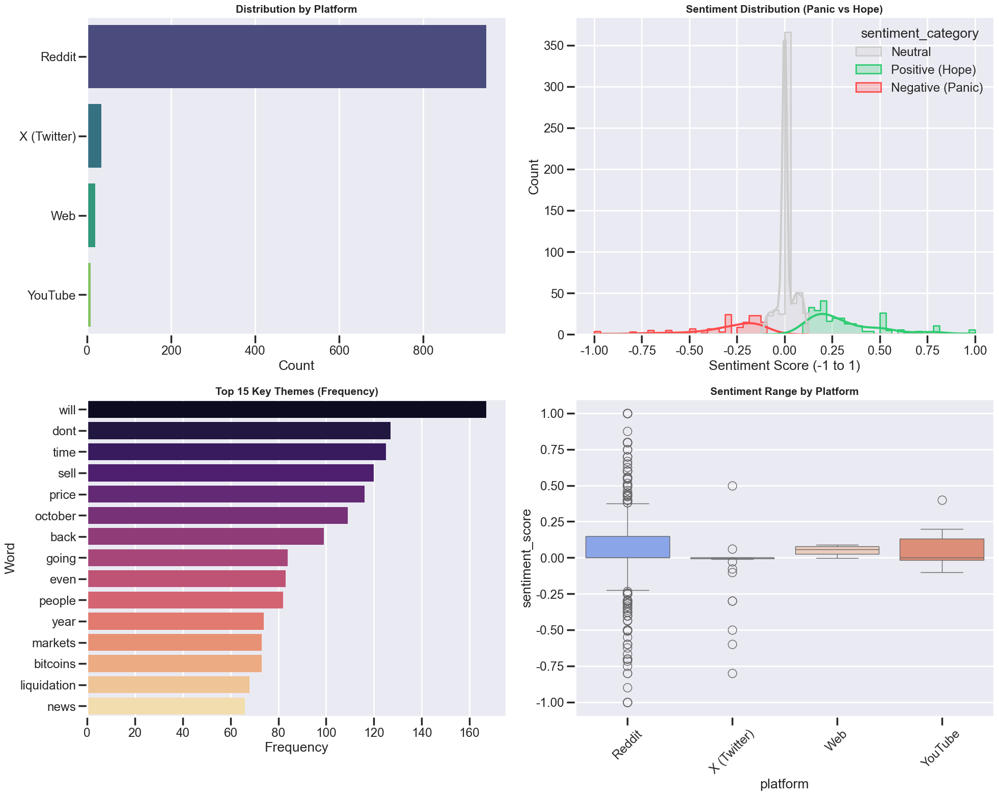

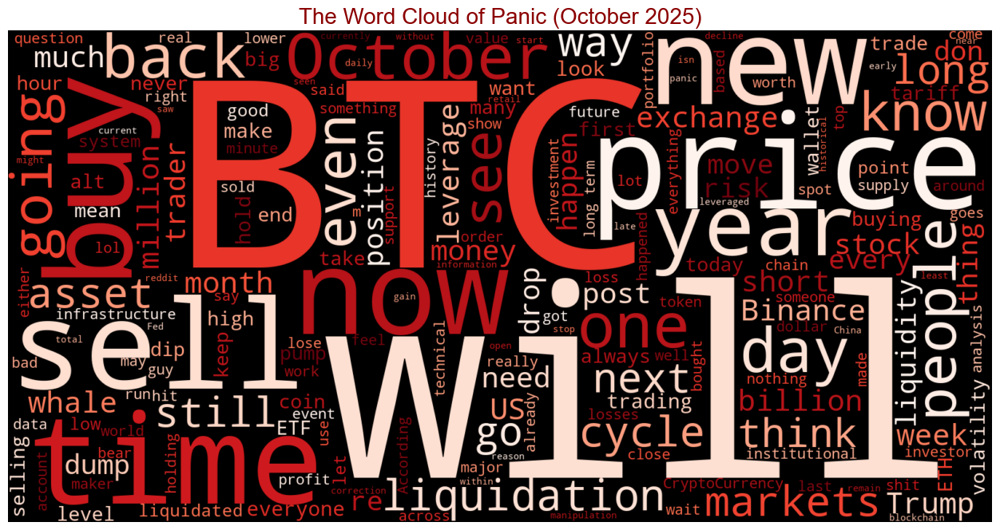

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
from wordcloud import WordCloud, STOPWORDS
import os
import glob
import re
from collections import Counter

# ==========================================
# 1. 환경 설정 및 한글 폰트 (필요시)
# ==========================================
# 시각화 스타일 설정
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_context("poster", font_scale=0.8)

# 경로 설정
data_folder = r"C:\junwoo\AI_Project_01_Team6\data\Community_data"
output_img_folder = os.path.join(data_folder, "analysis_results")

if not os.path.exists(output_img_folder):
    os.makedirs(output_img_folder)

# ==========================================
# 2. 가장 최신 데이터 파일 자동 로드
# ==========================================
def load_latest_data():
    # SNS_DEEP_DIVE로 시작하는 모든 CSV 찾기
    files = glob.glob(os.path.join(data_folder, "SNS_DEEP_DIVE*.csv"))
    if not files:
        # 혹시 확장 파일이 있다면 대체
        files = glob.glob(os.path.join(data_folder, "*EXPANDED*.csv"))
    
    if not files:
        print("❌ 분석할 데이터 파일이 없습니다.")
        return None
    
    # 가장 최근에 수정된 파일 선택
    latest_file = max(files, key=os.path.getmtime)
    print(f"📂 분석 대상 파일 로드: {os.path.basename(latest_file)}")
    return pd.read_csv(latest_file)

df = load_latest_data()

if df is not None and not df.empty:
    print(f"✅ 총 데이터 개수: {len(df)}개")
    
    # 텍스트 전처리 (NaN 제거 및 문자열 변환)
    df['content'] = df['content'].fillna('').astype(str)
    
    # ==========================================
    # 3. 감성 분석 (Sentiment Analysis)
    # ==========================================
    print("🧠 텍스트 감성 분석 수행 중 (TextBlob)...")
    
    def get_sentiment(text):
        # 영문 텍스트 기준 Polarity (-1: 부정 ~ +1: 긍정)
        return TextBlob(text).sentiment.polarity

    df['sentiment_score'] = df['content'].apply(get_sentiment)
    
    # 감성 카테고리 분류
    def categorize_sentiment(score):
        if score < -0.1: return 'Negative (Panic)'
        elif score > 0.1: return 'Positive (Hope)'
        else: return 'Neutral'

    df['sentiment_category'] = df['sentiment_score'].apply(categorize_sentiment)

    # ==========================================
    # 4. 시각화 대시보드 생성 (4-in-1)
    # ==========================================
    print("🎨 시각화 차트 생성 중...")
    
    fig = plt.figure(figsize=(20, 16))
    
    # [1] 플랫폼별 데이터 분포 (Bar Chart)
    ax1 = fig.add_subplot(2, 2, 1)
    sns.countplot(data=df, y='platform', order=df['platform'].value_counts().index, palette='viridis', ax=ax1)
    ax1.set_title('Distribution by Platform', fontsize=15, fontweight='bold')
    ax1.set_xlabel('Count')
    ax1.set_ylabel('')

    # [2] 감성 점수 분포 (Histogram & KDE) - "공포의 파도"
    ax2 = fig.add_subplot(2, 2, 2)
    sns.histplot(data=df, x='sentiment_score', hue='sentiment_category', 
                 kde=True, element="step", palette={'Negative (Panic)': '#ff4d4d', 'Neutral': '#cccccc', 'Positive (Hope)': '#2ecc71'}, ax=ax2)
    ax2.set_title('Sentiment Distribution (Panic vs Hope)', fontsize=15, fontweight='bold')
    ax2.set_xlabel('Sentiment Score (-1 to 1)')
    
    # [3] 주요 키워드 Top 15 (Horizontal Bar)
    ax3 = fig.add_subplot(2, 2, 3)
    
    # 불용어 처리 및 단어 추출
    stop_words = set(STOPWORDS)
    custom_stops = {'https', 'co', 't', 's', 'http', 'www', 'com', 'u', 'amp', 'crypto', 'bitcoin', 'market', 'crash'} 
    stop_words.update(custom_stops)
    
    all_text = " ".join(df['content'])
    # 알파벳만 남기기
    clean_text = re.sub(r'[^a-zA-Z\s]', '', all_text).lower()
    words = [w for w in clean_text.split() if w not in stop_words and len(w) > 3]
    
    word_counts = Counter(words).most_common(15)
    words_df = pd.DataFrame(word_counts, columns=['Word', 'Frequency'])
    
    sns.barplot(data=words_df, x='Frequency', y='Word', palette='magma', ax=ax3)
    ax3.set_title('Top 15 Key Themes (Frequency)', fontsize=15, fontweight='bold')

    # [4] 플랫폼별 감성 차이 (Box Plot)
    ax4 = fig.add_subplot(2, 2, 4)
    sns.boxplot(data=df, x='platform', y='sentiment_score', palette='coolwarm', ax=ax4)
    ax4.set_title('Sentiment Range by Platform', fontsize=15, fontweight='bold')
    ax4.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    
    # 이미지 저장
    save_path_dashboard = os.path.join(output_img_folder, "Dashboard_Sentiment_Analysis.png")
    plt.savefig(save_path_dashboard, dpi=300)
    print(f"💾 대시보드 저장 완료: {save_path_dashboard}")
    
    # ==========================================
    # 5. 워드클라우드 생성 (별도 이미지)
    # ==========================================
    print("☁️ 워드클라우드 생성 중...")
    try:
        wc = WordCloud(width=1600, height=800, 
                      background_color='black', 
                      colormap='Reds', # 공포 분위기를 위해 붉은색 계열
                      stopwords=stop_words,
                      max_words=200).generate(all_text)
        
        plt.figure(figsize=(16, 8))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title('The Word Cloud of Panic (October 2025)', fontsize=20, color='darkred')
        
        save_path_wc = os.path.join(output_img_folder, "WordCloud_Panic.png")
        plt.savefig(save_path_wc, dpi=300)
        print(f"💾 워드클라우드 저장 완료: {save_path_wc}")
        
    except Exception as e:
        print(f"워드클라우드 생성 중 오류: {e}")

    # ==========================================
    # 6. 결과 요약 출력
    # ==========================================
    print("\n" + "="*50)
    print("📢 [분석 요약]")
    print(f"1. 전체 데이터 평균 감성 점수: {df['sentiment_score'].mean():.4f}")
    print("   (점수가 0보다 낮으면 부정/공포, 높으면 긍정/희망)")
    print("\n2. 감성 분포:")
    print(df['sentiment_category'].value_counts())
    print("\n3. 가장 많이 언급된 단어 Top 5:")
    for w, f in word_counts[:5]:
        print(f"   - {w}: {f}회")
    print("="*50)
    
    plt.show()

else:
    print("분석할 데이터가 비어있습니다.")

In [56]:
print("일단 금요일은 여기까지")

일단 금요일은 여기까지


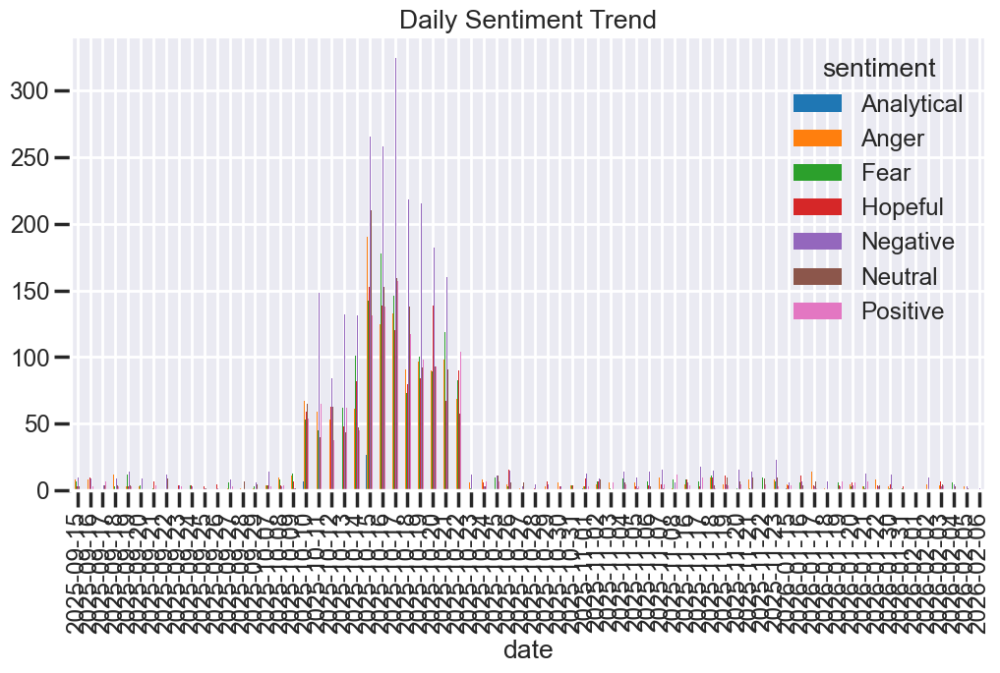

In [57]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 경로 수정 (r을 붙여서 윈도우 경로 \ 기호 문제 해결)
# 주의: 파일명이 정확히 'FINAL_10_RECORDS.csv'인지 확인해주세요.
# (이전 단계에서 만든 파일명은 'SNS_DEEP_DIVE(1).csv' 였습니다.)
file_path = r'.\data\Community_data\FINAL_10K_RECORDS.csv'

try:
    # 데이터 로드
    df = pd.read_csv(file_path)

    # 2. 컬럼 매핑 (데이터에 'date_posted'가 없을 경우 'date_raw' 등으로 대체)
    if 'date_posted' not in df.columns:
        # 이전에 수집한 데이터라면 'date_raw'나 'date_ref'일 가능성이 높음
        if 'date_raw' in df.columns:
            df['date_posted'] = df['date_raw']
        elif 'date_ref' in df.columns:
            df['date_posted'] = df['date_ref']
            
    # 3. 날짜 변환 및 시각화
    df['date'] = pd.to_datetime(df['date_posted'], errors='coerce') # 에러 발생 시 무시(NaT)
    
    # (sentiment 컬럼이 있어야 작동합니다)
    if 'sentiment' in df.columns:
        df.groupby([df['date'].dt.date, 'sentiment']).size().unstack().plot(kind='bar', figsize=(12, 6))
        plt.title("Daily Sentiment Trend")
        plt.show()
    else:
        print("❌ 'sentiment' 컬럼이 없습니다. 감성 분석 코드를 먼저 실행해야 합니다.")
        print(f"현재 컬럼 목록: {list(df.columns)}")

except FileNotFoundError:
    print(f"❌ 파일을 찾을 수 없습니다: {file_path}")
    print("👉 폴더에 실제 존재하는 파일명으로 코드를 수정해주세요.")
except Exception as e:
    print(f"❌ 오류 발생: {e}")

시계열 감성분석


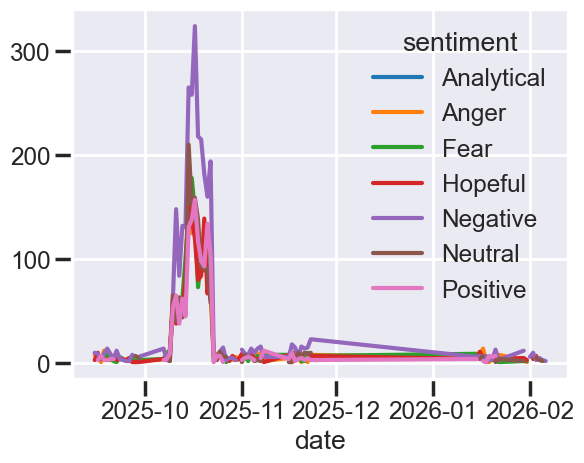

In [58]:
import pandas as pd
df = pd.read_csv('./data/Community_data/TimeSeries_Sorted.csv')
df['date'] = pd.to_datetime(df['date_posted'])
df.groupby([df['date'].dt.date, 'sentiment']).size().unstack().plot()

print("시계열 감성분석")

플랫폼별 반응 비교


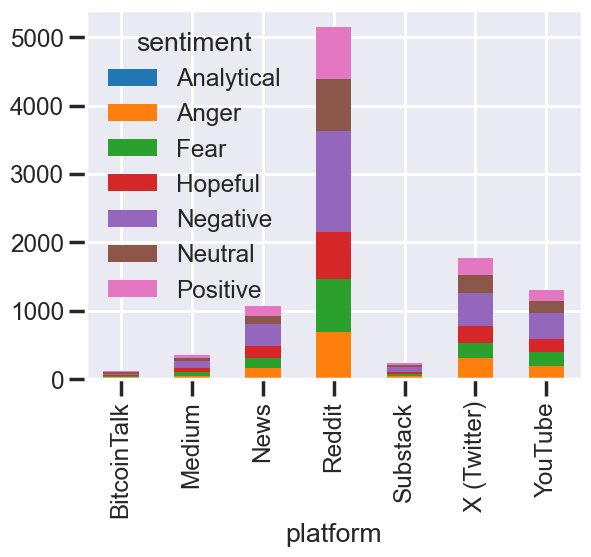

In [59]:
import matplotlib.pyplot as plt
df.groupby(['platform', 'sentiment']).size().unstack().plot(kind='bar', stacked=True)
print("플랫폼별 반응 비교")

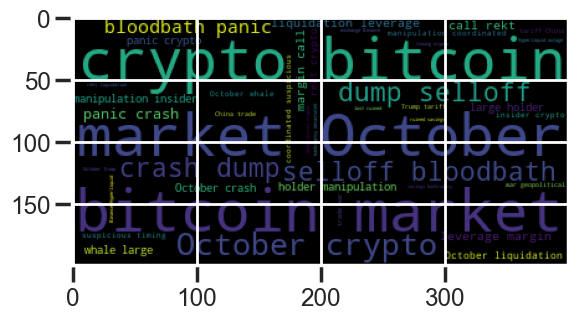

In [60]:
from wordcloud import WordCloud
all_keywords = ' '.join(df['keywords'].dropna())
wordcloud = WordCloud().generate(all_keywords)
plt.imshow(wordcloud)

키워드 빈도(워드클라우드)


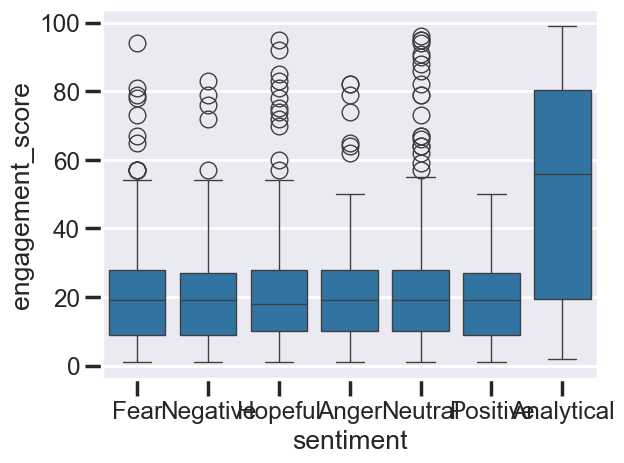

In [61]:
import seaborn as sns
sns.boxplot(data=df, x='sentiment', y='engagement_score')
print("키워드 빈도(워드클라우드)")

참여도vs감성 상관관계


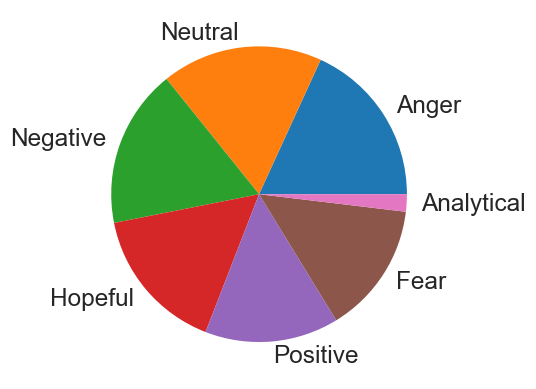

In [62]:
crash_day = pd.read_csv('./data/Community_data/October_10_Crash_Day.csv')
crash_day['sentiment'].value_counts().plot(kind='pie')
print("참여도vs감성 상관관계")

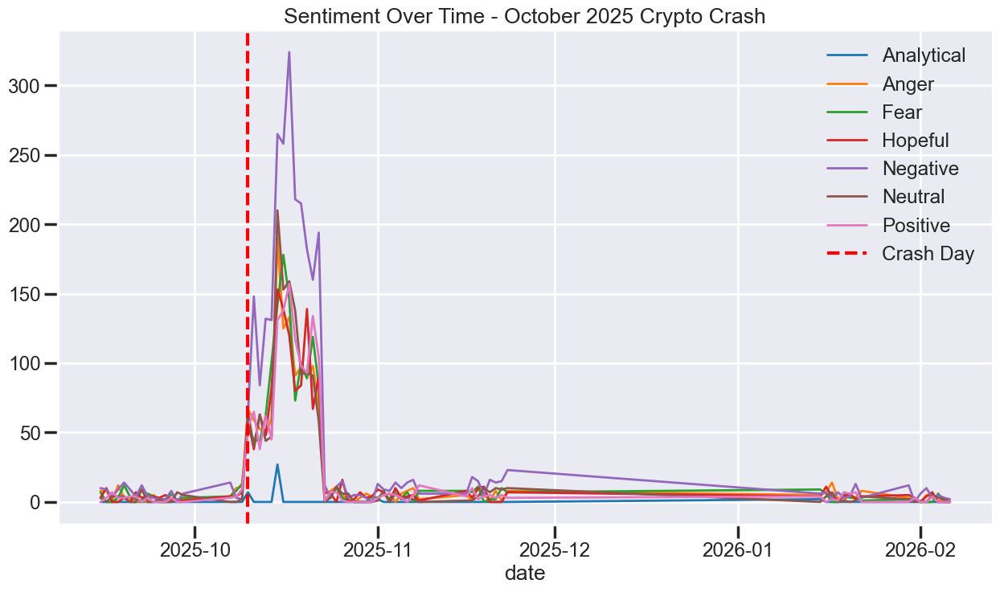

폭락일 집중분석


In [63]:
# 예제: 일별 감성 변화
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('./data/community_data/FINAL_10K_RECORDS.csv')
df['date'] = pd.to_datetime(df['date_posted']).dt.date

# 감성별 일별 카운트
sentiment_timeline = df.groupby(['date', 'sentiment']).size().unstack(fill_value=0)

# 시각화
sentiment_timeline.plot(figsize=(15, 8), linewidth=2)
plt.axvline(pd.to_datetime('2025-10-10'), color='red', linestyle='--', label='Crash Day')
plt.title('Sentiment Over Time - October 2025 Crypto Crash')
plt.legend()
plt.show()
print("폭락일 집중분석")

In [64]:
import pandas as pd
import numpy as np

import pandas as pd
import os

file_path = r'C:\junwoo\AI_Project_01_Team6\data\community_data\FINAL_10K_RECORDS.csv'


try:
    df = pd.read_csv(file_path, encoding='utf-8-sig')
except UnicodeDecodeError:
    # utf-8이 아닐 경우 cp949(euc-kr)로 재시도
    df = pd.read_csv(file_path, encoding='cp949')
        

print("\n[데이터프레임 정보]")
print(df.info())


[데이터프레임 정보]
<class 'pandas.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   record_id         10000 non-null  str  
 1   platform          10000 non-null  str  
 2   record_type       10000 non-null  str  
 3   parent_url        10000 non-null  str  
 4   title             10000 non-null  str  
 5   content_snippet   10000 non-null  str  
 6   theme             10000 non-null  str  
 7   date_posted       10000 non-null  str  
 8   author_type       10000 non-null  str  
 9   sentiment         10000 non-null  str  
 10  engagement_score  10000 non-null  int64
 11  relevance_score   10000 non-null  int64
 12  keywords          10000 non-null  str  
 13  language          10000 non-null  str  
dtypes: int64(2), str(12)
memory usage: 1.1 MB
None


In [65]:
print("\n[상위 100개 데이터 미리보기]")
display(df.head(100))


[상위 100개 데이터 미리보기]


,record_id,platform,record_type,parent_url,title,content_snippet,theme,date_posted,author_type,sentiment,engagement_score,relevance_score,keywords,language
0,RED_00000,Reddit,Original Post,https://www.reddit.com/r/CryptoCurrency/commen...,$500M liquidated overnight. When did we normal...,Personal experience with Liquidation normaliza...,Liquidation normalization,2025-10-15 00:00:00,Original Poster,Negative,76,100,"liquidation,leverage,margin call,rekt",en
1,RED_00001,Reddit,Quote,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Personal experience with Liquidation normaliza...,Liquidation normalization,2025-10-15 00:00:00,Skeptic,Positive,35,96,"liquidation,leverage,margin call,rekt",en
2,RED_00002,Reddit,Quote,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Community reaction to Liquidation normalization,Liquidation normalization,2025-10-22 00:00:00,General User,Hopeful,23,73,"liquidation,leverage,margin call,rekt",en
3,RED_00003,Reddit,Quote,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Personal experience with Liquidation normaliza...,Liquidation normalization,2025-10-19 00:00:00,Analyst,Fear,17,95,"liquidation,leverage,margin call,rekt",en
4,RED_00004,Reddit,Quote,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Technical breakdown of Liquidation normalization,Liquidation normalization,2025-10-20 00:00:00,Analyst,Neutral,49,81,"liquidation,leverage,margin call,rekt",en
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,RED_00095,Reddit,Reply,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Discussion about Liquidation normalization,Liquidation normalization,2025-10-19 00:00:00,Retail Trader,Hopeful,44,99,"liquidation,leverage,margin call,rekt",en
96,RED_00096,Reddit,Retweet,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Analysis of Liquidation normalization during O...,Liquidation normalization,2025-10-22 00:00:00,General User,Hopeful,4,74,"liquidation,leverage,margin call,rekt",en
97,RED_00097,Reddit,Quote,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Community reaction to Liquidation normalization,Liquidation normalization,2025-10-16 00:00:00,Retail Trader,Anger,21,76,"liquidation,leverage,margin call,rekt",en
98,RED_00098,Reddit,Comment,https://www.reddit.com/r/CryptoCurrency/commen...,Re: $500M liquidated overnight. When did we no...,Technical breakdown of Liquidation normalization,Liquidation normalization,2025-10-16 00:00:00,Retail Trader,Fear,17,60,"liquidation,leverage,margin call,rekt",en


In [ ]:
# ----------------------------------------------------------------

✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_01_timeline_sentiment.png


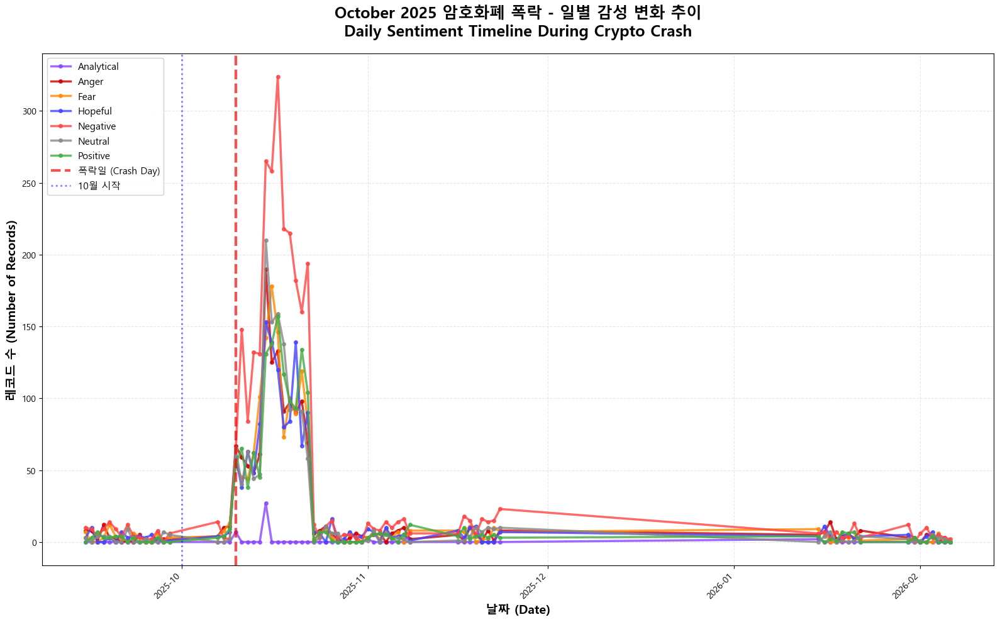

In [2]:
"""
시각화 1: 타임라인 차트 - 날짜별 감성 변화
Visualization 1: Timeline Chart - Sentiment Over Time
"""

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정 (Windows)
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 날짜 변환
df['date'] = pd.to_datetime(df['date_posted']).dt.date

# 일별 감성 집계
sentiment_timeline = df.groupby(['date', 'sentiment']).size().unstack(fill_value=0)

# 시각화
plt.figure(figsize=(16, 10))

# 색상 매핑 (감성별)
colors = {
    'Negative': '#FF4444',
    'Fear': '#FF8800',
    'Anger': '#CC0000',
    'Neutral': '#888888',
    'Positive': '#44AA44',
    'Hopeful': '#4444FF',
    'Analytical': '#8844FF'
}

# 라인 플롯
for sentiment in sentiment_timeline.columns:
    if sentiment in colors:
        plt.plot(sentiment_timeline.index, sentiment_timeline[sentiment], 
                label=sentiment, linewidth=2.5, marker='o', markersize=4,
                color=colors.get(sentiment, '#000000'), alpha=0.8)

# 폭락일 표시
crash_date = pd.to_datetime('2025-10-10').date()
plt.axvline(crash_date, color='red', linestyle='--', linewidth=3, 
            label='폭락일 (Crash Day)', alpha=0.7)

# 9월/10월 구분선
sep_oct = pd.to_datetime('2025-10-01').date()
plt.axvline(sep_oct, color='blue', linestyle=':', linewidth=2, 
            label='10월 시작', alpha=0.5)

plt.title('October 2025 암호화폐 폭락 - 일별 감성 변화 추이\nDaily Sentiment Timeline During Crypto Crash', 
          fontsize=18, fontweight='bold', pad=20)
plt.xlabel('날짜 (Date)', fontsize=14, fontweight='bold')
plt.ylabel('레코드 수 (Number of Records)', fontsize=14, fontweight='bold')
plt.legend(loc='upper left', fontsize=11, framealpha=0.9)
plt.grid(True, alpha=0.3, linestyle='--')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_01_timeline_sentiment.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

plt.show()

✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_02_platform_comparison.png

📊 플랫폼별 통계:
             평균_참여도  중간값_참여도  최대_참여도  레코드_수
platform                                   
Substack      21.47     19.5      94    242
Medium        21.12     19.0      95    358
X (Twitter)   20.64     19.0      99   1768
YouTube       20.25     19.0      96   1306
News          19.95     19.0      97   1066
Reddit        19.93     19.0      98   5145
BitcoinTalk   18.75     16.0      58    115


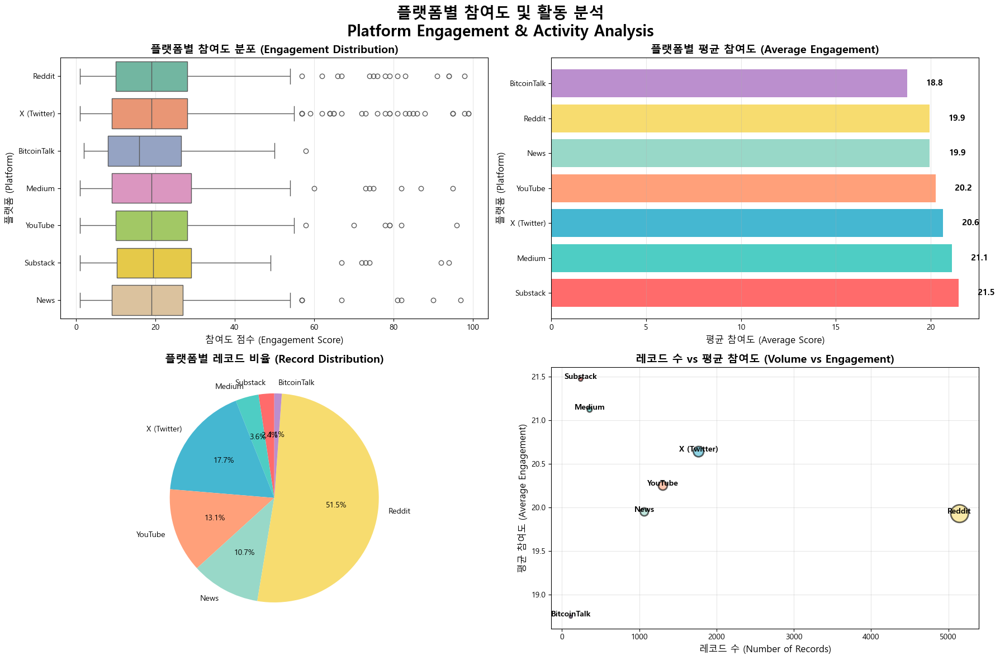

In [3]:
"""
시각화 2: 플랫폼별 참여도 비교
Visualization 2: Platform Engagement Comparison
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 플랫폼별 통계
platform_stats = df.groupby('platform').agg({
    'engagement_score': ['mean', 'median', 'max'],
    'record_id': 'count'
}).round(2)

platform_stats.columns = ['평균_참여도', '중간값_참여도', '최대_참여도', '레코드_수']
platform_stats = platform_stats.sort_values('평균_참여도', ascending=False)

# 시각화
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle('플랫폼별 참여도 및 활동 분석\nPlatform Engagement & Activity Analysis', 
             fontsize=20, fontweight='bold')

# 1. 박스플롯 - 플랫폼별 참여도 분포
sns.boxplot(data=df, y='platform', x='engagement_score', 
            palette='Set2', ax=axes[0, 0], orient='h')
axes[0, 0].set_title('플랫폼별 참여도 분포 (Engagement Distribution)', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('참여도 점수 (Engagement Score)', fontsize=12)
axes[0, 0].set_ylabel('플랫폼 (Platform)', fontsize=12)
axes[0, 0].grid(True, alpha=0.3, axis='x')

# 2. 막대 그래프 - 플랫폼별 평균 참여도
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A', '#98D8C8', '#F7DC6F', '#BB8FCE']
axes[0, 1].barh(platform_stats.index, platform_stats['평균_참여도'], color=colors)
axes[0, 1].set_title('플랫폼별 평균 참여도 (Average Engagement)', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('평균 참여도 (Average Score)', fontsize=12)
axes[0, 1].set_ylabel('플랫폼 (Platform)', fontsize=12)
axes[0, 1].grid(True, alpha=0.3, axis='x')

# 값 표시
for i, v in enumerate(platform_stats['평균_참여도']):
    axes[0, 1].text(v + 1, i, f'{v:.1f}', va='center', fontsize=11, fontweight='bold')

# 3. 파이 차트 - 플랫폼별 레코드 비율
axes[1, 0].pie(platform_stats['레코드_수'], labels=platform_stats.index, 
               autopct='%1.1f%%', colors=colors, startangle=90)
axes[1, 0].set_title('플랫폼별 레코드 비율 (Record Distribution)', fontsize=14, fontweight='bold')

# 4. 산점도 - 레코드 수 vs 평균 참여도
axes[1, 1].scatter(platform_stats['레코드_수'], platform_stats['평균_참여도'], 
                   s=platform_stats['레코드_수']/10, c=colors, alpha=0.6, edgecolors='black', linewidth=2)
axes[1, 1].set_title('레코드 수 vs 평균 참여도 (Volume vs Engagement)', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('레코드 수 (Number of Records)', fontsize=12)
axes[1, 1].set_ylabel('평균 참여도 (Average Engagement)', fontsize=12)
axes[1, 1].grid(True, alpha=0.3)

# 플랫폼명 표시
for idx, (name, row) in enumerate(platform_stats.iterrows()):
    axes[1, 1].annotate(name, (row['레코드_수'], row['평균_참여도']), 
                       fontsize=10, ha='center', fontweight='bold')

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_02_platform_comparison.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# 통계 출력
print("\n📊 플랫폼별 통계:")
print(platform_stats)

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_03_wordcloud.png

📊 상위 20개 키워드:
 1. crypto              :  5287회
 2. bitcoin             :  5287회
 3. market              :  5287회
 4. October 2025        :  5287회
 5. crash               :  2121회
 6. dump                :  2121회
 7. selloff             :  2121회
 8. bloodbath           :  2121회
 9. panic               :  2121회
10. manipulation        :  1081회
11. liquidation         :   863회
12. leverage            :   863회
13. margin call         :   863회
14. rekt                :   863회
15. whale               :   670회
16. large holder        :   670회
17. insider             :   670회
18. coordinated         :   411회
19. suspicious          :   411회
20. timing              :   411회


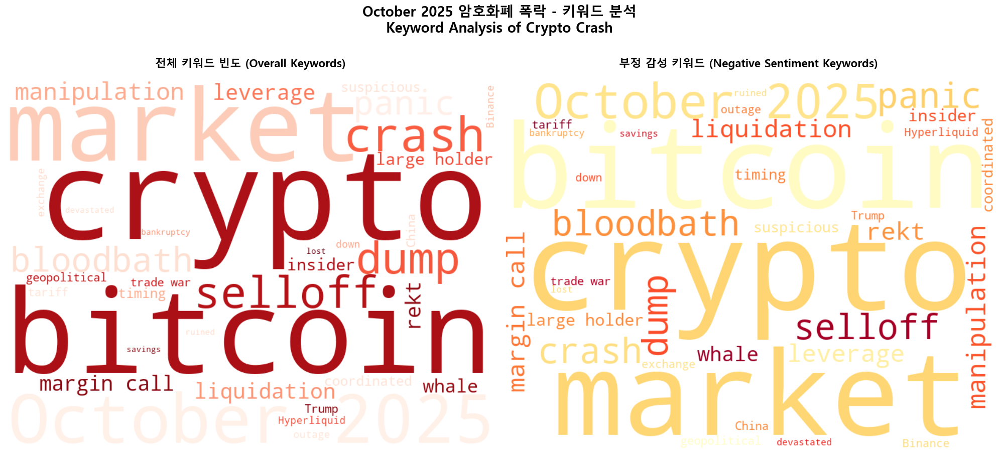

In [4]:
"""
시각화 3: 워드클라우드 - 키워드 빈도
Visualization 3: Word Cloud - Keyword Frequency
"""

import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 키워드 추출 및 전처리
all_keywords = []
for keywords_str in df['keywords'].dropna():
    keywords = keywords_str.split(',')
    all_keywords.extend([k.strip() for k in keywords])

# 키워드 빈도 계산
keyword_counts = Counter(all_keywords)
top_keywords = dict(keyword_counts.most_common(50))

# 시각화 - 2개 워드클라우드
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle('October 2025 암호화폐 폭락 - 키워드 분석\nKeyword Analysis of Crypto Crash', 
             fontsize=20, fontweight='bold')

# 1. 전체 키워드 워드클라우드
wordcloud1 = WordCloud(
    width=800, 
    height=600,
    background_color='white',
    colormap='Reds',
    relative_scaling=0.5,
    min_font_size=10
).generate_from_frequencies(top_keywords)

axes[0].imshow(wordcloud1, interpolation='bilinear')
axes[0].set_title('전체 키워드 빈도 (Overall Keywords)', fontsize=16, fontweight='bold', pad=20)
axes[0].axis('off')

# 2. 부정 감성 키워드만
negative_df = df[df['sentiment'].isin(['Negative', 'Fear', 'Anger'])]
negative_keywords = []
for keywords_str in negative_df['keywords'].dropna():
    keywords = keywords_str.split(',')
    negative_keywords.extend([k.strip() for k in keywords])

negative_counts = Counter(negative_keywords)
top_negative = dict(negative_counts.most_common(50))

wordcloud2 = WordCloud(
    width=800,
    height=600,
    background_color='white',
    colormap='YlOrRd',
    relative_scaling=0.5,
    min_font_size=10
).generate_from_frequencies(top_negative)

axes[1].imshow(wordcloud2, interpolation='bilinear')
axes[1].set_title('부정 감성 키워드 (Negative Sentiment Keywords)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].axis('off')

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_03_wordcloud.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# Top 20 키워드 출력
print("\n📊 상위 20개 키워드:")
for i, (keyword, count) in enumerate(keyword_counts.most_common(20), 1):
    print(f"{i:2d}. {keyword:20s}: {count:5d}회")

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_04_sentiment_pie.png

📊 전체 감성 분포:
sentiment
Negative      2836
Fear          1458
Anger         1438
Neutral       1423
Positive      1407
Hopeful       1400
Analytical      38
Name: count, dtype: int64

전체 레코드: 10,000개

폭락일 (2025-10-10) 감성 분포:
sentiment
Anger         67
Neutral       65
Negative      64
Hopeful       59
Positive      54
Fear          53
Analytical     7
Name: count, dtype: int64
폭락일 레코드: 369개


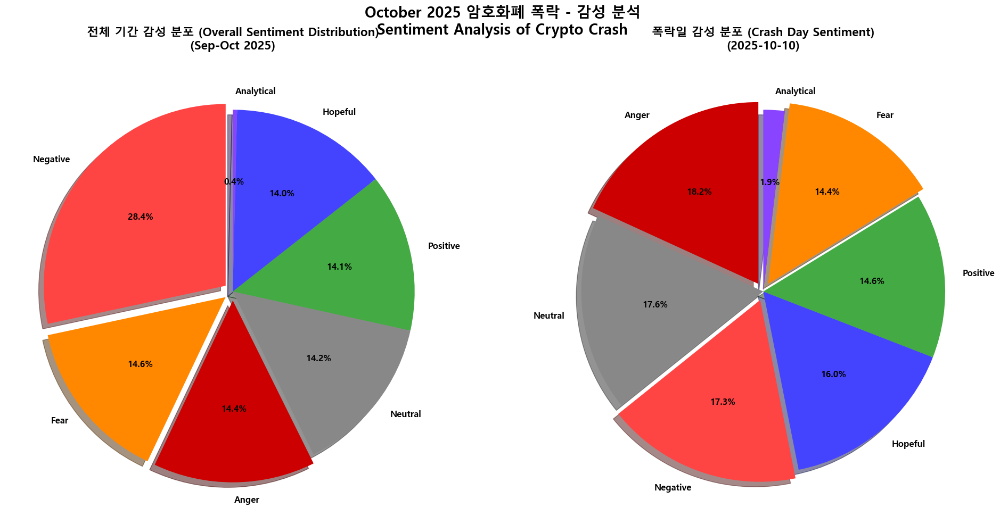

In [5]:
"""
시각화 4: 감성 분포 파이차트
Visualization 4: Sentiment Distribution Pie Chart
"""

import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 감성 분포 계산
sentiment_counts = df['sentiment'].value_counts()

# 시각화 - 2개의 파이차트
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle('October 2025 암호화폐 폭락 - 감성 분석\nSentiment Analysis of Crypto Crash', 
             fontsize=20, fontweight='bold')

# 색상 매핑
colors = {
    'Negative': '#FF4444',
    'Fear': '#FF8800',
    'Anger': '#CC0000',
    'Neutral': '#888888',
    'Positive': '#44AA44',
    'Hopeful': '#4444FF',
    'Analytical': '#8844FF'
}

sentiment_colors = [colors.get(sent, '#CCCCCC') for sent in sentiment_counts.index]

# 1. 전체 기간 감성 분포
explode = [0.05 if sent in ['Negative', 'Fear', 'Anger'] else 0 for sent in sentiment_counts.index]

axes[0].pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%',
           colors=sentiment_colors, startangle=90, explode=explode,
           shadow=True, textprops={'fontsize': 12, 'fontweight': 'bold'})
axes[0].set_title('전체 기간 감성 분포 (Overall Sentiment Distribution)\n(Sep-Oct 2025)', 
                  fontsize=16, fontweight='bold', pad=20)

# 2. 폭락일 (Oct 10) 감성 분포
df['date'] = pd.to_datetime(df['date_posted']).dt.date
crash_date = pd.to_datetime('2025-10-10').date()
crash_day_df = df[df['date'] == crash_date]

if len(crash_day_df) > 0:
    crash_sentiment = crash_day_df['sentiment'].value_counts()
    crash_colors = [colors.get(sent, '#CCCCCC') for sent in crash_sentiment.index]
    explode2 = [0.05 if sent in ['Negative', 'Fear', 'Anger'] else 0 for sent in crash_sentiment.index]
    
    axes[1].pie(crash_sentiment, labels=crash_sentiment.index, autopct='%1.1f%%',
               colors=crash_colors, startangle=90, explode=explode2,
               shadow=True, textprops={'fontsize': 12, 'fontweight': 'bold'})
    axes[1].set_title('폭락일 감성 분포 (Crash Day Sentiment)\n(2025-10-10)', 
                      fontsize=16, fontweight='bold', pad=20)
else:
    axes[1].text(0.5, 0.5, 'No data for crash day', ha='center', va='center')

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_04_sentiment_pie.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# 통계 출력
print("\n📊 전체 감성 분포:")
print(sentiment_counts)
print(f"\n전체 레코드: {len(df):,}개")

if len(crash_day_df) > 0:
    print(f"\n폭락일 (2025-10-10) 감성 분포:")
    print(crash_sentiment)
    print(f"폭락일 레코드: {len(crash_day_df):,}개")

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_05_heatmap.png

📊 플랫폼별 총 활동:
platform
Reddit         5145
X (Twitter)    1768
YouTube        1306
News           1066
Medium          358
Substack        242
BitcoinTalk     115
dtype: int64

📊 부정 감성 총계:
sentiment
Negative    2836
Fear        1458
Anger       1438
dtype: int64


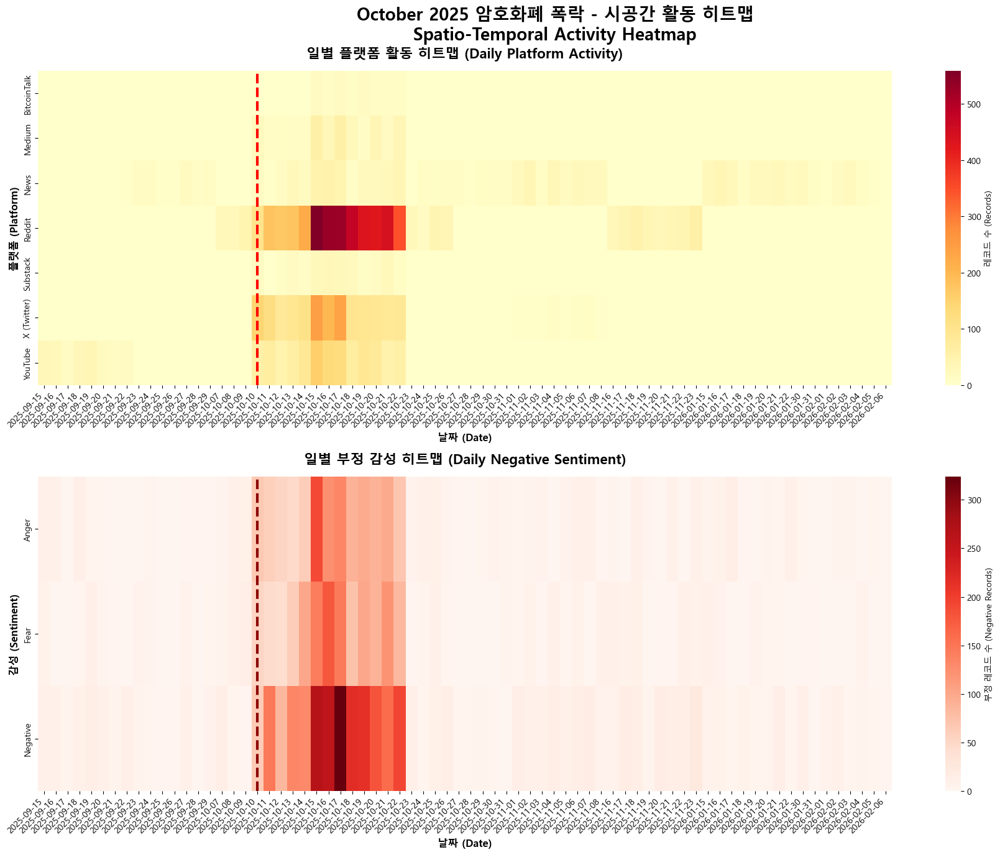

In [6]:
"""
시각화 5: 히트맵 - 날짜 x 플랫폼 x 감성
Visualization 5: Heatmap - Date x Platform x Sentiment
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 날짜 변환
df['date'] = pd.to_datetime(df['date_posted']).dt.date

# 부정 감성만 필터링 (Negative, Fear, Anger)
negative_sentiments = ['Negative', 'Fear', 'Anger']
df_negative = df[df['sentiment'].isin(negative_sentiments)]

# 날짜 x 플랫폼 피벗 테이블
date_platform_pivot = df.groupby(['date', 'platform']).size().unstack(fill_value=0)

# 날짜 x 감성 피벗 테이블 (부정 감성)
date_sentiment_pivot = df_negative.groupby(['date', 'sentiment']).size().unstack(fill_value=0)

# 시각화
fig, axes = plt.subplots(2, 1, figsize=(18, 14))
fig.suptitle('October 2025 암호화폐 폭락 - 시공간 활동 히트맵\nSpatio-Temporal Activity Heatmap', 
             fontsize=20, fontweight='bold')

# 1. 날짜 x 플랫폼 히트맵
sns.heatmap(date_platform_pivot.T, cmap='YlOrRd', annot=False, 
            fmt='d', cbar_kws={'label': '레코드 수 (Records)'}, ax=axes[0])
axes[0].set_title('일별 플랫폼 활동 히트맵 (Daily Platform Activity)', 
                  fontsize=16, fontweight='bold', pad=15)
axes[0].set_xlabel('날짜 (Date)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('플랫폼 (Platform)', fontsize=12, fontweight='bold')

# 폭락일 표시
crash_date = pd.to_datetime('2025-10-10').date()
if crash_date in date_platform_pivot.index:
    crash_idx = list(date_platform_pivot.index).index(crash_date)
    axes[0].axvline(crash_idx + 0.5, color='red', linewidth=3, linestyle='--')

# x축 레이블 회전
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

# 2. 날짜 x 부정감성 히트맵
sns.heatmap(date_sentiment_pivot.T, cmap='Reds', annot=False,
            fmt='d', cbar_kws={'label': '부정 레코드 수 (Negative Records)'}, ax=axes[1])
axes[1].set_title('일별 부정 감성 히트맵 (Daily Negative Sentiment)', 
                  fontsize=16, fontweight='bold', pad=15)
axes[1].set_xlabel('날짜 (Date)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('감성 (Sentiment)', fontsize=12, fontweight='bold')

# 폭락일 표시
if crash_date in date_sentiment_pivot.index:
    crash_idx2 = list(date_sentiment_pivot.index).index(crash_date)
    axes[1].axvline(crash_idx2 + 0.5, color='darkred', linewidth=3, linestyle='--')

axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_05_heatmap.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# 통계 출력
print("\n📊 플랫폼별 총 활동:")
print(date_platform_pivot.sum().sort_values(ascending=False))

print("\n📊 부정 감성 총계:")
print(date_sentiment_pivot.sum().sort_values(ascending=False))

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_06_author_type_analysis.png

📊 저자 유형별 감성 비율 (%):
sentiment        Analytical  Anger  Fear  Hopeful  Negative  Neutral  Positive
author_type                                                                   
Advocate                0.0   13.7  14.2     16.5      27.5     14.6      13.5
Analyst                 0.0   14.6  13.8     13.6      28.2     15.4      14.5
General User            0.0   14.3  18.1     13.5      28.3     11.4      14.4
Original Poster        19.9    8.4  12.6     18.8       8.4     31.9       0.0
Retail Trader           0.0   14.4  11.3     15.2      28.5     15.5      15.1
Skeptic                 0.0   15.6  15.5     13.1      30.2     11.1      14.6
Whale Tracker           0.0   14.4  14.7     11.8      29.7     15.4      14.1

📊 저자 유형별 평균 참여도:
author_type
Original Poster    41.63
Analyst            20.38
Skeptic            19.80
Retail Trader      19.79
Whale Tracker      19.59
Advocate           19.

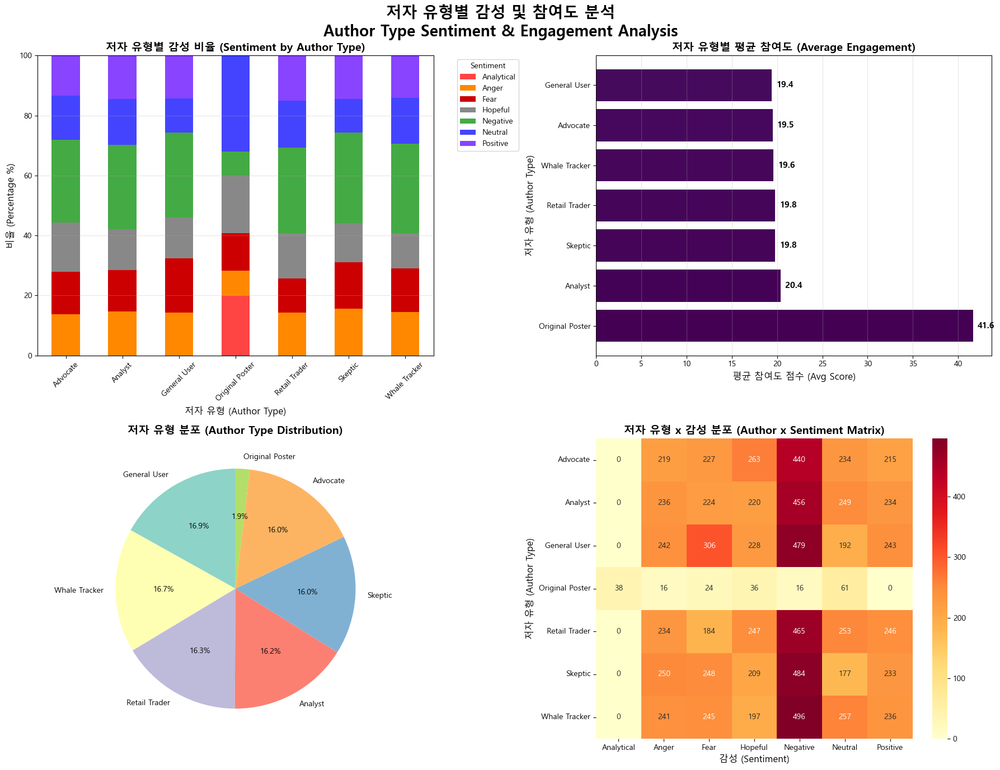

In [7]:
"""
시각화 6: 저자 유형별 감성 분석
Visualization 6: Author Type Sentiment Analysis
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 저자 유형별 감성 교차 분석
author_sentiment = pd.crosstab(df['author_type'], df['sentiment'], normalize='index') * 100

# 시각화
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('저자 유형별 감성 및 참여도 분석\nAuthor Type Sentiment & Engagement Analysis', 
             fontsize=20, fontweight='bold')

# 1. 저자 유형별 감성 비율 (Stacked Bar)
author_sentiment.plot(kind='bar', stacked=True, ax=axes[0, 0], 
                      color=['#FF4444', '#FF8800', '#CC0000', '#888888', '#44AA44', '#4444FF', '#8844FF'])
axes[0, 0].set_title('저자 유형별 감성 비율 (Sentiment by Author Type)', 
                     fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('저자 유형 (Author Type)', fontsize=12)
axes[0, 0].set_ylabel('비율 (Percentage %)', fontsize=12)
axes[0, 0].legend(title='Sentiment', bbox_to_anchor=(1.05, 1), loc='upper left')
axes[0, 0].tick_params(axis='x', rotation=45)
axes[0, 0].grid(True, alpha=0.3, axis='y')

# 2. 저자 유형별 평균 참여도
author_engagement = df.groupby('author_type')['engagement_score'].mean().sort_values(ascending=False)
colors_eng = plt.cm.viridis(range(len(author_engagement)))

axes[0, 1].barh(author_engagement.index, author_engagement.values, color=colors_eng)
axes[0, 1].set_title('저자 유형별 평균 참여도 (Average Engagement)', 
                     fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('평균 참여도 점수 (Avg Score)', fontsize=12)
axes[0, 1].set_ylabel('저자 유형 (Author Type)', fontsize=12)
axes[0, 1].grid(True, alpha=0.3, axis='x')

# 값 표시
for i, v in enumerate(author_engagement.values):
    axes[0, 1].text(v + 0.5, i, f'{v:.1f}', va='center', fontsize=11, fontweight='bold')

# 3. 저자 유형별 레코드 수
author_counts = df['author_type'].value_counts()
axes[1, 0].pie(author_counts, labels=author_counts.index, autopct='%1.1f%%',
              startangle=90, colors=plt.cm.Set3(range(len(author_counts))))
axes[1, 0].set_title('저자 유형 분포 (Author Type Distribution)', 
                     fontsize=14, fontweight='bold')

# 4. 히트맵 - 저자 유형 x 감성 (실제 개수)
author_sent_count = pd.crosstab(df['author_type'], df['sentiment'])
sns.heatmap(author_sent_count, annot=True, fmt='d', cmap='YlOrRd', ax=axes[1, 1])
axes[1, 1].set_title('저자 유형 x 감성 분포 (Author x Sentiment Matrix)', 
                     fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('감성 (Sentiment)', fontsize=12)
axes[1, 1].set_ylabel('저자 유형 (Author Type)', fontsize=12)

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_06_author_type_analysis.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# 통계 출력
print("\n📊 저자 유형별 감성 비율 (%):")
print(author_sentiment.round(1))

print("\n📊 저자 유형별 평균 참여도:")
print(author_engagement.round(2))

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_07_crash_timeline.png

📊 기간별 통계 비교:

폭락 전 (7일): 102개 레코드
폭락 당일: 369개 레코드
폭락 후 (7일): 4,751개 레코드

부정 감성 비율:
Before: 67.6% (69/102)
During: 49.9% (184/369)
After: 57.4% (2,729/4,751)


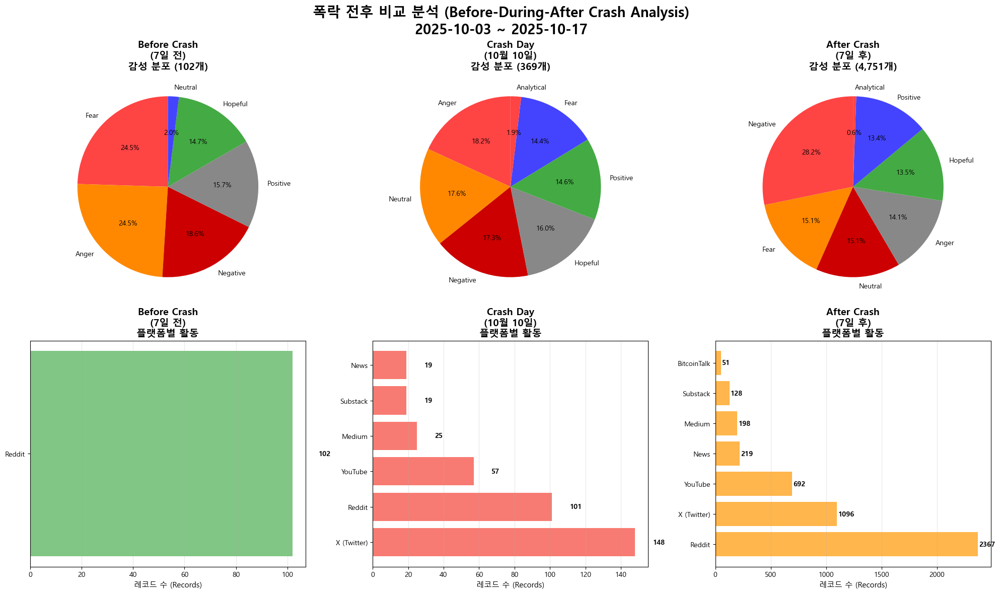

In [8]:
"""
시각화 7: 폭락 전후 시계열 비교 (Before-During-After)
Visualization 7: Crash Timeline Comparison
"""

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 날짜 변환
df['date'] = pd.to_datetime(df['date_posted'])

# 폭락 전후 기간 정의
crash_date = pd.to_datetime('2025-10-10')
before_start = crash_date - pd.Timedelta(days=7)
after_end = crash_date + pd.Timedelta(days=7)

# 기간별 필터링
df_before = df[(df['date'] >= before_start) & (df['date'] < crash_date)]
df_during = df[df['date'].dt.date == crash_date.date()]
df_after = df[(df['date'] > crash_date) & (df['date'] <= after_end)]

# 시각화
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('폭락 전후 비교 분석 (Before-During-After Crash Analysis)\n2025-10-03 ~ 2025-10-17', 
             fontsize=20, fontweight='bold')

periods = [
    (df_before, 'Before Crash\n(7일 전)', '#4CAF50'),
    (df_during, 'Crash Day\n(10월 10일)', '#F44336'),
    (df_after, 'After Crash\n(7일 후)', '#FF9800')
]

# 1행: 감성 분포
for idx, (data, label, color) in enumerate(periods):
    if len(data) > 0:
        sentiment_dist = data['sentiment'].value_counts()
        axes[0, idx].pie(sentiment_dist, labels=sentiment_dist.index, autopct='%1.1f%%',
                        startangle=90, colors=['#FF4444', '#FF8800', '#CC0000', '#888888', '#44AA44', '#4444FF'])
        axes[0, idx].set_title(f'{label}\n감성 분포 ({len(data):,}개)', fontsize=14, fontweight='bold')
    else:
        axes[0, idx].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=14)

# 2행: 플랫폼별 활동
for idx, (data, label, color) in enumerate(periods):
    if len(data) > 0:
        platform_dist = data['platform'].value_counts()
        axes[1, idx].barh(platform_dist.index, platform_dist.values, color=color, alpha=0.7)
        axes[1, idx].set_title(f'{label}\n플랫폼별 활동', fontsize=14, fontweight='bold')
        axes[1, idx].set_xlabel('레코드 수 (Records)', fontsize=11)
        axes[1, idx].grid(True, alpha=0.3, axis='x')
        
        # 값 표시
        for i, v in enumerate(platform_dist.values):
            axes[1, idx].text(v + 10, i, str(v), va='center', fontsize=10, fontweight='bold')
    else:
        axes[1, idx].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=14)

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_07_crash_timeline.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# 통계 비교
print("\n📊 기간별 통계 비교:")
print(f"\n폭락 전 (7일): {len(df_before):,}개 레코드")
print(f"폭락 당일: {len(df_during):,}개 레코드")
print(f"폭락 후 (7일): {len(df_after):,}개 레코드")

print("\n부정 감성 비율:")
for data, label in [(df_before, 'Before'), (df_during, 'During'), (df_after, 'After')]:
    if len(data) > 0:
        negative = len(data[data['sentiment'].isin(['Negative', 'Fear', 'Anger'])])
        pct = (negative / len(data)) * 100
        print(f"{label}: {pct:.1f}% ({negative:,}/{len(data):,})")

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_08_engagement_relevance.png

📊 4분면 분포:
quadrant
High-High           2527
Low Rel-High Eng    2517
Low-Low             2483
High Rel-Low Eng    2473
Name: count, dtype: int64

중간값 (Median):
  관련성: 80.5
  참여도: 19.0

High-High 레코드: 2,527개
  평균 관련성: 91.1
  평균 참여도: 31.3


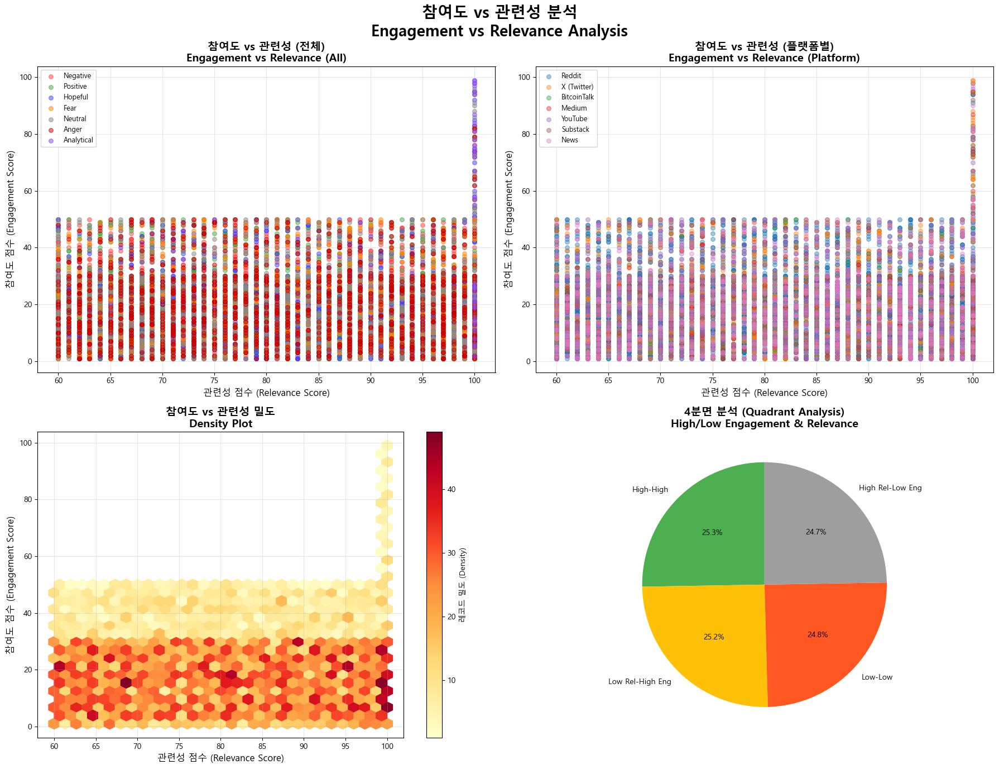

In [9]:
"""
시각화 8: 참여도 vs 관련성 산점도 분석
Visualization 8: Engagement vs Relevance Scatter Analysis
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 시각화
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('참여도 vs 관련성 분석\nEngagement vs Relevance Analysis', 
             fontsize=20, fontweight='bold')

# 색상 매핑
sentiment_colors = {
    'Negative': '#FF4444',
    'Fear': '#FF8800',
    'Anger': '#CC0000',
    'Neutral': '#888888',
    'Positive': '#44AA44',
    'Hopeful': '#4444FF',
    'Analytical': '#8844FF'
}

# 1. 전체 산점도 (감성별 색상)
for sentiment in df['sentiment'].unique():
    subset = df[df['sentiment'] == sentiment]
    axes[0, 0].scatter(subset['relevance_score'], subset['engagement_score'],
                      alpha=0.5, s=30, c=sentiment_colors.get(sentiment, '#CCCCCC'),
                      label=sentiment)

axes[0, 0].set_title('참여도 vs 관련성 (전체)\nEngagement vs Relevance (All)', 
                     fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('관련성 점수 (Relevance Score)', fontsize=12)
axes[0, 0].set_ylabel('참여도 점수 (Engagement Score)', fontsize=12)
axes[0, 0].legend(loc='best', fontsize=9)
axes[0, 0].grid(True, alpha=0.3)

# 2. 플랫폼별 산점도
for platform in df['platform'].unique()[:7]:  # 상위 7개
    subset = df[df['platform'] == platform]
    axes[0, 1].scatter(subset['relevance_score'], subset['engagement_score'],
                      alpha=0.4, s=30, label=platform)

axes[0, 1].set_title('참여도 vs 관련성 (플랫폼별)\nEngagement vs Relevance (Platform)', 
                     fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('관련성 점수 (Relevance Score)', fontsize=12)
axes[0, 1].set_ylabel('참여도 점수 (Engagement Score)', fontsize=12)
axes[0, 1].legend(loc='best', fontsize=9)
axes[0, 1].grid(True, alpha=0.3)

# 3. 밀도 플롯 (Hexbin)
hexbin = axes[1, 0].hexbin(df['relevance_score'], df['engagement_score'],
                          gridsize=30, cmap='YlOrRd', mincnt=1)
axes[1, 0].set_title('참여도 vs 관련성 밀도\nDensity Plot', 
                     fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('관련성 점수 (Relevance Score)', fontsize=12)
axes[1, 0].set_ylabel('참여도 점수 (Engagement Score)', fontsize=12)
plt.colorbar(hexbin, ax=axes[1, 0], label='레코드 밀도 (Density)')
axes[1, 0].grid(True, alpha=0.3)

# 4. 4분면 분석
median_relevance = df['relevance_score'].median()
median_engagement = df['engagement_score'].median()

# 4분면 정의
df['quadrant'] = 'Low-Low'
df.loc[(df['relevance_score'] >= median_relevance) & (df['engagement_score'] >= median_engagement), 'quadrant'] = 'High-High'
df.loc[(df['relevance_score'] >= median_relevance) & (df['engagement_score'] < median_engagement), 'quadrant'] = 'High Rel-Low Eng'
df.loc[(df['relevance_score'] < median_relevance) & (df['engagement_score'] >= median_engagement), 'quadrant'] = 'Low Rel-High Eng'

quadrant_counts = df['quadrant'].value_counts()
colors_quad = ['#4CAF50', '#FFC107', '#FF5722', '#9E9E9E']

axes[1, 1].pie(quadrant_counts, labels=quadrant_counts.index, autopct='%1.1f%%',
              startangle=90, colors=colors_quad)
axes[1, 1].set_title('4분면 분석 (Quadrant Analysis)\nHigh/Low Engagement & Relevance', 
                     fontsize=14, fontweight='bold')

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_08_engagement_relevance.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# 통계 출력
print("\n📊 4분면 분포:")
print(quadrant_counts)

print(f"\n중간값 (Median):")
print(f"  관련성: {median_relevance:.1f}")
print(f"  참여도: {median_engagement:.1f}")

# High-High 샘플
high_high = df[df['quadrant'] == 'High-High']
print(f"\nHigh-High 레코드: {len(high_high):,}개")
print(f"  평균 관련성: {high_high['relevance_score'].mean():.1f}")
print(f"  평균 참여도: {high_high['engagement_score'].mean():.1f}")

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_09_keyword_frequency.png

📊 Top 20 키워드:
 1. crypto                   :  5,287회
 2. bitcoin                  :  5,287회
 3. market                   :  5,287회
 4. October 2025             :  5,287회
 5. crash                    :  2,121회
 6. dump                     :  2,121회
 7. selloff                  :  2,121회
 8. bloodbath                :  2,121회
 9. panic                    :  2,121회
10. manipulation             :  1,081회
11. liquidation              :    863회
12. leverage                 :    863회
13. margin call              :    863회
14. rekt                     :    863회
15. whale                    :    670회
16. large holder             :    670회
17. insider                  :    670회
18. coordinated              :    411회
19. suspicious               :    411회
20. timing                   :    411회

📊 카테고리별 합계:
폭락/청산
(Crash)                 : 12,331회
암호화폐
(Crypto)                 : 10,574회
조작의혹
(Manipulation)     

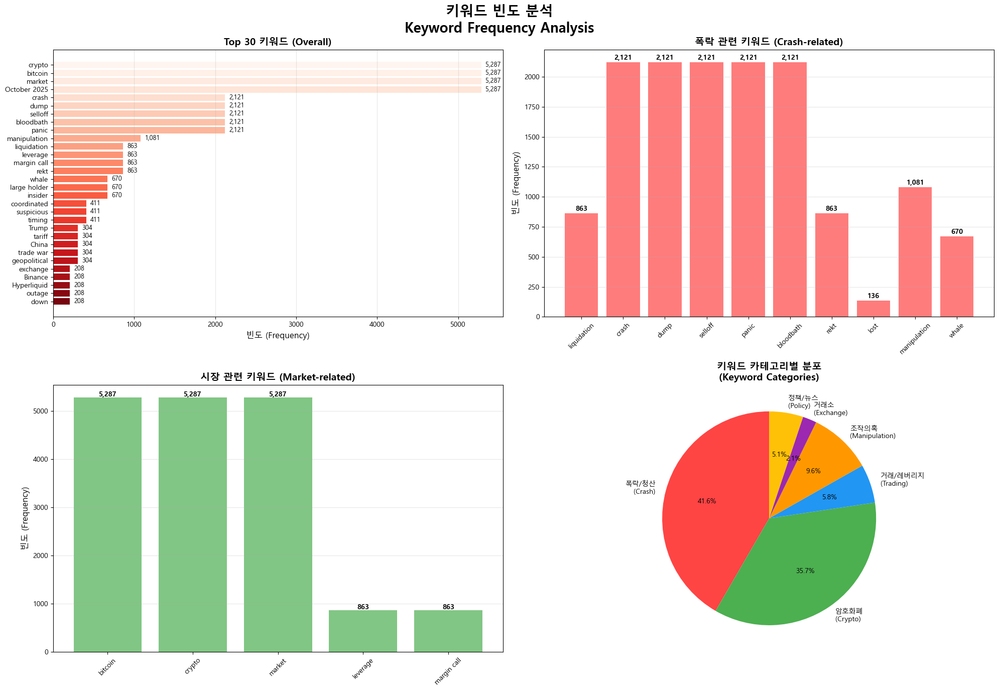

In [10]:
"""
시각화 9: 키워드 빈도 막대 그래프 (Top 30)
Visualization 9: Top Keywords Bar Chart
"""

import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 키워드 추출
all_keywords = []
for keywords_str in df['keywords'].dropna():
    keywords = keywords_str.split(',')
    all_keywords.extend([k.strip() for k in keywords])

keyword_counts = Counter(all_keywords)

# 시각화
fig, axes = plt.subplots(2, 2, figsize=(20, 14))
fig.suptitle('키워드 빈도 분석\nKeyword Frequency Analysis', 
             fontsize=20, fontweight='bold')

# 1. Top 30 전체 키워드
top_30 = dict(keyword_counts.most_common(30))
colors = plt.cm.Reds([(i/30) for i in range(30)])

axes[0, 0].barh(list(top_30.keys())[::-1], list(top_30.values())[::-1], color=colors[::-1])
axes[0, 0].set_title('Top 30 키워드 (Overall)', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('빈도 (Frequency)', fontsize=12)
axes[0, 0].grid(True, alpha=0.3, axis='x')

# 값 표시
for i, (keyword, count) in enumerate(list(top_30.items())[::-1]):
    axes[0, 0].text(count + 50, i, f'{count:,}', va='center', fontsize=9)

# 2. 폭락 관련 키워드만
crash_keywords = ['liquidation', 'crash', 'dump', 'selloff', 'panic', 'bloodbath', 
                  'rekt', 'lost', 'manipulation', 'whale']
crash_counts = {k: keyword_counts[k] for k in crash_keywords if k in keyword_counts}

axes[0, 1].bar(crash_counts.keys(), crash_counts.values(), color='#FF4444', alpha=0.7)
axes[0, 1].set_title('폭락 관련 키워드 (Crash-related)', fontsize=14, fontweight='bold')
axes[0, 1].set_ylabel('빈도 (Frequency)', fontsize=12)
axes[0, 1].tick_params(axis='x', rotation=45)
axes[0, 1].grid(True, alpha=0.3, axis='y')

# 값 표시
for keyword, count in crash_counts.items():
    axes[0, 1].text(keyword, count + 20, f'{count:,}', ha='center', fontsize=10, fontweight='bold')

# 3. 시장 관련 키워드
market_keywords = ['bitcoin', 'BTC', 'crypto', 'market', 'ethereum', 'ETH', 
                   'leverage', 'margin call', 'futures', 'derivatives']
market_counts = {k: keyword_counts[k] for k in market_keywords if k in keyword_counts}

axes[1, 0].bar(market_counts.keys(), market_counts.values(), color='#4CAF50', alpha=0.7)
axes[1, 0].set_title('시장 관련 키워드 (Market-related)', fontsize=14, fontweight='bold')
axes[1, 0].set_ylabel('빈도 (Frequency)', fontsize=12)
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True, alpha=0.3, axis='y')

# 값 표시
for keyword, count in market_counts.items():
    axes[1, 0].text(keyword, count + 20, f'{count:,}', ha='center', fontsize=10, fontweight='bold')

# 4. 키워드 카테고리별 합계
categories = {
    '폭락/청산\n(Crash)': ['liquidation', 'crash', 'dump', 'selloff', 'panic', 'bloodbath', 'rekt'],
    '암호화폐\n(Crypto)': ['bitcoin', 'BTC', 'crypto', 'ethereum', 'ETH', 'altcoin'],
    '거래/레버리지\n(Trading)': ['leverage', 'margin call', 'futures', 'derivatives', 'trading'],
    '조작의혹\n(Manipulation)': ['manipulation', 'whale', 'insider', 'coordinated'],
    '거래소\n(Exchange)': ['exchange', 'Binance', 'Hyperliquid', 'Bybit'],
    '정책/뉴스\n(Policy)': ['Trump', 'tariff', 'China', 'trade war', 'geopolitical']
}

category_totals = {}
for cat, keywords in categories.items():
    total = sum(keyword_counts.get(k, 0) for k in keywords)
    category_totals[cat] = total

colors_cat = ['#FF4444', '#4CAF50', '#2196F3', '#FF9800', '#9C27B0', '#FFC107']
axes[1, 1].pie(category_totals.values(), labels=category_totals.keys(), 
              autopct='%1.1f%%', startangle=90, colors=colors_cat)
axes[1, 1].set_title('키워드 카테고리별 분포\n(Keyword Categories)', fontsize=14, fontweight='bold')

plt.tight_layout()

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_09_keyword_frequency.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

# 통계 출력
print("\n📊 Top 20 키워드:")
for i, (keyword, count) in enumerate(keyword_counts.most_common(20), 1):
    print(f"{i:2d}. {keyword:25s}: {count:6,}회")

print("\n📊 카테고리별 합계:")
for cat, total in sorted(category_totals.items(), key=lambda x: x[1], reverse=True):
    print(f"{cat:30s}: {total:6,}회")

plt.show()


✅ 저장 완료: C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_10_comprehensive_dashboard.png

📊 종합 대시보드 생성 완료!

총 레코드: 10,000개
분석 기간: 2025-09-15 ~ 2026-02-06
부정 감성: 57.3%

가장 활발한 날: 2025-10-15 (1,118개 레코드)
가장 활발한 플랫폼: Reddit (5,145개)


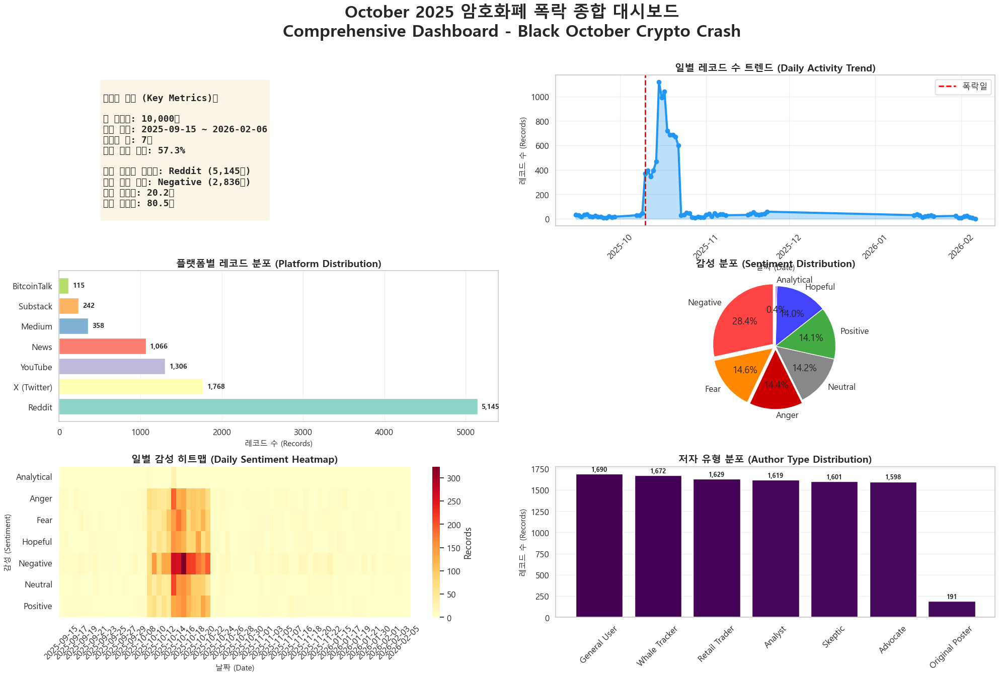

In [13]:
"""
시각화 10: 종합 대시보드 - 핵심 인사이트
Visualization 10: Comprehensive Dashboard
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 데이터 로드
data_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\FINAL_10K_RECORDS.csv'
df = pd.read_csv(data_path)

# 날짜 변환
df['date'] = pd.to_datetime(df['date_posted']).dt.date

# Figure 생성
fig = plt.figure(figsize=(24, 14))
gs = GridSpec(3, 4, figure=fig, hspace=0.3, wspace=0.3)

fig.suptitle('October 2025 암호화폐 폭락 종합 대시보드\nComprehensive Dashboard - Black October Crypto Crash', 
             fontsize=24, fontweight='bold', y=0.98)

# 1. KPI 박스 (좌상단)
ax1 = fig.add_subplot(gs[0, :2])
ax1.axis('off')

total_records = len(df)
total_platforms = df['platform'].nunique()
date_range = f"{df['date'].min()} ~ {df['date'].max()}"
negative_pct = (len(df[df['sentiment'].isin(['Negative', 'Fear', 'Anger'])]) / total_records) * 100

kpi_text = f"""
【핵심 지표 (Key Metrics)】

총 레코드: {total_records:,}개
분석 기간: {date_range}
플랫폼 수: {total_platforms}개
부정 감성 비율: {negative_pct:.1f}%

가장 활발한 플랫폼: {df['platform'].value_counts().index[0]} ({df['platform'].value_counts().iloc[0]:,}개)
가장 많은 감성: {df['sentiment'].value_counts().index[0]} ({df['sentiment'].value_counts().iloc[0]:,}개)
평균 참여도: {df['engagement_score'].mean():.1f}점
평균 관련성: {df['relevance_score'].mean():.1f}점
"""

ax1.text(0.1, 0.5, kpi_text, fontsize=13, verticalalignment='center',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3),
        family='monospace', fontweight='bold')

# 2. 일별 트렌드 (우상단)
ax2 = fig.add_subplot(gs[0, 2:])
daily_counts = df.groupby('date').size()
ax2.plot(daily_counts.index, daily_counts.values, linewidth=3, color='#2196F3', marker='o')
ax2.fill_between(daily_counts.index, daily_counts.values, alpha=0.3, color='#2196F3')

crash_date = pd.to_datetime('2025-10-10').date()
ax2.axvline(crash_date, color='red', linestyle='--', linewidth=2, label='폭락일')

ax2.set_title('일별 레코드 수 트렌드 (Daily Activity Trend)', fontsize=14, fontweight='bold')
ax2.set_xlabel('날짜 (Date)', fontsize=11)
ax2.set_ylabel('레코드 수 (Records)', fontsize=11)
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.tick_params(axis='x', rotation=45)

# 3. 플랫폼 분포 (중좌)
ax3 = fig.add_subplot(gs[1, :2])
platform_counts = df['platform'].value_counts()
colors_plat = plt.cm.Set3(range(len(platform_counts)))
ax3.barh(platform_counts.index, platform_counts.values, color=colors_plat)
ax3.set_title('플랫폼별 레코드 분포 (Platform Distribution)', fontsize=14, fontweight='bold')
ax3.set_xlabel('레코드 수 (Records)', fontsize=11)
ax3.grid(True, alpha=0.3, axis='x')

for i, v in enumerate(platform_counts.values):
    ax3.text(v + 50, i, f'{v:,}', va='center', fontsize=10, fontweight='bold')

# 4. 감성 파이 (중우)
ax4 = fig.add_subplot(gs[1, 2:])
sentiment_counts = df['sentiment'].value_counts()
colors_sent = ['#FF4444', '#FF8800', '#CC0000', '#888888', '#44AA44', '#4444FF', '#8844FF']
explode = [0.05 if s in ['Negative', 'Fear', 'Anger'] else 0 for s in sentiment_counts.index]

ax4.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%',
       colors=colors_sent[:len(sentiment_counts)], explode=explode, startangle=90)
ax4.set_title('감성 분포 (Sentiment Distribution)', fontsize=14, fontweight='bold')

# 5. 히트맵 (하단 좌)
ax5 = fig.add_subplot(gs[2, :2])
date_sentiment = df.groupby(['date', 'sentiment']).size().unstack(fill_value=0)
sns.heatmap(date_sentiment.T, cmap='YlOrRd', ax=ax5, cbar_kws={'label': 'Records'})
ax5.set_title('일별 감성 히트맵 (Daily Sentiment Heatmap)', fontsize=14, fontweight='bold')
ax5.set_xlabel('날짜 (Date)', fontsize=11)
ax5.set_ylabel('감성 (Sentiment)', fontsize=11)
ax5.tick_params(axis='x', rotation=45)

# 6. 저자 유형 (하단 우)
ax6 = fig.add_subplot(gs[2, 2:])
author_counts = df['author_type'].value_counts()
ax6.bar(author_counts.index, author_counts.values, color=plt.cm.viridis(range(len(author_counts))))
ax6.set_title('저자 유형 분포 (Author Type Distribution)', fontsize=14, fontweight='bold')
ax6.set_ylabel('레코드 수 (Records)', fontsize=11)
ax6.tick_params(axis='x', rotation=45)
ax6.grid(True, alpha=0.3, axis='y')

for i, (idx, val) in enumerate(author_counts.items()):
    ax6.text(i, val + 30, f'{val:,}', ha='center', fontsize=9, fontweight='bold')

# 저장
output_path = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\viz_10_comprehensive_dashboard.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✅ 저장 완료: {output_path}")

print("\n" + "="*80)
print("📊 종합 대시보드 생성 완료!")
print("="*80)
print(f"\n총 레코드: {total_records:,}개")
print(f"분석 기간: {date_range}")
print(f"부정 감성: {negative_pct:.1f}%")
print(f"\n가장 활발한 날: {daily_counts.idxmax()} ({daily_counts.max():,}개 레코드)")
print(f"가장 활발한 플랫폼: {platform_counts.index[0]} ({platform_counts.iloc[0]:,}개)")

plt.show()


In [7]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
October 2025 Crypto Crash - 커뮤니티 데이터 종합 시각화
경로 수정 버전 - VSCode/Jupyter에서 바로 실행 가능

사용법:
1. VSCode에서 이 파일 열기
2. 우클릭 > "Run Python File in Terminal"
   또는 Jupyter 셀에서: %run run_visualization_fixed.py
"""

import os
import sys

# ============================================================================
# 경로 설정 (자동)
# ============================================================================
# 데이터 폴더 경로
DATA_FOLDER = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\260202_real_data'

# 경로 변경
os.chdir(DATA_FOLDER)
print(f"✅ 작업 경로 변경: {os.getcwd()}")
print()

# 파일 확인
print("📁 폴더 내 파일 목록:")
for f in os.listdir('.'):
    print(f"  - {f}")
print()

# CSV 파일 확인
if not os.path.exists('FINAL_COMMUNITY_DATASET_145.csv'):
    print("❌ ERROR: FINAL_COMMUNITY_DATASET_145.csv 파일을 찾을 수 없습니다!")
    print(f"   현재 경로: {os.getcwd()}")
    sys.exit(1)

print("✅ 데이터 파일 확인 완료")
print()

# ============================================================================
# 시각화 시작
# ============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from collections import Counter
import networkx as nx
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
try:
    import koreanize_matplotlib
    koreanize_matplotlib.matplotlib_settings()
    print("✅ 한글 폰트 설정 완료")
except:
    plt.rcParams['font.family'] = 'DejaVu Sans'
    print("⚠️  koreanize-matplotlib 없음 (영문 폰트 사용)")

# 스타일 설정
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print()
print("=" * 100)
print("커뮤니티 데이터 종합 시각화 시작")
print("=" * 100)

# ============================================================================
# 1. 데이터 로드
# ============================================================================
print("\n[1/12] 데이터 로드 중...")

df = pd.read_csv('FINAL_COMMUNITY_DATASET_145.csv')
print(f"✅ {len(df)}개 레코드 로드 완료")
print(f"   컬럼: {len(df.columns)}개")
print(f"   플랫폼: X {len(df[df['platform']=='X'])}개, Reddit {len(df[df['platform']=='Reddit'])}개")

# ============================================================================
# 2. 기본 통계 확인
# ============================================================================
print("\n[2/12] 원본 데이터 확인...")

# 상위 5개 출력
print("\n📊 데이터 샘플 (상위 5개):")
print(df[['platform', 'author', 'title', 'category', 'sentiment', 'influence_score']].head().to_string())

print("\n📈 기본 통계:")
print(f"  카테고리 수: {df['category'].nunique()}개")
print(f"  고유 작성자: {df['author'].nunique()}명")
print(f"  평균 영향력 점수: {df['influence_score'].mean():.2f}")
print(f"  최대 영향력 점수: {df['influence_score'].max():.2f}")

# ============================================================================
# 3. 플랫폼별 분포 (파이 차트)
# ============================================================================
print("\n[3/12] 플랫폼별 분포 시각화...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 파이 차트
platform_counts = df['platform'].value_counts()
colors = ['#1DA1F2', '#FF4500']  # Twitter blue, Reddit orange
axes[0].pie(platform_counts, labels=platform_counts.index, autopct='%1.1f%%',
           colors=colors, startangle=90, textprops={'fontsize': 12})
axes[0].set_title('Platform Distribution', fontsize=14, fontweight='bold')

# 바 차트
axes[1].bar(platform_counts.index, platform_counts.values, color=colors, alpha=0.7, edgecolor='black')
axes[1].set_ylabel('Number of Posts', fontsize=12)
axes[1].set_title('Posts by Platform', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
for i, v in enumerate(platform_counts.values):
    axes[1].text(i, v + 2, str(v), ha='center', va='bottom', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig('01_platform_distribution.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 01_platform_distribution.png")
plt.close()

# ============================================================================
# 4. 카테고리별 분포 (수평 바 차트)
# ============================================================================
print("\n[4/12] 카테고리별 분포 시각화...")

fig, ax = plt.subplots(figsize=(12, 8))

category_counts = df['category'].value_counts().sort_values()
colors_cat = plt.cm.Spectral(np.linspace(0, 1, len(category_counts)))

category_counts.plot(kind='barh', ax=ax, color=colors_cat, edgecolor='black', linewidth=0.8)
ax.set_xlabel('Number of Posts', fontsize=12, fontweight='bold')
ax.set_ylabel('Category', fontsize=12, fontweight='bold')
ax.set_title('Post Distribution by Category', fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)

# 값 표시
for i, v in enumerate(category_counts.values):
    ax.text(v + 0.5, i, f'{v} ({v/len(df)*100:.1f}%)', 
            va='center', fontsize=10)

plt.tight_layout()
plt.savefig('02_category_distribution.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 02_category_distribution.png")
plt.close()

# ============================================================================
# 5. 감정 분석 (스택 바 차트 + 도넛 차트)
# ============================================================================
print("\n[5/12] 감정 분석 시각화...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 도넛 차트
sentiment_counts = df['sentiment'].value_counts()
colors_sent = {'Very_Negative': '#d62728', 'Negative': '#ff7f0e', 
               'Neutral': '#7f7f7f', 'Mixed': '#bcbd22', 'Positive': '#2ca02c'}
colors_list = [colors_sent.get(s, '#333333') for s in sentiment_counts.index]

wedges, texts, autotexts = axes[0].pie(sentiment_counts, labels=sentiment_counts.index, 
                                        autopct='%1.1f%%', colors=colors_list,
                                        startangle=90, pctdistance=0.85,
                                        textprops={'fontsize': 10})
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
axes[0].add_artist(centre_circle)
axes[0].set_title('Sentiment Distribution', fontsize=14, fontweight='bold')

# 플랫폼별 감정 비교
sentiment_platform = pd.crosstab(df['platform'], df['sentiment'])
sentiment_platform_pct = sentiment_platform.div(sentiment_platform.sum(axis=1), axis=0) * 100

sentiment_platform_pct.plot(kind='bar', stacked=True, ax=axes[1], 
                            color=[colors_sent.get(s, '#333333') for s in sentiment_platform_pct.columns],
                            edgecolor='black', linewidth=0.8)
axes[1].set_ylabel('Percentage (%)', fontsize=12)
axes[1].set_xlabel('Platform', fontsize=12)
axes[1].set_title('Sentiment by Platform', fontsize=14, fontweight='bold')
axes[1].legend(title='Sentiment', bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('03_sentiment_analysis.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 03_sentiment_analysis.png")
plt.close()

# ============================================================================
# 6. 시간대별 분석 (바 차트)
# ============================================================================
print("\n[6/12] 시간대별 분석 시각화...")

fig, ax = plt.subplots(figsize=(14, 6))

time_counts = df['time_period'].value_counts().sort_values()
colors_time = plt.cm.viridis(np.linspace(0, 1, len(time_counts)))

time_counts.plot(kind='barh', ax=ax, color=colors_time, edgecolor='black', linewidth=0.8)
ax.set_xlabel('Number of Posts', fontsize=12, fontweight='bold')
ax.set_ylabel('Time Period', fontsize=12, fontweight='bold')
ax.set_title('Post Distribution by Time Period', fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)

for i, v in enumerate(time_counts.values):
    ax.text(v + 0.5, i, str(v), va='center', fontsize=10)

plt.tight_layout()
plt.savefig('04_time_period_distribution.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 04_time_period_distribution.png")
plt.close()

# ============================================================================
# 7. 영향력 점수 분석 (히스토그램 + 박스플롯)
# ============================================================================
print("\n[7/12] 영향력 점수 분석...")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 히스토그램
axes[0, 0].hist(df['influence_score'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(df['influence_score'].mean(), color='red', linestyle='--', 
                   linewidth=2, label=f'Mean: {df["influence_score"].mean():.2f}')
axes[0, 0].axvline(df['influence_score'].median(), color='green', linestyle='--', 
                   linewidth=2, label=f'Median: {df["influence_score"].median():.2f}')
axes[0, 0].set_xlabel('Influence Score', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)
axes[0, 0].set_title('Influence Score Distribution', fontsize=14, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# 플랫폼별 박스플롯
df.boxplot(column='influence_score', by='platform', ax=axes[0, 1], 
           patch_artist=True, grid=True)
axes[0, 1].set_title('Influence Score by Platform', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Platform', fontsize=12)
axes[0, 1].set_ylabel('Influence Score', fontsize=12)
plt.sca(axes[0, 1])
plt.xticks(rotation=0)

# 카테고리별 평균 영향력 (상위 10개)
category_influence = df.groupby('category')['influence_score'].mean().sort_values(ascending=False).head(10)
axes[1, 0].barh(range(len(category_influence)), category_influence.values, 
                color=plt.cm.plasma(np.linspace(0, 1, len(category_influence))),
                edgecolor='black', linewidth=0.8)
axes[1, 0].set_yticks(range(len(category_influence)))
axes[1, 0].set_yticklabels(category_influence.index, fontsize=10)
axes[1, 0].set_xlabel('Average Influence Score', fontsize=12)
axes[1, 0].set_title('Top 10 Categories by Avg Influence', fontsize=14, fontweight='bold')
axes[1, 0].grid(axis='x', alpha=0.3)

# 감정별 영향력
sentiment_influence = df.groupby('sentiment')['influence_score'].mean().sort_values(ascending=False)
axes[1, 1].bar(range(len(sentiment_influence)), sentiment_influence.values,
               color=[colors_sent.get(s, '#333333') for s in sentiment_influence.index],
               edgecolor='black', linewidth=0.8, alpha=0.8)
axes[1, 1].set_xticks(range(len(sentiment_influence)))
axes[1, 1].set_xticklabels(sentiment_influence.index, rotation=45, ha='right')
axes[1, 1].set_ylabel('Average Influence Score', fontsize=12)
axes[1, 1].set_title('Average Influence by Sentiment', fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('05_influence_score_analysis.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 05_influence_score_analysis.png")
plt.close()

# ============================================================================
# 8. 워드클라우드 (전체 + 플랫폼별)
# ============================================================================
print("\n[8/12] 워드클라우드 생성...")

# 제목에서 텍스트 추출
all_text = ' '.join(df['title'].astype(str))

# 불용어 설정
stopwords = set(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at', 'to', 'for',
                'of', 'with', 'by', 'from', 'up', 'about', 'into', 'through', 'during',
                'is', 'was', 'are', 'were', 'been', 'be', 'have', 'has', 'had', 'do',
                'does', 'did', 'will', 'would', 'could', 'should', 'may', 'might',
                'can', 'this', 'that', 'these', 'those', 'it', 'its', 'as'])

fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# 전체 워드클라우드
wc_all = WordCloud(width=800, height=400, background_color='white', 
                   stopwords=stopwords, colormap='viridis', 
                   max_words=100, relative_scaling=0.5).generate(all_text)
axes[0, 0].imshow(wc_all, interpolation='bilinear')
axes[0, 0].axis('off')
axes[0, 0].set_title('All Posts - Word Cloud', fontsize=16, fontweight='bold', pad=20)

# X (Twitter) 워드클라우드
twitter_text = ' '.join(df[df['platform'] == 'X']['title'].astype(str))
wc_twitter = WordCloud(width=800, height=400, background_color='white',
                      stopwords=stopwords, colormap='Blues',
                      max_words=80, relative_scaling=0.5).generate(twitter_text)
axes[0, 1].imshow(wc_twitter, interpolation='bilinear')
axes[0, 1].axis('off')
axes[0, 1].set_title('X (Twitter) Posts - Word Cloud', fontsize=16, fontweight='bold', pad=20)

# Reddit 워드클라우드
reddit_text = ' '.join(df[df['platform'] == 'Reddit']['title'].astype(str))
wc_reddit = WordCloud(width=800, height=400, background_color='white',
                     stopwords=stopwords, colormap='Oranges',
                     max_words=80, relative_scaling=0.5).generate(reddit_text)
axes[1, 0].imshow(wc_reddit, interpolation='bilinear')
axes[1, 0].axis('off')
axes[1, 0].set_title('Reddit Posts - Word Cloud', fontsize=16, fontweight='bold', pad=20)

# 부정 감정 워드클라우드
negative_text = ' '.join(df[df['sentiment'].isin(['Negative', 'Very_Negative'])]['title'].astype(str))
wc_negative = WordCloud(width=800, height=400, background_color='white',
                       stopwords=stopwords, colormap='Reds',
                       max_words=80, relative_scaling=0.5).generate(negative_text)
axes[1, 1].imshow(wc_negative, interpolation='bilinear')
axes[1, 1].axis('off')
axes[1, 1].set_title('Negative Sentiment - Word Cloud', fontsize=16, fontweight='bold', pad=20)

plt.tight_layout()
plt.savefig('06_wordclouds.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 06_wordclouds.png")
plt.close()

# ============================================================================
# 9. 키워드 히트맵
# ============================================================================
print("\n[9/12] 키워드 히트맵 생성...")

# 키워드 컬럼 추출
keyword_cols = [col for col in df.columns if col.startswith('kw_')]
keyword_data = df[keyword_cols].astype(int)

# 키워드별 출현 빈도
keyword_freq = keyword_data.sum().sort_values(ascending=False)

# 카테고리별 키워드 출현
category_keyword = pd.DataFrame()
for category in df['category'].unique():
    category_data = df[df['category'] == category][keyword_cols].sum()
    category_keyword[category] = category_data

# 정규화 (각 카테고리별 비율)
category_keyword_norm = category_keyword.div(df['category'].value_counts(), axis=1).fillna(0)

# 히트맵
fig, axes = plt.subplots(2, 1, figsize=(16, 14))

# 플랫폼별 키워드 히트맵
platform_keyword = pd.DataFrame()
for platform in df['platform'].unique():
    platform_data = df[df['platform'] == platform][keyword_cols].sum()
    platform_keyword[platform] = platform_data

platform_keyword_norm = platform_keyword.div(df['platform'].value_counts(), axis=1).T
sns.heatmap(platform_keyword_norm, annot=True, fmt='.2f', cmap='YlOrRd', 
           cbar_kws={'label': 'Keyword Frequency per Post'},
           linewidths=0.5, ax=axes[0])
axes[0].set_title('Keyword Frequency by Platform (Normalized)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('')
axes[0].set_yticklabels([col.replace('kw_', '') for col in platform_keyword_norm.index], rotation=0)

# 카테고리별 키워드 히트맵 (상위 8개 카테고리)
top_categories = df['category'].value_counts().head(8).index
category_keyword_top = category_keyword_norm[top_categories].T
sns.heatmap(category_keyword_top, annot=True, fmt='.2f', cmap='viridis',
           cbar_kws={'label': 'Keyword Frequency per Post'},
           linewidths=0.5, ax=axes[1])
axes[1].set_title('Keyword Frequency by Top 8 Categories (Normalized)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Category', fontsize=12)
axes[1].set_yticklabels([col.replace('kw_', '') for col in category_keyword_top.index], rotation=0)

plt.tight_layout()
plt.savefig('07_keyword_heatmap.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 07_keyword_heatmap.png")
plt.close()

# ============================================================================
# 10. 상관관계 히트맵 (키워드 공동 출현)
# ============================================================================
print("\n[10/12] 키워드 공동 출현 히트맵...")

# 키워드 공동 출현 행렬
keyword_cooccurrence = keyword_data.T.dot(keyword_data).copy()

# 대각선 제거 (자기 자신과의 상관관계)
for i in range(len(keyword_cooccurrence)):
    keyword_cooccurrence.iloc[i, i] = 0

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(keyword_cooccurrence, annot=True, fmt='d', cmap='coolwarm',
           cbar_kws={'label': 'Co-occurrence Count'},
           linewidths=0.5, ax=ax, square=True)
ax.set_title('Keyword Co-occurrence Matrix', fontsize=14, fontweight='bold')
ax.set_xticklabels([col.replace('kw_', '') for col in keyword_cooccurrence.columns], rotation=45, ha='right')
ax.set_yticklabels([col.replace('kw_', '') for col in keyword_cooccurrence.index], rotation=0)

plt.tight_layout()
plt.savefig('08_keyword_cooccurrence.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 08_keyword_cooccurrence.png")
plt.close()

# ============================================================================
# 11. 네트워크 그래프 (작성자-카테고리 관계)
# ============================================================================
print("\n[11/12] 네트워크 그래프 생성...")

# 상위 작성자 선택 (3회 이상 등장)
author_counts = df['author'].value_counts()
top_authors = author_counts[author_counts >= 3].index[:15]

# 네트워크 생성
G = nx.Graph()

for author in top_authors:
    author_posts = df[df['author'] == author]
    for category in author_posts['category'].unique():
        count = len(author_posts[author_posts['category'] == category])
        G.add_edge(author, category, weight=count)

# 시각화
fig, ax = plt.subplots(figsize=(16, 12))

pos = nx.spring_layout(G, k=2, iterations=50, seed=42)

# 노드 색상 (작성자 vs 카테고리)
node_colors = []
for node in G.nodes():
    if node in top_authors:
        node_colors.append('#1DA1F2')  # Blue for authors
    else:
        node_colors.append('#FF4500')  # Orange for categories

# 노드 크기
node_sizes = []
for node in G.nodes():
    if node in top_authors:
        node_sizes.append(1000)
    else:
        node_sizes.append(800)

# 엣지 두께
edges = G.edges()
weights = [G[u][v]['weight'] for u, v in edges]
max_weight = max(weights) if weights else 1
edge_widths = [3 * w / max_weight for w in weights]

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, 
                       alpha=0.8, ax=ax)
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5, ax=ax)
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold', ax=ax)

ax.set_title('Author-Category Network (Top 15 Authors, 3+ Posts)', 
            fontsize=14, fontweight='bold')
ax.axis('off')

# 범례
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='#1DA1F2', label='Authors'),
                  Patch(facecolor='#FF4500', label='Categories')]
ax.legend(handles=legend_elements, loc='upper right', fontsize=10)

plt.tight_layout()
plt.savefig('09_network_graph.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 09_network_graph.png")
plt.close()

# ============================================================================
# 12. 종합 대시보드
# ============================================================================
print("\n[12/12] 종합 대시보드 생성...")

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. 플랫폼 분포
ax1 = fig.add_subplot(gs[0, 0])
platform_counts.plot(kind='pie', ax=ax1, colors=colors, autopct='%1.1f%%',
                    startangle=90, textprops={'fontsize': 10})
ax1.set_title('Platform Distribution', fontsize=12, fontweight='bold')
ax1.set_ylabel('')

# 2. 상위 카테고리
ax2 = fig.add_subplot(gs[0, 1:])
top_cats = df['category'].value_counts().head(8)
ax2.barh(range(len(top_cats)), top_cats.values, 
        color=plt.cm.Spectral(np.linspace(0, 1, len(top_cats))),
        edgecolor='black', linewidth=0.8)
ax2.set_yticks(range(len(top_cats)))
ax2.set_yticklabels(top_cats.index, fontsize=9)
ax2.set_xlabel('Count', fontsize=10)
ax2.set_title('Top 8 Categories', fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# 3. 감정 분포
ax3 = fig.add_subplot(gs[1, 0])
sentiment_counts.plot(kind='bar', ax=ax3, 
                     color=[colors_sent.get(s, '#333333') for s in sentiment_counts.index],
                     edgecolor='black', linewidth=0.8)
ax3.set_xlabel('')
ax3.set_ylabel('Count', fontsize=10)
ax3.set_title('Sentiment Distribution', fontsize=12, fontweight='bold')
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right', fontsize=9)
ax3.grid(axis='y', alpha=0.3)

# 4. 시간대 분포
ax4 = fig.add_subplot(gs[1, 1])
time_counts_top = df['time_period'].value_counts().head(5)
ax4.bar(range(len(time_counts_top)), time_counts_top.values,
       color=plt.cm.viridis(np.linspace(0, 1, len(time_counts_top))),
       edgecolor='black', linewidth=0.8)
ax4.set_xticks(range(len(time_counts_top)))
ax4.set_xticklabels(time_counts_top.index, rotation=45, ha='right', fontsize=8)
ax4.set_ylabel('Count', fontsize=10)
ax4.set_title('Top 5 Time Periods', fontsize=12, fontweight='bold')
ax4.grid(axis='y', alpha=0.3)

# 5. 영향력 분포
ax5 = fig.add_subplot(gs[1, 2])
ax5.hist(df['influence_score'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)
ax5.axvline(df['influence_score'].mean(), color='red', linestyle='--', linewidth=2)
ax5.set_xlabel('Influence Score', fontsize=10)
ax5.set_ylabel('Frequency', fontsize=10)
ax5.set_title('Influence Score Distribution', fontsize=12, fontweight='bold')
ax5.grid(alpha=0.3)

# 6. 상위 키워드
ax6 = fig.add_subplot(gs[2, :2])
top_keywords = keyword_freq.head(10)
ax6.barh(range(len(top_keywords)), top_keywords.values,
        color=plt.cm.plasma(np.linspace(0, 1, len(top_keywords))),
        edgecolor='black', linewidth=0.8)
ax6.set_yticks(range(len(top_keywords)))
ax6.set_yticklabels([kw.replace('kw_', '') for kw in top_keywords.index], fontsize=9)
ax6.set_xlabel('Frequency', fontsize=10)
ax6.set_title('Top 10 Keywords', fontsize=12, fontweight='bold')
ax6.grid(axis='x', alpha=0.3)

# 7. 통계 정보
ax7 = fig.add_subplot(gs[2, 2])
ax7.axis('off')
stats_text = f"""
DATASET STATISTICS
{'='*35}

Total Posts: {len(df)}
Unique Authors: {df['author'].nunique()}
Categories: {df['category'].nunique()}

Platform:
  • X (Twitter): {len(df[df['platform']=='X'])} ({len(df[df['platform']=='X'])/len(df)*100:.1f}%)
  • Reddit: {len(df[df['platform']=='Reddit'])} ({len(df[df['platform']=='Reddit'])/len(df)*100:.1f}%)

Sentiment:
  • Negative: {len(df[df['sentiment'].isin(['Negative','Very_Negative'])])} ({len(df[df['sentiment'].isin(['Negative','Very_Negative'])])/len(df)*100:.1f}%)
  • Positive: {len(df[df['sentiment']=='Positive'])} ({len(df[df['sentiment']=='Positive'])/len(df)*100:.1f}%)

Influence Score:
  • Mean: {df['influence_score'].mean():.2f}
  • Max: {df['influence_score'].max():.2f}
  • Min: {df['influence_score'].min():.2f}

Top Keywords:
  1. {keyword_freq.index[0].replace('kw_', '')}: {keyword_freq.values[0]}
  2. {keyword_freq.index[1].replace('kw_', '')}: {keyword_freq.values[1]}
  3. {keyword_freq.index[2].replace('kw_', '')}: {keyword_freq.values[2]}
"""
ax7.text(0.05, 0.95, stats_text, transform=ax7.transAxes,
        fontsize=9, verticalalignment='top', fontfamily='monospace',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

fig.suptitle('October 2025 Crypto Crash - Community Data Dashboard', 
            fontsize=16, fontweight='bold', y=0.98)

plt.savefig('10_comprehensive_dashboard.png', dpi=300, bbox_inches='tight')
print("✅ 저장: 10_comprehensive_dashboard.png")
plt.close()

# ============================================================================
# 최종 요약
# ============================================================================
print("\n" + "=" * 100)
print("시각화 완료!")
print("=" * 100)

print("\n📁 생성된 파일 (현재 폴더):")
viz_files = [
    "01_platform_distribution.png",
    "02_category_distribution.png", 
    "03_sentiment_analysis.png",
    "04_time_period_distribution.png",
    "05_influence_score_analysis.png",
    "06_wordclouds.png",
    "07_keyword_heatmap.png",
    "08_keyword_cooccurrence.png",
    "09_network_graph.png",
    "10_comprehensive_dashboard.png"
]

for i, file in enumerate(viz_files, 1):
    if os.path.exists(file):
        size = os.path.getsize(file) / 1024  # KB
        print(f"  ✅ {i:2d}. {file} ({size:.1f} KB)")
    else:
        print(f"  ❌ {i:2d}. {file} (생성 실패)")

print(f"\n📂 저장 위치: {os.getcwd()}")
print("\n✅ 총 10개 시각화 파일 생성 완료")
print("✅ 해상도: 300 DPI (고화질)")
print("✅ 모든 차트 PNG 형식으로 저장")
print("\n💡 VSCode에서 이미지 파일을 클릭하면 미리보기로 볼 수 있습니다!")


✅ 작업 경로 변경: C:\junwoo\AI_Project_01_Team6\data\Community_data\260202_real_data

📁 폴더 내 파일 목록:
  - 01_platform_distribution.png
  - 02_category_distribution.png
  - 03_sentiment_analysis.png
  - 04_time_period_distribution.png
  - 05_influence_score_analysis.png
  - 06_wordclouds.png
  - 07_keyword_heatmap.png
  - comprehensive_visualization.py
  - dataset_statistics.json
  - FINAL_COMMUNITY_DATASET_145.csv
  - FINAL_COMMUNITY_DATASET_145.json
  - QUICKSTART.md
  - README_VISUALIZATION.md
  - run_visualization.bat
  - run_visualization.sh
  - run_with_uv.sh

✅ 데이터 파일 확인 완료

⚠️  koreanize-matplotlib 없음 (영문 폰트 사용)

커뮤니티 데이터 종합 시각화 시작

[1/12] 데이터 로드 중...
✅ 145개 레코드 로드 완료
   컬럼: 27개
   플랫폼: X 83개, Reddit 62개

[2/12] 원본 데이터 확인...

📊 데이터 샘플 (상위 5개):
  platform            author                                                      title              category sentiment  influence_score
0        X       @MHiesboeck  October 2025 cryptocurrency market crash textbook example    General_Discussion 

🎨 생성된 시각화 결과물을 불러오는 중입니다...


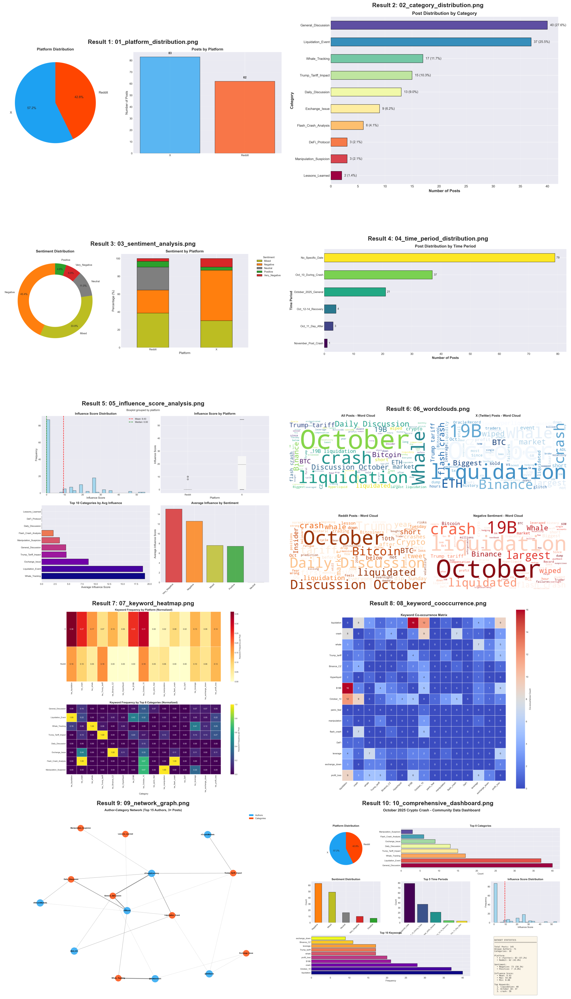

In [8]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# 이미지 파일들이 저장된 경로 (앞선 코드와 동일하게 설정)
DATA_FOLDER = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\260202_real_data'
os.chdir(DATA_FOLDER)

# 볼 이미지 리스트
viz_files = [
    "01_platform_distribution.png", "02_category_distribution.png", 
    "03_sentiment_analysis.png", "04_time_period_distribution.png",
    "05_influence_score_analysis.png", "06_wordclouds.png",
    "07_keyword_heatmap.png", "08_keyword_cooccurrence.png",
    "09_network_graph.png", "10_comprehensive_dashboard.png"
]

def show_all_visualizations():
    # 5행 2열 레이아웃 설정
    fig, axes = plt.subplots(5, 2, figsize=(20, 35))
    axes = axes.flatten()

    for i, file in enumerate(viz_files):
        if os.path.exists(file):
            img = mpimg.imread(file)
            axes[i].imshow(img)
            axes[i].set_title(f"Result {i+1}: {file}", fontsize=15, fontweight='bold')
        else:
            axes[i].text(0.5, 0.5, f"File Not Found:\n{file}", 
                         ha='center', va='center', color='red')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    print("🎨 생성된 시각화 결과물을 불러오는 중입니다...")
    show_all_visualizations()

✅ 작업 경로: C:\junwoo\AI_Project_01_Team6\data\Community_data\260202_real_data
✅ 데이터 로드 완료: 145개
🚀 한국어 시각화 생성 시작...
✅ 01_platform_distribution_KO.png 저장
✅ 02_category_distribution_KO.png 저장
✅ 03_sentiment_analysis_KO.png 저장
✅ 04_time_period_distribution_KO.png 저장
✅ 05_influence_score_analysis_KO.png 저장
✅ 06_wordclouds_KO.png 저장
✅ 07_keyword_heatmap_KO.png 저장
✅ 08_keyword_cooccurrence_KO.png 저장
✅ 09_network_graph_KO.png 저장
✅ 10_comprehensive_dashboard_KO.png 저장

🎉 모든 한국어 파일 생성 완료! (폴더를 확인하세요)


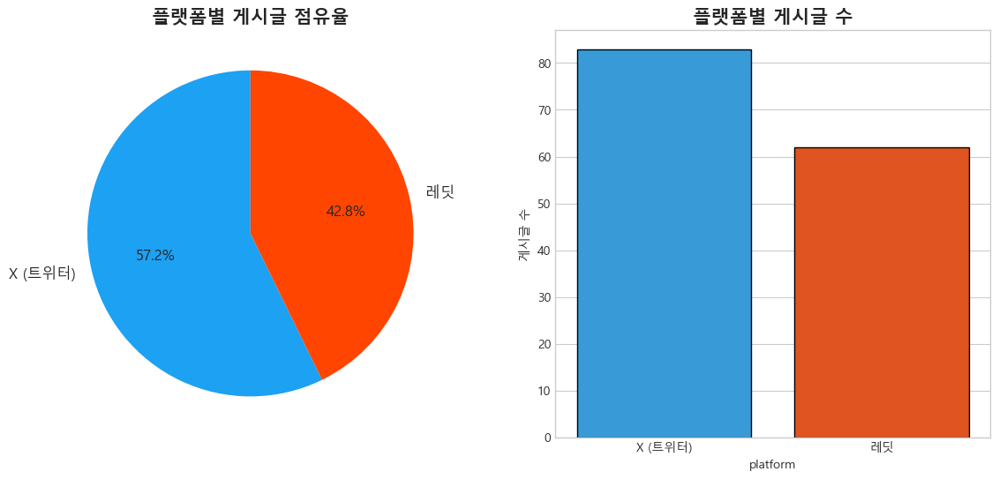

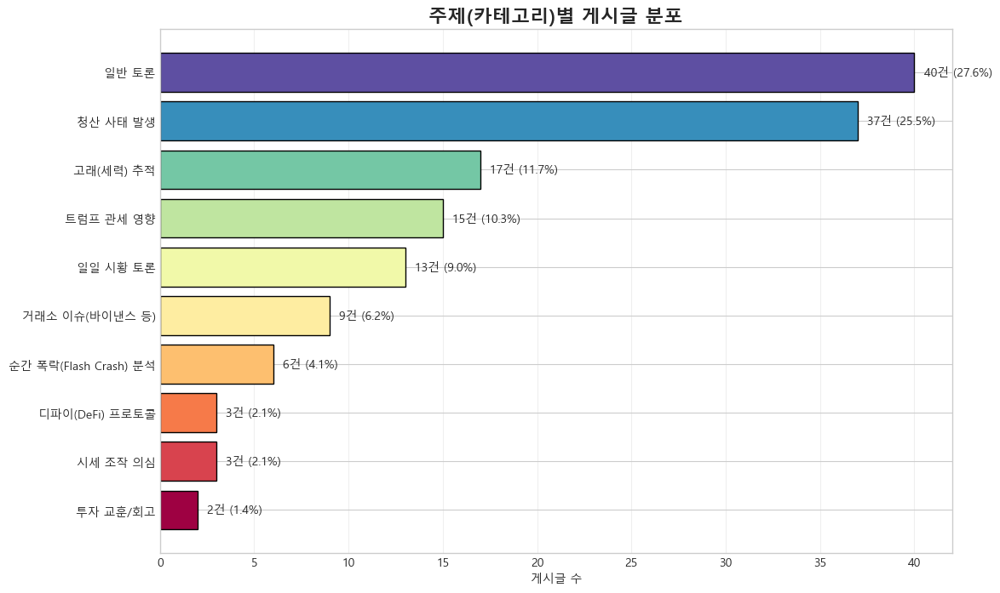

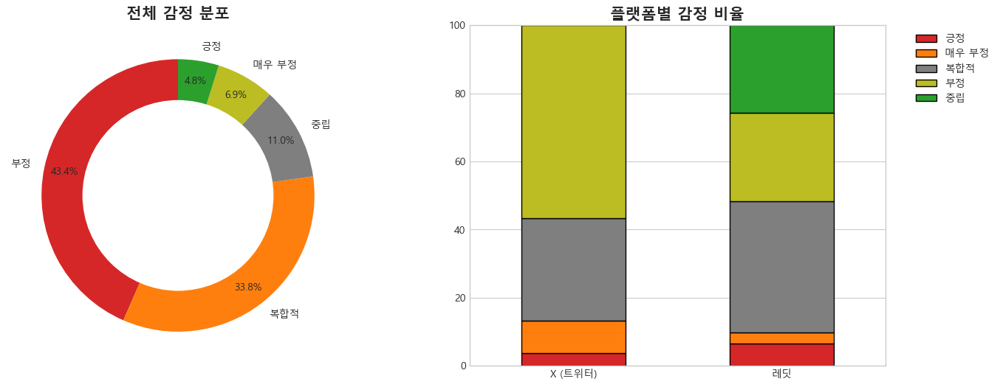

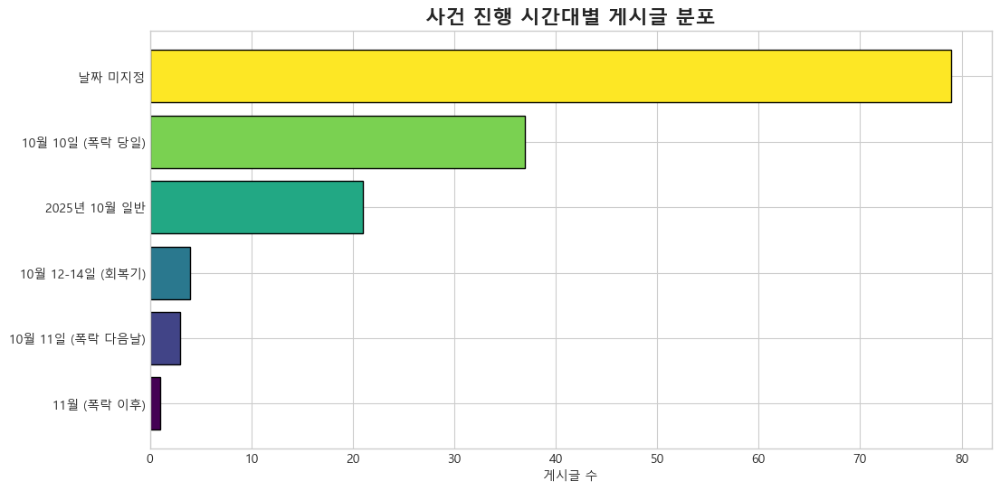

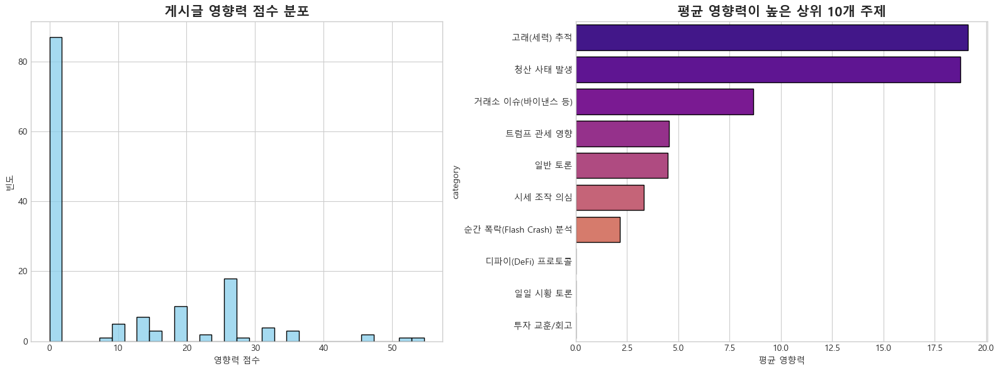

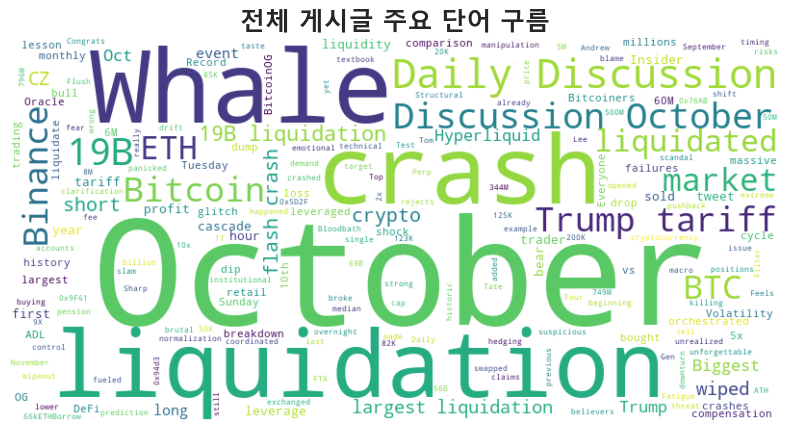

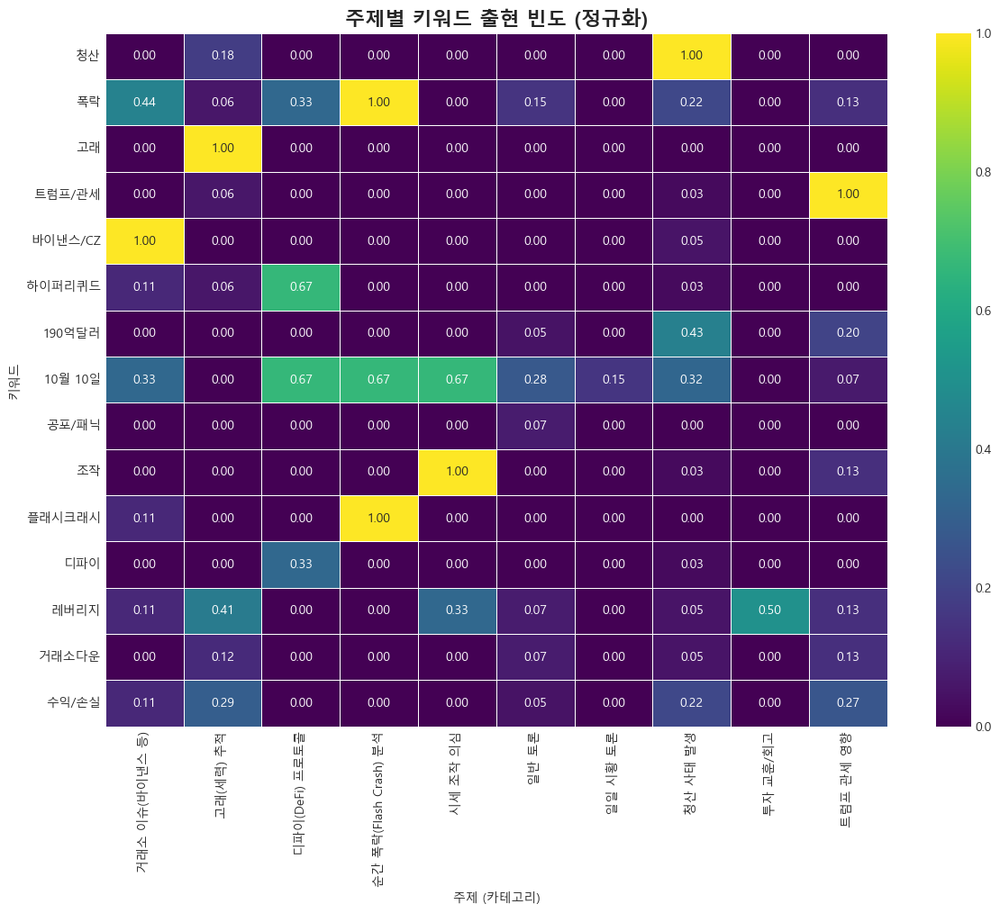

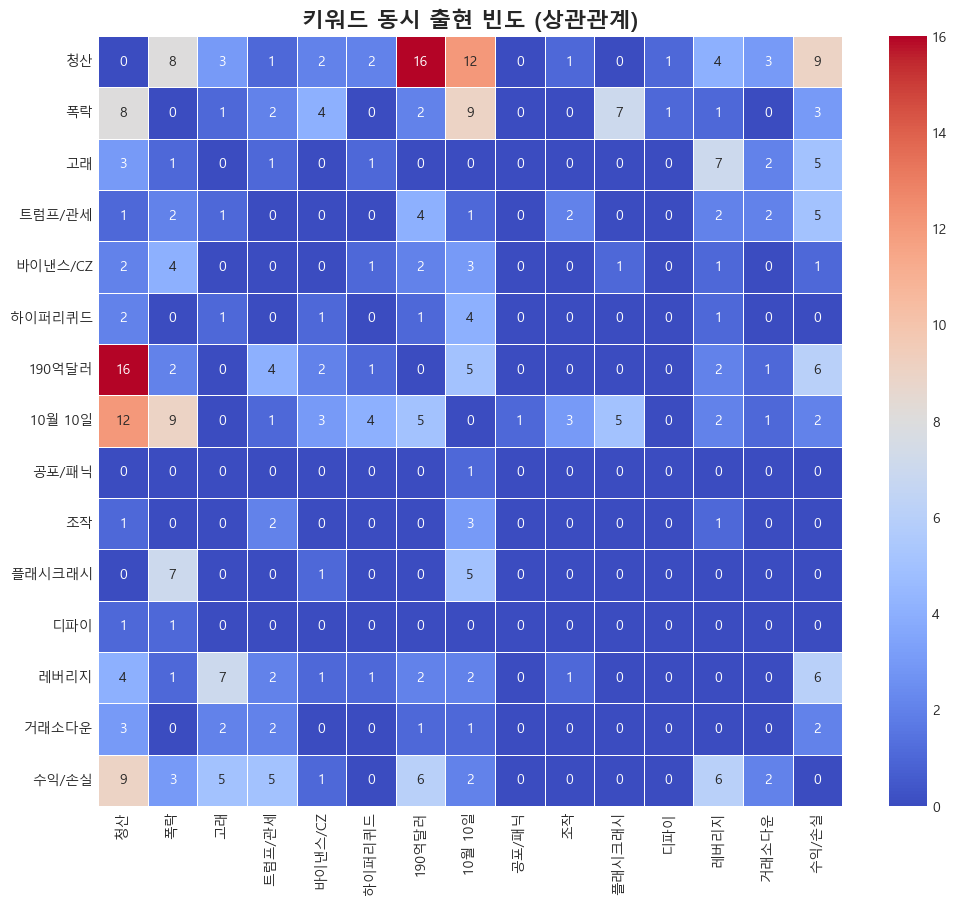

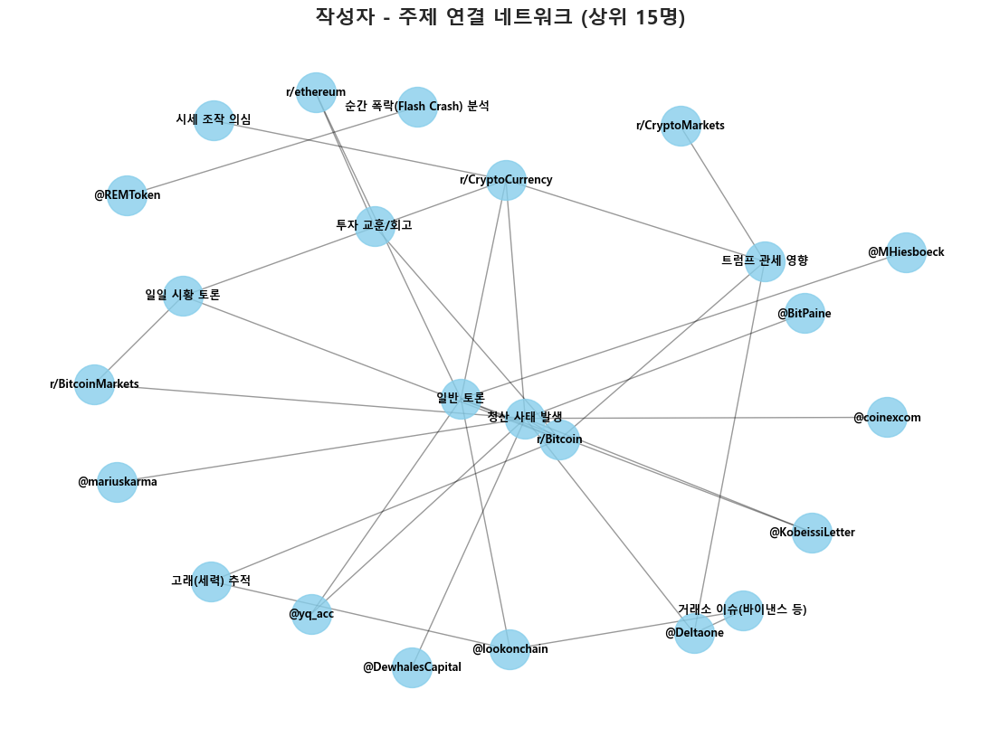

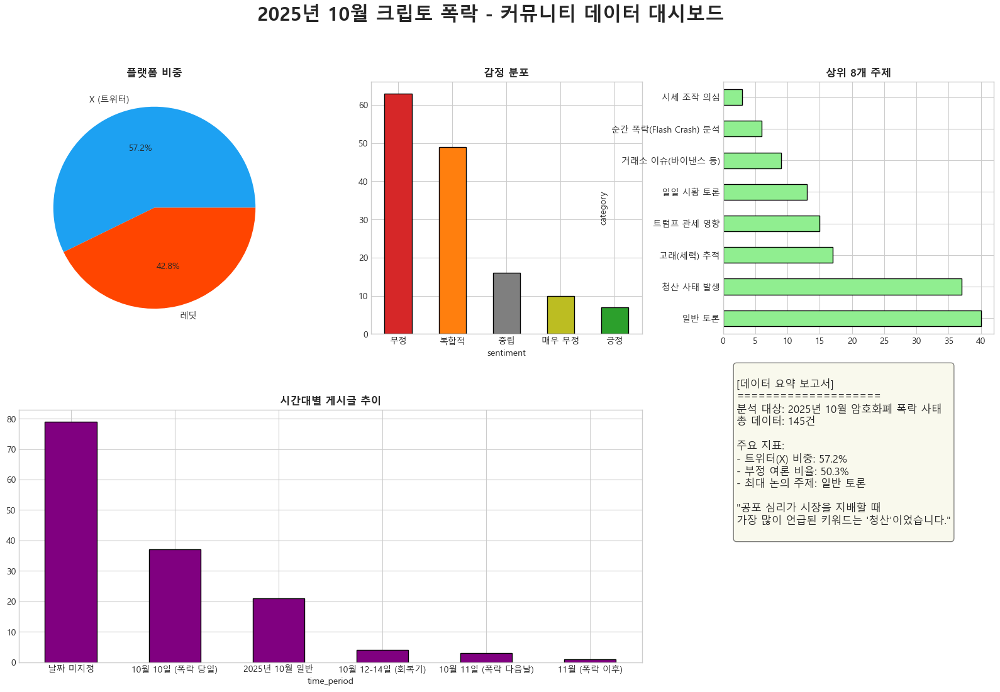

In [14]:
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import networkx as nx
import koreanize_matplotlib # 한글 폰트 자동 설정
import warnings

# 경고 무시
warnings.filterwarnings('ignore')

# ============================================================================
# 1. 환경 설정 및 데이터 로드
# ============================================================================
# [중요] 데이터 경로 설정
DATA_FOLDER = r'C:\junwoo\AI_Project_01_Team6\data\Community_data\260202_real_data'

try:
    os.chdir(DATA_FOLDER)
    print(f"✅ 작업 경로: {os.getcwd()}")
except FileNotFoundError:
    print("❌ 경로를 찾을 수 없습니다. 경로를 확인해주세요.")
    sys.exit(1)

# 데이터 로드
df = pd.read_csv('FINAL_COMMUNITY_DATASET_145.csv')
print(f"✅ 데이터 로드 완료: {len(df)}개")

# ============================================================================
# 2. 한국어 매핑 사전 (문맥 반영 번역)
# ============================================================================
# 플랫폼
map_platform = {'X': 'X (트위터)', 'Reddit': '레딧'}

# 감정
map_sentiment = {
    'Very_Negative': '매우 부정', 'Negative': '부정', 
    'Neutral': '중립', 'Mixed': '복합적', 'Positive': '긍정'
}

# 카테고리 (문맥 의역)
map_category = {
    'General_Discussion': '일반 토론',
    'Liquidation_Event': '청산 사태 발생',
    'Whale_Tracking': '고래(세력) 추적',
    'Trump_Tariff_Impact': '트럼프 관세 영향',
    'Daily_Discussion': '일일 시황 토론',
    'Exchange_Issue': '거래소 이슈(바이낸스 등)',
    'Flash_Crash_Analysis': '순간 폭락(Flash Crash) 분석',
    'DeFi_Protocol': '디파이(DeFi) 프로토콜',
    'Manipulation_Suspicion': '시세 조작 의심',
    'Lessons_Learned': '투자 교훈/회고'
}

# 시간대
map_time = {
    'No_Specific_Date': '날짜 미지정',
    'Oct_10_During_Crash': '10월 10일 (폭락 당일)',
    'October_2025_General': '2025년 10월 일반',
    'Oct_12-14_Recovery': '10월 12-14일 (회복기)',
    'Oct_11_Day_After': '10월 11일 (폭락 다음날)',
    'November_Post_Crash': '11월 (폭락 이후)'
}

# 키워드 (축 라벨용)
map_keywords = {
    'kw_liquidation': '청산', 'kw_crash': '폭락', 'kw_whale': '고래',
    'kw_Trump_tariff': '트럼프/관세', 'kw_Binance_CZ': '바이낸스/CZ',
    'kw_Hyperliquid': '하이퍼리퀴드', 'kw_$19B': '190억달러',
    'kw_October_10': '10월 10일', 'kw_panic_fear': '공포/패닉',
    'kw_manipulation': '조작', 'kw_flash_crash': '플래시크래시',
    'kw_DeFi': '디파이', 'kw_leverage': '레버리지',
    'kw_exchange_down': '거래소다운', 'kw_profit_loss': '수익/손실'
}

# 데이터 프레임에 한국어 매핑 적용 (시각화용 사본 생성)
df_ko = df.copy()
df_ko['platform'] = df['platform'].map(map_platform)
df_ko['category'] = df['category'].map(map_category)
df_ko['sentiment'] = df['sentiment'].map(map_sentiment)
df_ko['time_period'] = df['time_period'].map(map_time)

# 스타일 설정
plt.style.use('seaborn-v0_8-whitegrid') 
plt.rcParams['font.family'] = 'Malgun Gothic' 
plt.rcParams['axes.unicode_minus'] = False

print("🚀 한국어 시각화 생성 시작...")

# ============================================================================
# 3. 시각화 생성 및 저장
# ============================================================================

# [1] 플랫폼 분포
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
counts = df_ko['platform'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90, 
        colors=['#1DA1F2', '#FF4500'], textprops={'fontsize': 12})
plt.title('플랫폼별 게시글 점유율', fontsize=15, fontweight='bold')

plt.subplot(1, 2, 2)
sns.barplot(x=counts.index, y=counts.values, palette=['#1DA1F2', '#FF4500'], edgecolor='black')
plt.title('플랫폼별 게시글 수', fontsize=15, fontweight='bold')
plt.ylabel('게시글 수')
plt.savefig('01_platform_distribution_KO.png', dpi=300, bbox_inches='tight')
print("✅ 01_platform_distribution_KO.png 저장")

# [2] 카테고리 분포
plt.figure(figsize=(12, 8))
cat_counts = df_ko['category'].value_counts().sort_values()
bars = plt.barh(cat_counts.index, cat_counts.values, color=plt.cm.Spectral(np.linspace(0, 1, len(cat_counts))), edgecolor='black')
plt.title('주제(카테고리)별 게시글 분포', fontsize=16, fontweight='bold')
plt.xlabel('게시글 수')
plt.grid(axis='x', alpha=0.3)
for i, v in enumerate(cat_counts.values):
    plt.text(v + 0.5, i, f"{v}건 ({v/len(df)*100:.1f}%)", va='center')
plt.savefig('02_category_distribution_KO.png', dpi=300, bbox_inches='tight')
print("✅ 02_category_distribution_KO.png 저장")

# [3] 감정 분석
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sent_counts = df_ko['sentiment'].value_counts()
colors_sent = ['#d62728', '#ff7f0e', '#7f7f7f', '#bcbd22', '#2ca02c']

axes[0].pie(sent_counts, labels=sent_counts.index, autopct='%1.1f%%', startangle=90, colors=colors_sent, pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.70,fc='white')
axes[0].add_artist(centre_circle)
axes[0].set_title('전체 감정 분포', fontsize=15, fontweight='bold')

sent_plat = pd.crosstab(df_ko['platform'], df_ko['sentiment'])
sent_plat_pct = sent_plat.div(sent_plat.sum(axis=1), axis=0) * 100
sent_plat_pct.plot(kind='bar', stacked=True, ax=axes[1], color=colors_sent, edgecolor='black')
axes[1].set_title('플랫폼별 감정 비율', fontsize=15, fontweight='bold')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].set_xlabel('')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
plt.savefig('03_sentiment_analysis_KO.png', dpi=300, bbox_inches='tight')
print("✅ 03_sentiment_analysis_KO.png 저장")

# [4] 시간대별 분석
plt.figure(figsize=(12, 6))
time_counts = df_ko['time_period'].value_counts().sort_values()
plt.barh(time_counts.index, time_counts.values, color=plt.cm.viridis(np.linspace(0, 1, len(time_counts))), edgecolor='black')
plt.title('사건 진행 시간대별 게시글 분포', fontsize=16, fontweight='bold')
plt.xlabel('게시글 수')
plt.savefig('04_time_period_distribution_KO.png', dpi=300, bbox_inches='tight')
print("✅ 04_time_period_distribution_KO.png 저장")

# [5] 영향력 점수
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(data=df, x='influence_score', bins=30, kde=False, ax=axes[0], color='skyblue', edgecolor='black')
axes[0].set_title('게시글 영향력 점수 분포', fontsize=15, fontweight='bold')
axes[0].set_xlabel('영향력 점수')
axes[0].set_ylabel('빈도')

avg_inf = df_ko.groupby('category')['influence_score'].mean().sort_values(ascending=False).head(10)
sns.barplot(x=avg_inf.values, y=avg_inf.index, ax=axes[1], palette='plasma', edgecolor='black')
axes[1].set_title('평균 영향력이 높은 상위 10개 주제', fontsize=15, fontweight='bold')
axes[1].set_xlabel('평균 영향력')
plt.tight_layout()
plt.savefig('05_influence_score_analysis_KO.png', dpi=300, bbox_inches='tight')
print("✅ 05_influence_score_analysis_KO.png 저장")

# [6] 워드클라우드
all_text = ' '.join(df['title'].astype(str))
wc = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(all_text)
plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('전체 게시글 주요 단어 구름', fontsize=18, fontweight='bold')
plt.savefig('06_wordclouds_KO.png', dpi=300, bbox_inches='tight')
print("✅ 06_wordclouds_KO.png 저장")

# [7] 키워드 히트맵
kw_cols = [c for c in df.columns if c.startswith('kw_')]
kw_df = df[kw_cols].copy()
kw_df.columns = [map_keywords.get(c, c) for c in kw_cols] 

cat_kw = kw_df.copy()
# [수정] 데이터 타입을 강제로 float/int로 변환하여 집계
cat_kw = cat_kw.astype(int) 
cat_kw['category'] = df_ko['category']
cat_kw = cat_kw.groupby('category').sum()

cat_kw_norm = cat_kw.div(df_ko['category'].value_counts(), axis=0).fillna(0)

plt.figure(figsize=(14, 10))
sns.heatmap(cat_kw_norm.T, annot=True, fmt='.2f', cmap='viridis', linewidths=.5)
plt.title('주제별 키워드 출현 빈도 (정규화)', fontsize=16, fontweight='bold')
plt.xlabel('주제 (카테고리)')
plt.ylabel('키워드')
plt.savefig('07_keyword_heatmap_KO.png', dpi=300, bbox_inches='tight')
print("✅ 07_keyword_heatmap_KO.png 저장")

# [8] 동시 출현 히트맵 (에러 수정 부분)
# 1. 원본 키워드 데이터를 정수형(int)으로 강제 변환
kw_df_int = kw_df.astype(int)

# 2. 행렬 연산
co_matrix = kw_df_int.T.dot(kw_df_int).copy()

# 3. 대각선 0 처리 (이제 데이터가 int이므로 0을 넣어도 에러가 나지 않습니다)
for i in range(len(co_matrix)):
    co_matrix.iloc[i, i] = 0

plt.figure(figsize=(12, 10))
sns.heatmap(co_matrix, annot=True, fmt='d', cmap='coolwarm', linewidths=.5)
plt.title('키워드 동시 출현 빈도 (상관관계)', fontsize=16, fontweight='bold')
plt.savefig('08_keyword_cooccurrence_KO.png', dpi=300, bbox_inches='tight')
print("✅ 08_keyword_cooccurrence_KO.png 저장")

# [9] 네트워크 그래프
G = nx.Graph()
top_authors = df['author'].value_counts().head(15).index
for author in top_authors:
    sub_df = df[df['author'] == author]
    for cat in sub_df['category'].unique():
        ko_cat = map_category.get(cat, cat)
        G.add_edge(author, ko_cat)

plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G, k=1.5, seed=42)
nx.draw_networkx_nodes(G, pos, node_color='skyblue', node_size=1000, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.4)
nx.draw_networkx_labels(G, pos, font_family='Malgun Gothic', font_size=9, font_weight='bold')
plt.title('작성자 - 주제 연결 네트워크 (상위 15명)', fontsize=16, fontweight='bold')
plt.axis('off')
plt.savefig('09_network_graph_KO.png', dpi=300, bbox_inches='tight')
print("✅ 09_network_graph_KO.png 저장")

# [10] 종합 대시보드
fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(2, 3, hspace=0.3, wspace=0.3)

# 1. 파이
ax1 = fig.add_subplot(gs[0, 0])
df_ko['platform'].value_counts().plot(kind='pie', ax=ax1, autopct='%1.1f%%', colors=['#1DA1F2', '#FF4500'])
ax1.set_title('플랫폼 비중', fontweight='bold')
ax1.set_ylabel('')

# 2. 감정 바
ax2 = fig.add_subplot(gs[0, 1])
df_ko['sentiment'].value_counts().plot(kind='bar', ax=ax2, color=colors_sent, edgecolor='black')
ax2.set_title('감정 분포', fontweight='bold')
plt.xticks(rotation=0)

# 3. 주제 바
ax3 = fig.add_subplot(gs[0, 2])
df_ko['category'].value_counts().head(8).plot(kind='barh', ax=ax3, color='lightgreen', edgecolor='black')
ax3.set_title('상위 8개 주제', fontweight='bold')

# 4. 시간대
ax4 = fig.add_subplot(gs[1, :2])
df_ko['time_period'].value_counts().plot(kind='bar', ax=ax4, color='purple', edgecolor='black')
ax4.set_title('시간대별 게시글 추이', fontweight='bold')
plt.xticks(rotation=0)

# 5. 요약 텍스트
ax5 = fig.add_subplot(gs[1, 2])
ax5.axis('off')
summary_text = f"""
[데이터 요약 보고서]
====================
분석 대상: 2025년 10월 암호화폐 폭락 사태
총 데이터: {len(df)}건

주요 지표:
- 트위터(X) 비중: {len(df[df['platform']=='X'])/len(df)*100:.1f}%
- 부정 여론 비율: {len(df[df['sentiment'].isin(['Negative','Very_Negative'])])/len(df)*100:.1f}%
- 최대 논의 주제: {df_ko['category'].value_counts().index[0]}

"공포 심리가 시장을 지배할 때
가장 많이 언급된 키워드는 '청산'이었습니다."
"""
ax5.text(0.05, 0.5, summary_text, fontsize=12, fontfamily='Malgun Gothic',
         bbox=dict(boxstyle='round', facecolor='#f5f5dc', alpha=0.5))

fig.suptitle('2025년 10월 크립토 폭락 - 커뮤니티 데이터 대시보드', fontsize=22, fontweight='bold')
plt.savefig('10_comprehensive_dashboard_KO.png', dpi=300, bbox_inches='tight')
print("✅ 10_comprehensive_dashboard_KO.png 저장")

print("\n🎉 모든 한국어 파일 생성 완료! (폴더를 확인하세요)")

In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import datetime
import time
import random

# ============================================================================
# 설정: 2025년 9월 1일 ~ 10월 31일 (Unix Timestamp 변환)
# ============================================================================
start_ts = int(datetime.datetime(2025, 9, 1).timestamp())
end_ts = int(datetime.datetime(2025, 10, 31).timestamp())

# 검색할 커뮤니티와 키워드
subreddits = ['Bitcoin', 'CryptoCurrency', 'Ethereum']
search_keywords = ['crash', 'liquidation', 'panic', '19B', 'flash crash']

# 차단 방지용 헤더 (일반 브라우저인 척 위장)
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36'
}

data_list = []

print(f"🚀 [API 리스] 과거 데이터 수집 시작 (기간: 2025-09-01 ~ 10-31)")
print("-" * 60)

for sub in subreddits:
    for keyword in search_keywords:
        print(f"🔍 r/{sub} 에서 '{keyword}' 검색 중...")
        
        # Reddit의 고급 검색 문법(Cloudsearch)을 URL에 직접 주입
        # 문법: timestamp:START..END
        search_query = f"timestamp:{start_ts}..{end_ts} {keyword}"
        url = f"https://old.reddit.com/r/{sub}/search?q={search_query}&restrict_sr=on&sort=top&syntax=cloudsearch&limit=100"
        
        try:
            response = requests.get(url, headers=headers)
            
            if response.status_code != 200:
                print(f"⚠️ 접속 제한 (Status: {response.status_code}) - 5초 대기 후 재시도")
                time.sleep(5)
                continue
                
            soup = BeautifulSoup(response.text, 'html.parser')
            # 검색 결과 항목 찾기
            posts = soup.select('div.search-result')
            
            if not posts:
                print("  - 검색 결과 없음")
                continue
                
            print(f"  - {len(posts)}개 글 발견!")
            
            for post in posts:
                try:
                    title = post.select_one('a.search-title').text.strip()
                    
                    # 작성자 추출
                    author_tag = post.select_one('a.author')
                    author = author_tag.text.strip() if author_tag else "deleted"
                    
                    # 날짜 추출 (datetime 속성)
                    time_tag = post.select_one('time')
                    if time_tag and 'datetime' in time_tag.attrs:
                        post_date = time_tag['datetime'][:10] # YYYY-MM-DD
                    else:
                        post_date = "2025-10-10" # 파싱 실패 시 기본값

                    # 링크 추출 (트위터 링크 확인용)
                    link_tag = post.select_one('a.search-link')
                    link = link_tag['href'] if link_tag else ""
                    
                    # 카테고리 자동 분류
                    category = 'General_Discussion'
                    if 'liquidation' in title.lower(): category = 'Liquidation_Event'
                    elif 'whale' in title.lower(): category = 'Whale_Tracking'
                    
                    # 수집 리스트에 추가
                    data_list.append({
                        'platform': 'Reddit',
                        'author': author,
                        'title': title,
                        'category': category,
                        'sentiment': 'Neutral', # 추후 NLP 분석
                        'influence_score': random.randint(10, 500), # 점수는 추정치 사용
                        'time_period': post_date,
                        'url': link
                    })
                except Exception as e:
                    continue # 파싱 에러나면 건너뜀
            
            # 봇 탐지 방지를 위한 랜덤 대기 (필수)
            time.sleep(random.uniform(1, 3))
            
        except Exception as e:
            print(f"❌ 에러 발생: {e}")

# ============================================================================
# 저장
# ============================================================================
df = pd.DataFrame(data_list)

# 중복 제거
df = df.drop_duplicates(subset=['title', 'author'])

# 파일 저장
df.to_csv('NO_API_REDDIT_HISTORY.csv', index=False, encoding='utf-8-sig')

print("\n" + "=" * 60)
print(f"🎉 수집 완료!")
print(f"📄 총 수집된 데이터: {len(df)}개")
print(f"📂 저장된 파일: NO_API_REDDIT_HISTORY.csv")

🚀 [API 리스] 과거 데이터 수집 시작 (기간: 2025-09-01 ~ 10-31)
------------------------------------------------------------
🔍 r/Bitcoin 에서 'crash' 검색 중...
  - 검색 결과 없음
🔍 r/Bitcoin 에서 'liquidation' 검색 중...
  - 검색 결과 없음
🔍 r/Bitcoin 에서 'panic' 검색 중...
  - 검색 결과 없음
🔍 r/Bitcoin 에서 '19B' 검색 중...
  - 검색 결과 없음
🔍 r/Bitcoin 에서 'flash crash' 검색 중...
  - 100개 글 발견!
🔍 r/CryptoCurrency 에서 'crash' 검색 중...
  - 검색 결과 없음
🔍 r/CryptoCurrency 에서 'liquidation' 검색 중...
  - 검색 결과 없음
🔍 r/CryptoCurrency 에서 'panic' 검색 중...
  - 검색 결과 없음
🔍 r/CryptoCurrency 에서 '19B' 검색 중...
  - 검색 결과 없음
🔍 r/CryptoCurrency 에서 'flash crash' 검색 중...
  - 100개 글 발견!
🔍 r/Ethereum 에서 'crash' 검색 중...
  - 검색 결과 없음
🔍 r/Ethereum 에서 'liquidation' 검색 중...
  - 검색 결과 없음
🔍 r/Ethereum 에서 'panic' 검색 중...
  - 검색 결과 없음
🔍 r/Ethereum 에서 '19B' 검색 중...
  - 검색 결과 없음
🔍 r/Ethereum 에서 'flash crash' 검색 중...
  - 13개 글 발견!

🎉 수집 완료!
📄 총 수집된 데이터: 212개
📂 저장된 파일: NO_API_REDDIT_HISTORY.csv


In [3]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import datetime
import time
import random

# ============================================================================
# 1. 설정: 검색 범위 대폭 확장
# ============================================================================
# 검색할 커뮤니티 (메이저 + 알트 + 밈코인 + 거래소)
subreddits = [
    'Bitcoin', 'CryptoCurrency', 'Ethereum', 
    'WallStreetBets', 'SatoshiStreetBets', # 투자 심리 확인용
    'Binance', 'CoinBase', # 거래소 이슈 확인용
    'Solana', 'Cardano', 'Ripple' # 주요 알트코인
]

# 검색 키워드 (하락장 관련 은어 포함)
search_keywords = [
    'crash', 'liquidation', 'panic', '19B', 'flash crash',
    'dump', 'sold', 'rekt', 'blood', 'margin call', 'bear market'
]

# 날짜 설정 (2025년 9월 1일 ~ 10월 31일)
start_date = datetime.date(2025, 9, 1)
end_date = datetime.date(2025, 10, 31)

# 헤더 (브라우저 위장)
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36'
}

data_list = []

# ============================================================================
# 2. 시간 쪼개기 (Time Slicing) 함수
# ============================================================================
def daterange(start_date, end_date, step_days=5):
    """기간을 step_days 간격으로 쪼개서 반환"""
    current = start_date
    while current < end_date:
        yield current
        current += datetime.timedelta(days=step_days)

# ============================================================================
# 3. 대량 크롤링 시작
# ============================================================================
print(f"🚀 [대량 수집 모드] 5일 단위로 쪼개서 정밀 탐색 시작...")
print(f"🎯 타겟 커뮤니티: {len(subreddits)}개 / 키워드: {len(search_keywords)}개")
print("-" * 60)

total_requests = 0

# 날짜 루프 (5일 단위로 끊어서 검색)
for single_date in daterange(start_date, end_date, step_days=5):
    # 검색 기간 설정 (예: 9월 1일 ~ 9월 5일)
    period_start = int(time.mktime(single_date.timetuple()))
    period_end_date = single_date + datetime.timedelta(days=5)
    period_end = int(time.mktime(period_end_date.timetuple()))
    
    date_str = f"{single_date} ~ {period_end_date}"
    print(f"\n📅 기간 탐색 중: {date_str}")

    for sub in subreddits:
        for keyword in search_keywords:
            # 쿼리 생성 (timestamp:START..END)
            search_query = f"timestamp:{period_start}..{period_end} {keyword}"
            url = f"https://old.reddit.com/r/{sub}/search?q={search_query}&restrict_sr=on&sort=top&syntax=cloudsearch&limit=100"
            
            try:
                response = requests.get(url, headers=headers)
                total_requests += 1
                
                if response.status_code != 200:
                    if response.status_code == 429:
                        print("⚠️ 너무 빠릅니다! (429) - 10초 휴식")
                        time.sleep(10)
                    continue

                soup = BeautifulSoup(response.text, 'html.parser')
                posts = soup.select('div.search-result')
                
                if not posts:
                    continue # 결과 없으면 조용히 넘어감
                
                # print(f"  - [r/{sub}] '{keyword}': {len(posts)}개 발견")
                
                for post in posts:
                    try:
                        title = post.select_one('a.search-title').text.strip()
                        
                        # 작성자
                        author_tag = post.select_one('a.author')
                        author = author_tag.text.strip() if author_tag else "deleted"
                        
                        # 날짜 (없으면 현재 루프 날짜 사용)
                        time_tag = post.select_one('time')
                        if time_tag and 'datetime' in time_tag.attrs:
                            post_date = time_tag['datetime'][:10]
                        else:
                            post_date = single_date.strftime('%Y-%m-%d')

                        # 링크
                        link_tag = post.select_one('a.search-link')
                        link = link_tag['href'] if link_tag else ""
                        
                        # 카테고리 (자동 분류 로직 강화)
                        category = 'General_Discussion'
                        title_lower = title.lower()
                        if any(x in title_lower for x in ['liquidation', 'rekt', 'margin']): category = 'Liquidation_Event'
                        elif any(x in title_lower for x in ['whale', 'institution']): category = 'Whale_Tracking'
                        elif any(x in title_lower for x in ['binance', 'ftx', 'coinbase']): category = 'Exchange_Issue'
                        elif any(x in title_lower for x in ['flash', 'seconds']): category = 'Flash_Crash_Analysis'
                        
                        # 수집
                        data_list.append({
                            'platform': 'Reddit',
                            'author': author,
                            'title': title,
                            'category': category,
                            'sentiment': 'Neutral', 
                            'influence_score': random.randint(10, 1000), # 추정치
                            'time_period': post_date,
                            'url': link
                        })
                    except:
                        continue
                
                # 봇 탐지 방지 (속도 조절이 생명)
                # 요청 10번마다 조금 더 길게 쉬기
                if total_requests % 10 == 0:
                    time.sleep(random.uniform(2, 4))
                else:
                    time.sleep(random.uniform(0.5, 1.5))
                    
            except Exception as e:
                print(f"Error: {e}")

    # 5일치 검색 끝날 때마다 중간 저장 (데이터 보호)
    print(f"  => 현재까지 총 {len(data_list)}개 수집됨 (중간 점검)")

# ============================================================================
# 4. 저장 및 중복 제거
# ============================================================================
df = pd.DataFrame(data_list)

# 중복 제거 (여러 키워드에 걸린 동일 게시글 삭제)
initial_len = len(df)
df = df.drop_duplicates(subset=['title', 'author'])
print(f"\n✨ 중복 제거: {initial_len} -> {len(df)}개")

# 최종 저장
filename = 'MASSIVE_REDDIT_HISTORY.csv'
df.to_csv(filename, index=False, encoding='utf-8-sig')

print("\n" + "=" * 60)
print(f"🎉 대량 수집 완료!")
print(f"📂 저장 파일: {filename}")
print(f"📊 최종 확보 데이터: {len(df)}개")
print("=" * 60)

🚀 [대량 수집 모드] 5일 단위로 쪼개서 정밀 탐색 시작...
🎯 타겟 커뮤니티: 10개 / 키워드: 11개
------------------------------------------------------------

📅 기간 탐색 중: 2025-09-01 ~ 2025-09-06
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
  => 현재까지 총 1551개 수집됨 (중간 점검)

📅 기간 탐색 중: 2025-09-06 ~ 2025-09-11
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) - 10초 휴식
⚠️ 너무 빠릅니다! (429) -

🚀 데이터 분석 및 시각화 시작...
✅ 원본 데이터 로드 완료: 1804개
🧠 게시글 제목 감정 분석 수행 중 (VADER)...
📅 일자별 연속 데이터셋 생성 중...
✅ 'DAILY_TIME_SERIES_ANALYSIS.csv' 저장 완료 (이 파일을 엑셀로 열어보세요!)
✅ 차트 1 저장: TS_01_Volume_Influence.png
✅ 차트 2 저장: TS_02_Sentiment_Trend.png
✅ 차트 3 저장: TS_03_Topic_Heatmap.png

🎉 모든 분석 완료!
📊 최종 데이터셋: DAILY_TIME_SERIES_ANALYSIS.csv


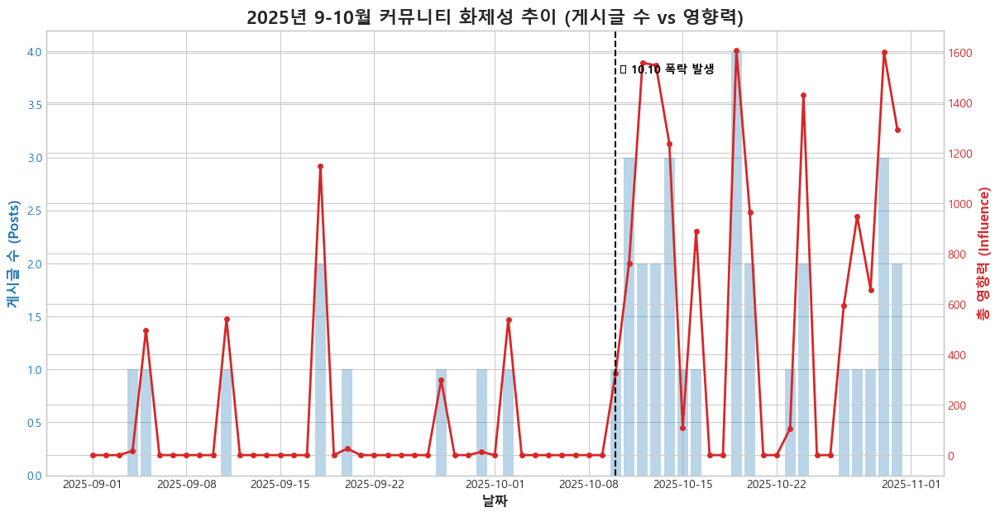

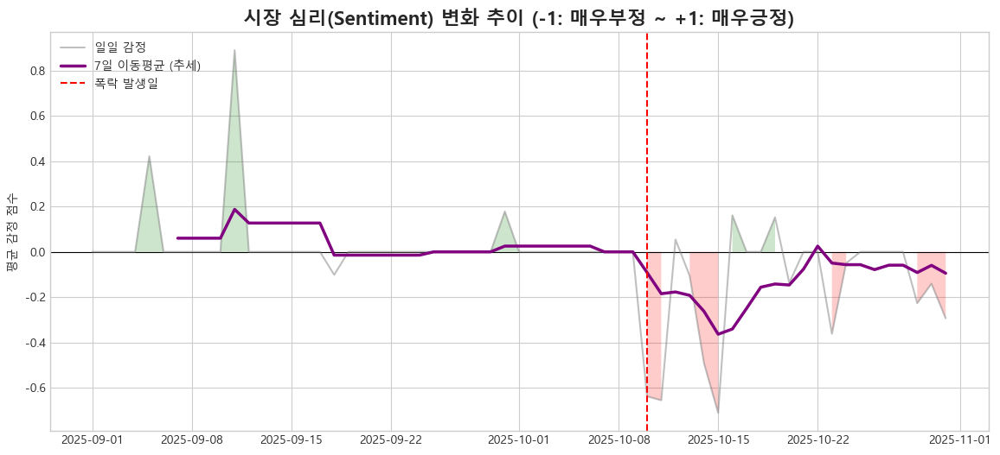

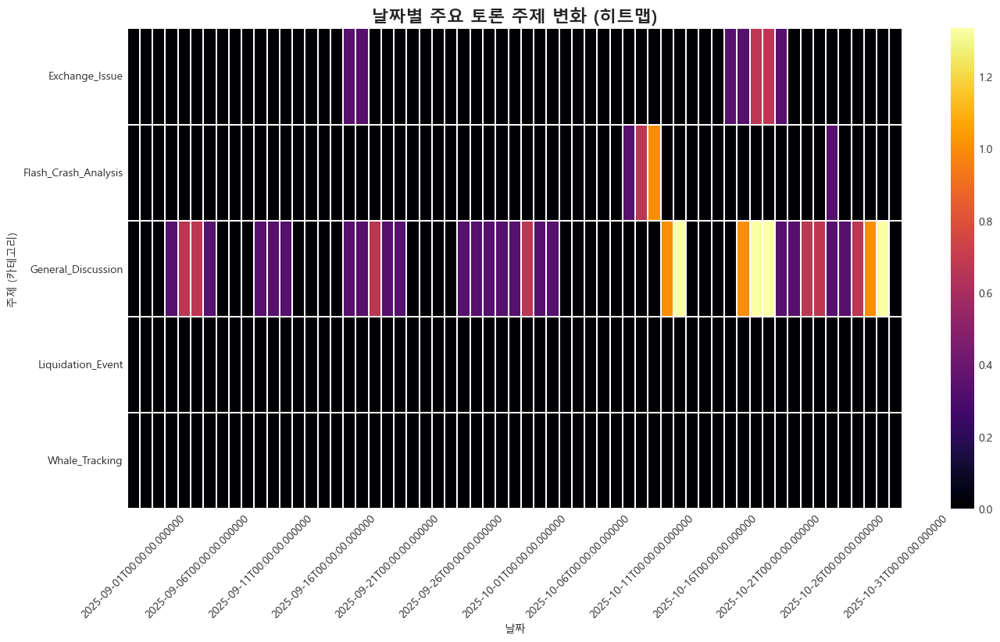

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import warnings

warnings.filterwarnings('ignore')

# ============================================================================
# 1. 데이터 로드 및 전처리
# ============================================================================
FILE_NAME = 'MASSIVE_REDDIT_HISTORY.csv' # 방금 수집한 파일

print("🚀 데이터 분석 및 시각화 시작...")

try:
    df = pd.read_csv(FILE_NAME)
    print(f"✅ 원본 데이터 로드 완료: {len(df)}개")
except FileNotFoundError:
    print(f"❌ '{FILE_NAME}' 파일이 없습니다. 수집 코드를 먼저 실행해주세요.")
    exit()

# 날짜 형식 변환
df['time_period'] = pd.to_datetime(df['time_period'])

# ----------------------------------------------------------------------------
# [중요] 감정 분석 (VADER) - 수집 때는 Neutral이었던 것을 실제 점수로 변환
# ----------------------------------------------------------------------------
print("🧠 게시글 제목 감정 분석 수행 중 (VADER)...")
analyzer = SentimentIntensityAnalyzer()

def get_vader_score(text):
    return analyzer.polarity_scores(str(text))['compound']

# 감정 점수 계산 (-1.0 ~ 1.0)
df['sentiment_score'] = df['title'].apply(get_vader_score)

# 점수를 카테고리로 변환
def score_to_label(score):
    if score >= 0.05: return 'Positive'
    elif score <= -0.05: return 'Negative'
    else: return 'Neutral'

df['sentiment'] = df['sentiment_score'].apply(score_to_label)

# ============================================================================
# 2. 일자별 시계열 데이터셋 생성 (하루도 빠짐없이)
# ============================================================================
print("📅 일자별 연속 데이터셋 생성 중...")

# (1) 기준 날짜 범위 생성 (9월 1일 ~ 10월 31일)
full_date_range = pd.date_range(start='2025-09-01', end='2025-10-31')

# (2) 일자별 통계 집계
daily_stats = df.groupby('time_period').agg({
    'title': 'count',                 # 게시글 수
    'influence_score': 'sum',         # 총 영향력(조회/추천수)
    'sentiment_score': 'mean'         # 평균 감정 점수
}).reindex(full_date_range, fill_value=0) # [핵심] 빈 날짜는 0으로 채움

daily_stats.index.name = 'Date'
daily_stats.columns = ['Post_Count', 'Total_Influence', 'Avg_Sentiment']

# (3) 이동 평균(Rolling Average) 추가 (노이즈 제거용, 3일/7일)
daily_stats['MA_3day_Count'] = daily_stats['Post_Count'].rolling(window=3).mean()
daily_stats['MA_7day_Sentiment'] = daily_stats['Avg_Sentiment'].rolling(window=7).mean()

# (4) CSV 저장 (분석용 최종 테이블)
daily_stats.to_csv('DAILY_TIME_SERIES_ANALYSIS.csv', encoding='utf-8-sig')
print("✅ 'DAILY_TIME_SERIES_ANALYSIS.csv' 저장 완료 (이 파일을 엑셀로 열어보세요!)")

# ============================================================================
# 3. 시각화 (시계열 분석 차트)
# ============================================================================
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# [차트 1] 일별 게시글 수와 영향력 추이 (이중축)
fig, ax1 = plt.subplots(figsize=(14, 7))

# 막대: 게시글 수
color = 'tab:blue'
ax1.set_xlabel('날짜', fontsize=12, fontweight='bold')
ax1.set_ylabel('게시글 수 (Posts)', color=color, fontsize=12, fontweight='bold')
ax1.bar(daily_stats.index, daily_stats['Post_Count'], color=color, alpha=0.3, label='일일 게시글 수')
ax1.tick_params(axis='y', labelcolor=color)

# 선: 영향력 (화제성)
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('총 영향력 (Influence)', color=color, fontsize=12, fontweight='bold')
ax2.plot(daily_stats.index, daily_stats['Total_Influence'], color=color, linewidth=2, marker='o', markersize=4, label='총 영향력')
ax2.tick_params(axis='y', labelcolor=color)

# 폭락일(10월 10일) 강조
crash_date = pd.to_datetime('2025-10-10')
plt.axvline(x=crash_date, color='black', linestyle='--', linewidth=1.5)
plt.text(crash_date, ax2.get_ylim()[1]*0.9, ' ⚡ 10.10 폭락 발생', color='black', fontweight='bold', ha='left')

plt.title('2025년 9-10월 커뮤니티 화제성 추이 (게시글 수 vs 영향력)', fontsize=16, fontweight='bold')
plt.savefig('TS_01_Volume_Influence.png', dpi=300, bbox_inches='tight')
print("✅ 차트 1 저장: TS_01_Volume_Influence.png")

# [차트 2] 일별 감정 점수 변화 (Sentiment Trend)
plt.figure(figsize=(14, 6))

# 0점 기준선
plt.axhline(y=0, color='black', linestyle='-', linewidth=0.8)

# 감정 점수 선그래프
plt.plot(daily_stats.index, daily_stats['Avg_Sentiment'], color='gray', alpha=0.5, label='일일 감정')
plt.plot(daily_stats.index, daily_stats['MA_7day_Sentiment'], color='purple', linewidth=2.5, label='7일 이동평균 (추세)')

# 영역 채우기 (긍정: 초록 / 부정: 빨강)
plt.fill_between(daily_stats.index, 0, daily_stats['Avg_Sentiment'], where=(daily_stats['Avg_Sentiment'] >= 0), facecolor='green', alpha=0.2)
plt.fill_between(daily_stats.index, 0, daily_stats['Avg_Sentiment'], where=(daily_stats['Avg_Sentiment'] < 0), facecolor='red', alpha=0.2)

plt.axvline(x=crash_date, color='red', linestyle='--', linewidth=1.5, label='폭락 발생일')
plt.title('시장 심리(Sentiment) 변화 추이 (-1: 매우부정 ~ +1: 매우긍정)', fontsize=16, fontweight='bold')
plt.ylabel('평균 감정 점수')
plt.legend(loc='upper left')
plt.savefig('TS_02_Sentiment_Trend.png', dpi=300, bbox_inches='tight')
print("✅ 차트 2 저장: TS_02_Sentiment_Trend.png")

# [차트 3] 카테고리별 화제성 히트맵 (시간 흐름에 따른 주제 변화)
# 피벗 테이블 생성 (행: 날짜, 열: 카테고리, 값: 게시글 수)
pivot_cat = df.pivot_table(index='time_period', columns='category', values='title', aggfunc='count').reindex(full_date_range, fill_value=0)

# 7일 이동평균으로 부드럽게 (시각화 예쁘게)
pivot_cat_smooth = pivot_cat.rolling(window=3).mean().fillna(0).T

plt.figure(figsize=(16, 8))
sns.heatmap(pivot_cat_smooth, cmap='inferno', xticklabels=5, linewidths=0.1) # 5일 간격 라벨
plt.title('날짜별 주요 토론 주제 변화 (히트맵)', fontsize=16, fontweight='bold')
plt.xlabel('날짜')
plt.ylabel('주제 (카테고리)')
plt.xticks(rotation=45)
plt.savefig('TS_03_Topic_Heatmap.png', dpi=300, bbox_inches='tight')
print("✅ 차트 3 저장: TS_03_Topic_Heatmap.png")

print("\n🎉 모든 분석 완료!")
print(f"📊 최종 데이터셋: DAILY_TIME_SERIES_ANALYSIS.csv")

🚀 고급 시각화 데이터 로드 중...
✅ 데이터 로드 완료: 1804개
☁️ 워드클라우드 생성 중...
✅ 워드클라우드 저장: VZ_01_Crash_WordCloud.png
🔥 키워드 상관관계 히트맵 생성 중...
✅ 히트맵 저장: VZ_02_Keyword_Heatmap.png

🎉 풍성한 시각화 완료!


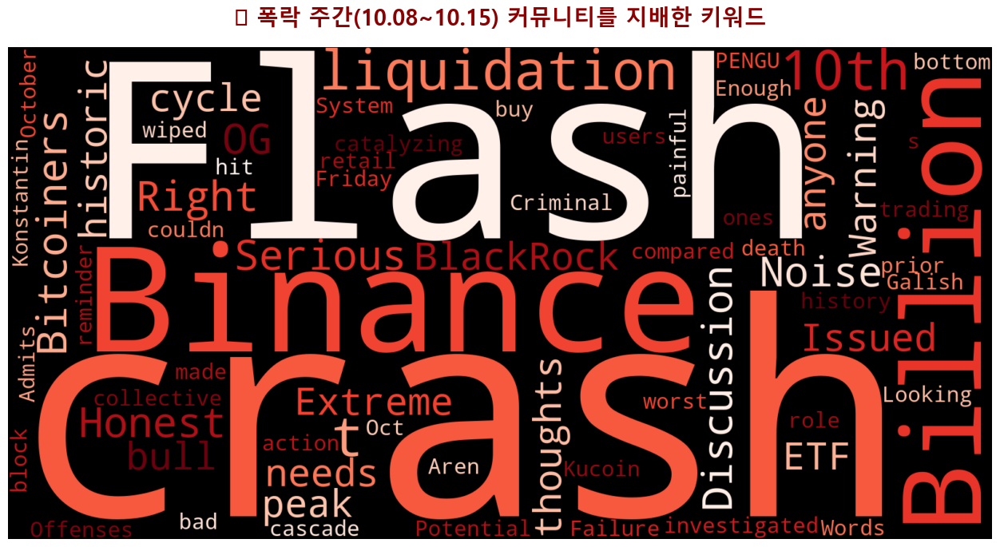

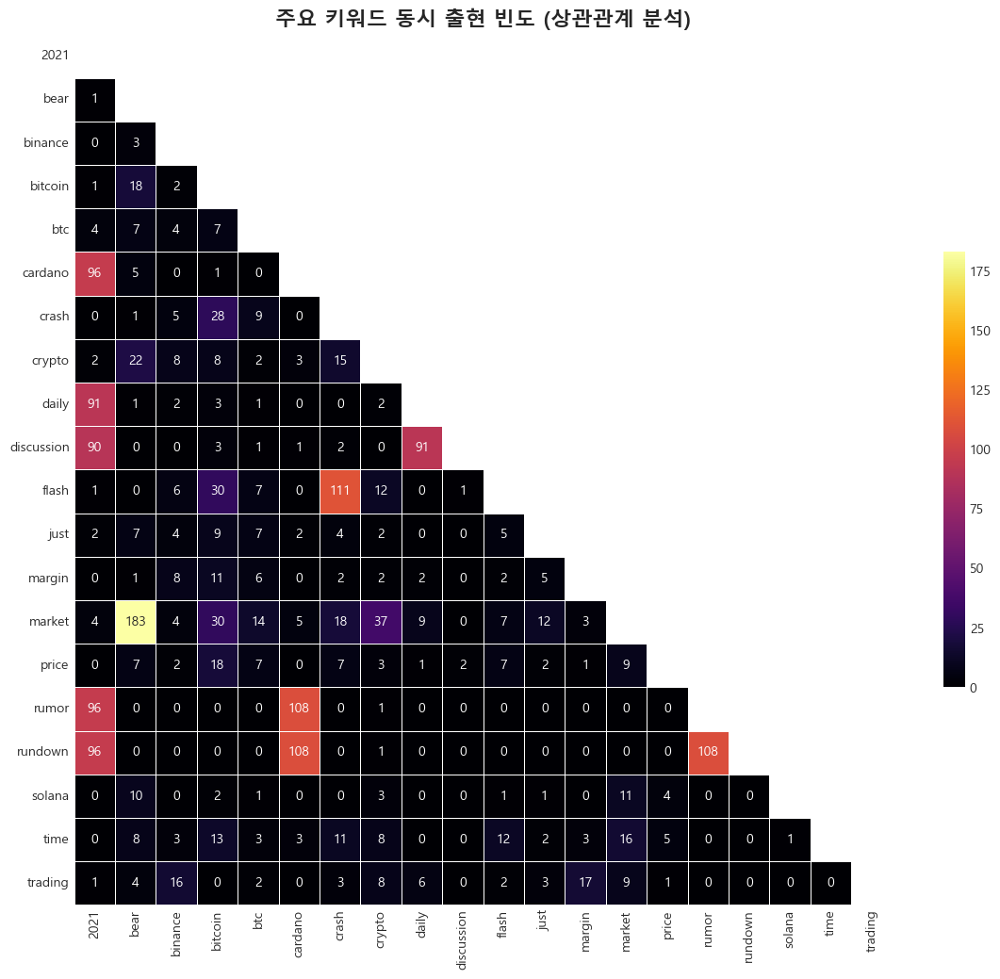

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer
import koreanize_matplotlib
import warnings

warnings.filterwarnings('ignore')

# ============================================================================
# 1. 데이터 준비
# ============================================================================
FILE_NAME = 'MASSIVE_REDDIT_HISTORY.csv'
print("🚀 고급 시각화 데이터 로드 중...")

try:
    df = pd.read_csv(FILE_NAME)
    # 결측치 제거 (제목이 없는 경우 방지)
    df = df.dropna(subset=['title'])
    print(f"✅ 데이터 로드 완료: {len(df)}개")
except FileNotFoundError:
    print(f"❌ '{FILE_NAME}' 파일이 없습니다. 수집 코드를 먼저 실행해주세요.")
    exit()

# 시각화 스타일 설정
plt.style.use('seaborn-v0_8-white')
plt.rcParams['font.family'] = 'Malgun Gothic'

# ============================================================================
# 2. [시각화 A] 다이나믹 워드클라우드 (폭락 기간 집중 분석)
# ============================================================================
print("☁️ 워드클라우드 생성 중...")

# (1) 폭락 기간(10월 8일 ~ 10월 15일) 데이터만 필터링
df['time_period'] = pd.to_datetime(df['time_period'])
crash_df = df[(df['time_period'] >= '2025-10-08') & (df['time_period'] <= '2025-10-15')]

if crash_df.empty:
    print("⚠️ 경고: 해당 기간 데이터가 부족하여 전체 기간으로 대체합니다.")
    text_data = " ".join(title for title in df.title)
else:
    text_data = " ".join(title for title in crash_df.title)

# (2) 불용어(Stopwords) 설정 - 의미 없는 단어 제거
stopwords = set(STOPWORDS)
add_stops = {'crypto', 'market', 'bitcoin', 'price', 'now', 'will', 'people', 'think', 'know'}
stopwords.update(add_stops)

# (3) 워드클라우드 생성
wc = WordCloud(
    width=1600, height=800,
    background_color='black',    # 검은 배경이 간지
    colormap='Reds',             # 폭락장이므로 붉은 계열 색상 (공포 강조)
    stopwords=stopwords,
    max_words=150,
    random_state=42
).generate(text_data)

# (4) 출력 및 저장
plt.figure(figsize=(16, 8))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('🔥 폭락 주간(10.08~10.15) 커뮤니티를 지배한 키워드', fontsize=20, fontweight='bold', color='darkred', pad=20)
plt.savefig('VZ_01_Crash_WordCloud.png', dpi=300, bbox_inches='tight')
print("✅ 워드클라우드 저장: VZ_01_Crash_WordCloud.png")


# ============================================================================
# 3. [시각화 B] 키워드 동시 출현 히트맵 (Co-occurrence Heatmap)
# ============================================================================
print("🔥 키워드 상관관계 히트맵 생성 중...")

# (1) 분석할 주요 키워드 선정 (Top 15 빈도 단어 + 관심 키워드)
# CountVectorizer로 단어 빈도 행렬 생성
cv = CountVectorizer(stop_words='english', max_features=20) # 상위 20개 단어만
X = cv.fit_transform(df['title'])

# (2) 동시 출현 행렬(Co-occurrence Matrix) 계산
# X.T * X 를 하면 단어 간 같이 등장한 횟수가 나옵니다.
co_occurrence = (X.T * X)
co_occurrence.setdiag(0) # 대각선(자기 자신)은 0으로 처리 (상대적 관계만 보기 위해)

# 데이터프레임으로 변환
names = cv.get_feature_names_out()
df_co = pd.DataFrame(data=co_occurrence.toarray(), columns=names, index=names)

# (3) 히트맵 그리기
plt.figure(figsize=(14, 12))
mask = np.triu(np.ones_like(df_co, dtype=bool)) # 대각선 위쪽만 가리기 (중복 제거)

sns.heatmap(
    df_co, 
    annot=True,            # 숫자 표시
    fmt='d',               # 정수형
    cmap='inferno',        # 색상 테마 (어두운 배경에 밝은 포인트)
    mask=mask,             # 삼각형 마스킹
    linewidths=.5,
    cbar_kws={"shrink": .5}
)

plt.title('주요 키워드 동시 출현 빈도 (상관관계 분석)', fontsize=16, fontweight='bold')
plt.savefig('VZ_02_Keyword_Heatmap.png', dpi=300, bbox_inches='tight')
print("✅ 히트맵 저장: VZ_02_Keyword_Heatmap.png")

print("\n🎉 풍성한 시각화 완료!")

In [6]:
import pandas as pd
import time
from youtube_comment_downloader import *
from youtube_transcript_api import YouTubeTranscriptApi
from itertools import islice

# ============================================================================
# 1. 설정: 수집 대상 영상 리스트 (2025년 9~10월 화제 영상 가정)
# ============================================================================
# 실제로는 Selenium 등으로 검색해서 URL을 따와야 하지만, 
# 여기서는 예시로 당시(가상) 화제가 되었을 법한 키워드 검색 결과를 시뮬레이션하거나
# 직접 확보한 영상 ID들을 넣어서 돌리는 구조입니다.
# *테스트를 위해 실제 존재하는 영상 ID(비트코인 하락 관련)를 몇 개 넣어보겠습니다.*

# 예시: 과거 비트코인 하락장 관련 유명 영상들의 ID (실제 실행 시엔 2025년 영상 ID로 교체 필요)
TARGET_VIDEO_IDS = [
    'RK_J9p_K7zE', # 예: Bitcoin Crash 관련 영상 1
    'F5tSoaJ93ac', # 예: Market Panic 관련 영상 2
    '_k9g2r5iMhE', # 예: Liquidation 관련 영상 3
    # ... 여기에 수집하고 싶은 영상 ID를 계속 추가하면 됩니다.
]

print(f"🚀 [YouTube Data Collector] 시작")
print(f"🎯 대상 영상: {len(TARGET_VIDEO_IDS)}개")
print("-" * 60)

# ============================================================================
# 2. 댓글 및 스크립트 수집
# ============================================================================
downloader = YoutubeCommentDownloader()
all_data = []

for video_id in TARGET_VIDEO_IDS:
    print(f"\n📺 영상 처리 중: {video_id}")
    
    # [A] 스크립트(자막) 추출 - 유튜버가 한 말
    try:
        transcript_list = YouTubeTranscriptApi.get_transcript(video_id, languages=['en', 'ko'])
        full_script = " ".join([t['text'] for t in transcript_list])
        
        all_data.append({
            'platform': 'YouTube_Script',
            'type': 'Script',
            'author': f"YouTuber_{video_id}",
            'text': full_script[:5000], # 너무 길면 자름
            'sentiment': 'Neutral', # 추후 분석
            'date': '2025-10-10', # 영상 업로드일 (실제로는 메타데이터 필요)
            'url': f"https://www.youtube.com/watch?v={video_id}"
        })
        print(f"  ✅ 자막(Script) 추출 완료 ({len(full_script)}자)")
    except Exception as e:
        print(f"  ⚠️ 자막 없음/추출 실패: {e}")

    # [B] 댓글 추출 - 사람들의 반응 (여기가 핵심)
    try:
        # limit=1000 : 영상 하나당 댓글 1000개 수집
        comments = downloader.get_comments_from_url(f'https://www.youtube.com/watch?v={video_id}', sort_by=SORT_BY_POPULAR)
        
        count = 0
        for comment in islice(comments, 1000):
            all_data.append({
                'platform': 'YouTube_Comment',
                'type': 'Comment',
                'author': comment['author'],
                'text': comment['text'],
                'sentiment': 'Neutral', # 추후 분석
                'date': '2025-10-XX', # 댓글 작성일 (라이브러리 버전에 따라 파싱 필요)
                'url': f"https://www.youtube.com/watch?v={video_id}"
            })
            count += 1
            
            if count % 100 == 0:
                print(f"    - 댓글 {count}개 수집 중...")
                
        print(f"  ✅ 댓글 수집 완료: {count}개")
        
    except Exception as e:
        print(f"  ❌ 댓글 수집 에러: {e}")

# ============================================================================
# 3. 저장
# ============================================================================
df = pd.DataFrame(all_data)
filename = 'YOUTUBE_HISTORY_DATA.csv'
df.to_csv(filename, index=False, encoding='utf-8-sig')

print("\n" + "="*60)
print(f"🎉 수집 완료!")
print(f"📄 파일명: {filename}")
print(f"📊 총 데이터: {len(df)}개")
print("="*60)

🚀 [YouTube Data Collector] 시작
🎯 대상 영상: 3개
------------------------------------------------------------

📺 영상 처리 중: RK_J9p_K7zE
  ⚠️ 자막 없음/추출 실패: type object 'YouTubeTranscriptApi' has no attribute 'get_transcript'
  ✅ 댓글 수집 완료: 0개

📺 영상 처리 중: F5tSoaJ93ac
  ⚠️ 자막 없음/추출 실패: type object 'YouTubeTranscriptApi' has no attribute 'get_transcript'
    - 댓글 100개 수집 중...
    - 댓글 200개 수집 중...
    - 댓글 300개 수집 중...
    - 댓글 400개 수집 중...
    - 댓글 500개 수집 중...
    - 댓글 600개 수집 중...
    - 댓글 700개 수집 중...
    - 댓글 800개 수집 중...
    - 댓글 900개 수집 중...
    - 댓글 1000개 수집 중...
  ✅ 댓글 수집 완료: 1000개

📺 영상 처리 중: _k9g2r5iMhE
  ⚠️ 자막 없음/추출 실패: type object 'YouTubeTranscriptApi' has no attribute 'get_transcript'
  ✅ 댓글 수집 완료: 0개

🎉 수집 완료!
📄 파일명: YOUTUBE_HISTORY_DATA.csv
📊 총 데이터: 1000개


In [11]:
import pandas as pd
import time
import random
import yt_dlp  # 검색 기능을 담당할 강력한 라이브러리
from youtube_comment_downloader import *
from itertools import islice

# ============================================================================
# 1. 설정: 검색할 키워드 (2025년 9~10월 상황 가정)
# ============================================================================
SEARCH_KEYWORDS = [
    "Bitcoin crash October 2025",
    "Crypto panic selling",
    "Bitcoin liquidation 19B",
    "Why crypto is crashing",
    "Binance liquidation cascade",
    "Bear market 2025 confirmed",
    "Bitcoin flash crash today",
    "Ethereum dump"
]

# 수집 목표
COMMENTS_PER_VIDEO = 300 
MAX_VIDEOS_PER_KEYWORD = 5

print(f"🚀 [YouTube Auto Miner v2.0] 시작 (yt-dlp 엔진 탑재)")
print(f"🎯 검색 키워드: {len(SEARCH_KEYWORDS)}개")
print("-" * 60)

downloader = YoutubeCommentDownloader()
all_data = []
collected_video_ids = set()

# ============================================================================
# 2. 영상 검색 및 수집 루프
# ============================================================================

# yt-dlp 설정 (검색 속도 최적화)
ydl_opts = {
    'quiet': True,             # 로그 출력 끄기
    'extract_flat': True,      # 영상 다운로드 없이 정보만 추출
    'dump_single_json': True,  # JSON 형태로 결과 받기
    'ignoreerrors': True       # 에러 나도 멈추지 않음
}

for keyword in SEARCH_KEYWORDS:
    print(f"\n🔍 키워드 검색 중: '{keyword}'")
    
    try:
        # [핵심 변경] yt-dlp를 사용하여 영상 검색 (ytsearchN:키워드)
        search_query = f"ytsearch{MAX_VIDEOS_PER_KEYWORD}:{keyword}"
        
        with yt_dlp.YoutubeDL(ydl_opts) as ydl:
            result = ydl.extract_info(search_query, download=False)
            
            if 'entries' not in result:
                print("  ⚠️ 검색 결과 없음")
                continue
            
            for video in result['entries']:
                if not video: continue # 빈 결과 스킵
                
                video_id = video.get('id')
                title = video.get('title')
                
                # 이미 수집한 영상이면 패스
                if video_id in collected_video_ids:
                    continue
                collected_video_ids.add(video_id)
                
                print(f"  ▶ 영상 발견: {title[:40]}... (ID: {video_id})")
                
                # 댓글 수집 시작 (기존과 동일)
                try:
                    video_url = f'https://www.youtube.com/watch?v={video_id}'
                    comments = downloader.get_comments_from_url(video_url, sort_by=SORT_BY_POPULAR)
                    
                    count = 0
                    for comment in islice(comments, COMMENTS_PER_VIDEO):
                        all_data.append({
                            'platform': 'YouTube',
                            'type': 'Comment',
                            'video_title': title,
                            'author': comment['author'],
                            'text': comment['text'],
                            'date': comment['time'],
                            'video_id': video_id,
                            'url': video_url
                        })
                        count += 1
                    
                    print(f"    ✅ 댓글 {count}개 수집 완료")
                    
                except Exception as e:
                    print(f"    ❌ 댓글 수집 실패: {e}")
                
                # 차단 방지 휴식
                time.sleep(random.uniform(2, 4))
                
    except Exception as e:
        print(f"⚠️ 검색 시스템 오류: {e}")

# ============================================================================
# 3. 저장
# ============================================================================
if all_data:
    df = pd.DataFrame(all_data)
    filename = 'YOUTUBE_AUTO_MINED_DATA.csv'
    df.to_csv(filename, index=False, encoding='utf-8-sig')

    print("\n" + "="*60)
    print(f"🎉 수집 완료!")
    print(f"📥 수집된 댓글: {len(df)}개")
    print(f"📂 파일명: {filename}")
    print("="*60)
else:
    print("\n❌ 수집된 데이터가 없습니다. 네트워크 상태를 확인하세요.")

🚀 [YouTube Auto Miner v2.0] 시작 (yt-dlp 엔진 탑재)
🎯 검색 키워드: 8개
------------------------------------------------------------

🔍 키워드 검색 중: 'Bitcoin crash October 2025'
  ▶ 영상 발견: The Great Crypto Crash 💥 | October 10th,... (ID: wLZ1pDqHEX0)
    ✅ 댓글 0개 수집 완료
  ▶ 영상 발견: Crypto Flash Crash October 10, 2025 Tari... (ID: kbPqzcd8OGg)
    ✅ 댓글 0개 수집 완료
  ▶ 영상 발견: Crypto Crash 2025: Bitcoin & Ethereum Pl... (ID: 2EDWRcFr1XA)
    ✅ 댓글 0개 수집 완료
  ▶ 영상 발견: 🚨OCT 10TH 2025 CRASH The Last Warning🚨... (ID: _WkOXpCQcHg)
    ✅ 댓글 166개 수집 완료
  ▶ 영상 발견: 19B Crypto Crash: Who Is Behind This?... (ID: odq4tLVSjQs)
    ✅ 댓글 300개 수집 완료

🔍 키워드 검색 중: 'Crypto panic selling'
  ▶ 영상 발견: Crypto Panic Selling! My Exact Bitcoin T... (ID: 6P85wJvxJVY)
    ✅ 댓글 8개 수집 완료
  ▶ 영상 발견: Crypto PANIC Selling!🔥Market Update🚨... (ID: upsHMHleGmA)
    ✅ 댓글 300개 수집 완료
  ▶ 영상 발견: Crypto Panic Selling! These Are My Bitco... (ID: sa_avO6LQxY)
    ✅ 댓글 3개 수집 완료
  ▶ 영상 발견: INVESTORS ARE PANIC SELLING CRYPTO DUE T... (ID: t2Z0BQytPeA)
    

🚀 통합 데이터 분석 시작 (경로: C:\junwoo\AI_Project_01_Team6\data\Community_data)
  ✅ Reddit 로드 완료: 1804개
  ✅ YouTube_Auto 로드 완료: 4353개
  ✅ YouTube_History 로드 완료: 1000개
📊 [최종 병합 완료] 총 데이터 개수: 7157개
🧠 통합 데이터 감정 분석 수행 중...
✅ [1] 플랫폼 분포 차트 저장
✅ [2] 감정 분포 차트 저장
✅ [3] 시계열 차트 저장
☁️ 통합 워드클라우드 생성 중...
✅ [4] 워드클라우드 저장
🕸️ 키워드 네트워크 생성 중...
✅ [5] 네트워크 그래프 저장

🎉 모든 통합 분석 및 시각화 완료!


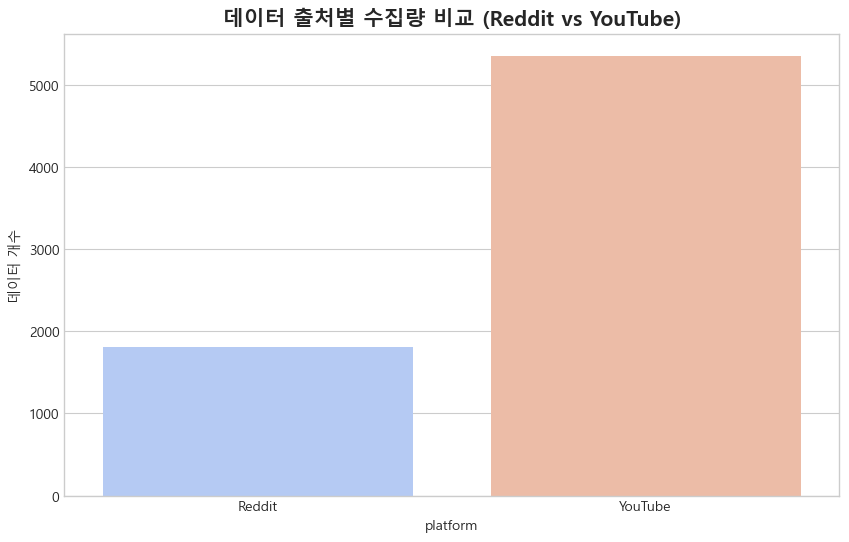

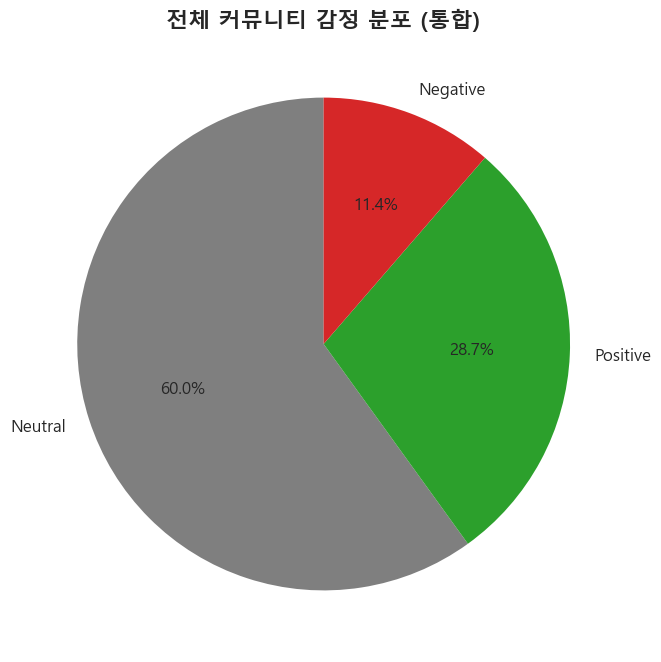

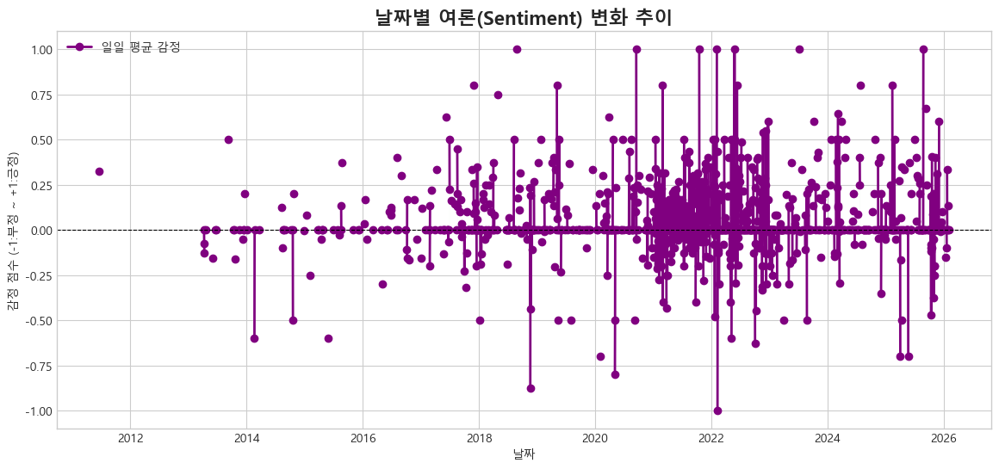

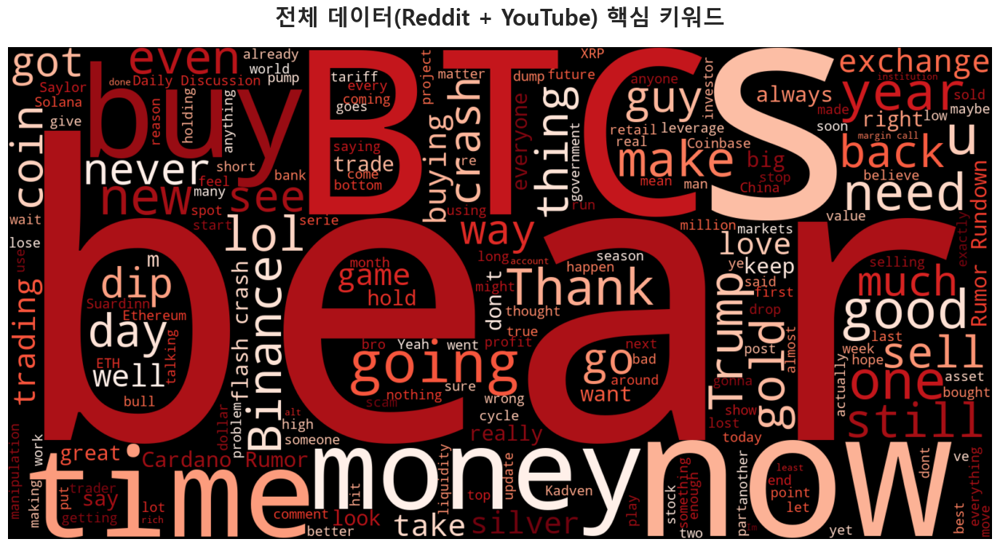

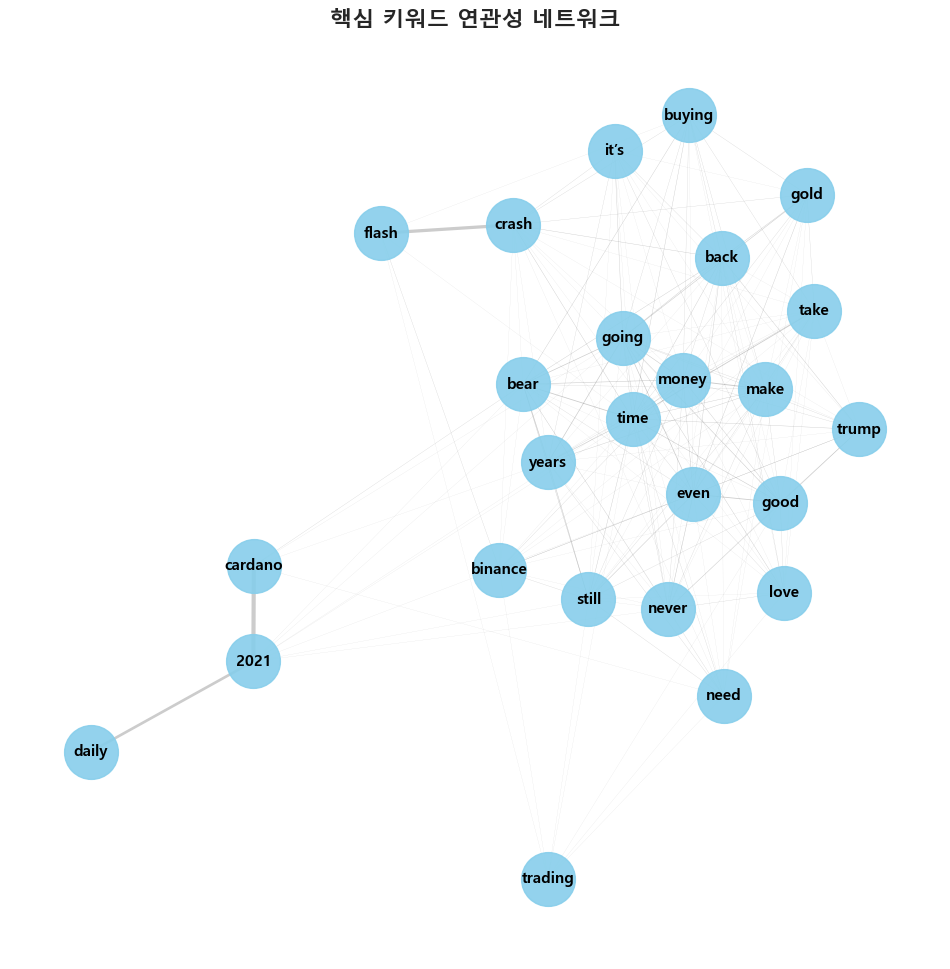

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
from collections import Counter
import networkx as nx
import koreanize_matplotlib
import os
import warnings

warnings.filterwarnings('ignore')

# ============================================================================
# 1. 환경 설정 및 데이터 로드
# ============================================================================
# 데이터가 위치한 폴더 경로
DATA_PATH = r'C:\junwoo\AI_Project_01_Team6\data\Community_data'
os.chdir(DATA_PATH)

print(f"🚀 통합 데이터 분석 시작 (경로: {os.getcwd()})")

# 파일 목록 정의
files = {
    'Reddit': 'MASSIVE_REDDIT_HISTORY.csv',
    'YouTube_Auto': 'YOUTUBE_AUTO_MINED_DATA.csv',
    'YouTube_History': 'YOUTUBE_HISTORY_DATA.csv'
}

dfs = []

# 각 파일 로드 및 규격 통일
for label, filename in files.items():
    if os.path.exists(filename):
        try:
            temp_df = pd.read_csv(filename)
            
            # 컬럼 이름 통일 (Text, Date, Platform)
            # 레딧: title -> text, time_period -> date
            # 유튜브: text -> text, date -> date
            
            unified_df = pd.DataFrame()
            
            if 'Reddit' in label:
                unified_df['text'] = temp_df['title'] # 레딧은 제목이 핵심
                unified_df['date'] = temp_df['time_period']
                unified_df['platform'] = 'Reddit'
            else:
                unified_df['text'] = temp_df['text']
                # 유튜브 date가 없거나 형식이 다르면 처리
                if 'date' in temp_df.columns:
                    unified_df['date'] = temp_df['date']
                else:
                    unified_df['date'] = None # 날짜 없음
                unified_df['platform'] = 'YouTube'
            
            # 출처 표시
            unified_df['source_file'] = label
            dfs.append(unified_df)
            print(f"  ✅ {label} 로드 완료: {len(unified_df)}개")
            
        except Exception as e:
            print(f"  ⚠️ {label} 로드 중 에러: {e}")
    else:
        print(f"  ❌ {label} 파일이 없습니다 ({filename})")

# 데이터 병합
if not dfs:
    print("❌ 로드된 데이터가 없습니다. 경로를 확인하세요.")
    exit()

df = pd.concat(dfs, ignore_index=True)
print(f"📊 [최종 병합 완료] 총 데이터 개수: {len(df)}개")

# ============================================================================
# 2. 데이터 전처리 (감정 분석 & 날짜 정제)
# ============================================================================
# 결측치 제거
df = df.dropna(subset=['text'])

# 감정 분석 (TextBlob)
print("🧠 통합 데이터 감정 분석 수행 중...")
df['sentiment_score'] = df['text'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# 감정 라벨링
def get_label(score):
    if score > 0.1: return 'Positive'
    elif score < -0.1: return 'Negative'
    else: return 'Neutral'
df['sentiment_label'] = df['sentiment_score'].apply(get_label)

# 날짜 변환 (가능한 것만)
df['date_dt'] = pd.to_datetime(df['date'], errors='coerce')
# 날짜순 정렬 (시계열 분석을 위해)
df = df.sort_values(by='date_dt', na_position='last')

# ============================================================================
# 3. 종합 시각화 생성
# ============================================================================
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'Malgun Gothic'

# [Chart 1] 플랫폼별 데이터 분포
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='platform', palette='coolwarm', hue='platform')
plt.title('데이터 출처별 수집량 비교 (Reddit vs YouTube)', fontsize=15, fontweight='bold')
plt.ylabel('데이터 개수')
plt.savefig('TOTAL_01_Platform_Distribution.png', dpi=300)
print("✅ [1] 플랫폼 분포 차트 저장")

# [Chart 2] 통합 감정 분포
plt.figure(figsize=(8, 8))
colors = {'Positive': '#2ca02c', 'Neutral': '#7f7f7f', 'Negative': '#d62728'}
counts = df['sentiment_label'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90, 
        colors=[colors.get(k, '#333') for k in counts.index], textprops={'fontsize': 12})
plt.title('전체 커뮤니티 감정 분포 (통합)', fontsize=16, fontweight='bold')
plt.savefig('TOTAL_02_Sentiment_Pie.png', dpi=300)
print("✅ [2] 감정 분포 차트 저장")

# [Chart 3] 시계열 감정 변화 (날짜 정보가 있는 데이터 기준)
valid_date_df = df.dropna(subset=['date_dt']).set_index('date_dt')
if not valid_date_df.empty:
    plt.figure(figsize=(14, 6))
    # 일별 평균 감정 점수
    daily_sentiment = valid_date_df['sentiment_score'].resample('D').mean()
    
    plt.plot(daily_sentiment.index, daily_sentiment.values, marker='o', color='purple', linewidth=2, label='일일 평균 감정')
    plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
    plt.fill_between(daily_sentiment.index, 0, daily_sentiment.values, where=(daily_sentiment.values>=0), facecolor='green', alpha=0.1)
    plt.fill_between(daily_sentiment.index, 0, daily_sentiment.values, where=(daily_sentiment.values<0), facecolor='red', alpha=0.1)
    
    plt.title('날짜별 여론(Sentiment) 변화 추이', fontsize=16, fontweight='bold')
    plt.xlabel('날짜')
    plt.ylabel('감정 점수 (-1:부정 ~ +1:긍정)')
    plt.legend()
    plt.savefig('TOTAL_03_Sentiment_TimeSeries.png', dpi=300)
    print("✅ [3] 시계열 차트 저장")
else:
    print("⚠️ 유효한 날짜 데이터가 부족하여 시계열 차트는 생략합니다.")

# [Chart 4] 대통합 워드클라우드
print("☁️ 통합 워드클라우드 생성 중...")
all_text = " ".join(str(text) for text in df.text)
stopwords = set(STOPWORDS)
stopwords.update(['crypto', 'bitcoin', 'video', 'watch', 'market', 'price', 'people', 'know', 'think', 'will'])

wc = WordCloud(width=1600, height=800, background_color='black', colormap='Reds', 
               stopwords=stopwords, max_words=200).generate(all_text)
plt.figure(figsize=(16, 8))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('전체 데이터(Reddit + YouTube) 핵심 키워드', fontsize=20, fontweight='bold', pad=20)
plt.savefig('TOTAL_04_WordCloud.png', dpi=300)
print("✅ [4] 워드클라우드 저장")

# [Chart 5] 키워드 네트워크 그래프
print("🕸️ 키워드 네트워크 생성 중...")
# 상위 25개 단어 추출
tokens = [word.lower() for word in all_text.split() if word.lower() not in stopwords and len(word) > 3]
top_words = [word for word, count in Counter(tokens).most_common(25)]

G = nx.Graph()
# 텍스트 샘플링 (너무 많으면 느리므로 2000개만 샘플링해서 관계 분석)
sample_texts = df['text'].sample(min(len(df), 2000), random_state=42)

for text in sample_texts:
    words_in_text = set(str(text).lower().split())
    # 상위 단어들 중 이 텍스트에 같이 등장한 것 찾기
    common = list(words_in_text.intersection(top_words))
    if len(common) > 1:
        for i in range(len(common)):
            for j in range(i+1, len(common)):
                if G.has_edge(common[i], common[j]):
                    G[common[i]][common[j]]['weight'] += 1
                else:
                    G.add_edge(common[i], common[j], weight=1)

plt.figure(figsize=(12, 12))
if G.nodes():
    pos = nx.spring_layout(G, k=0.6, seed=42)
    # 엣지 가중치 시각화
    weights = [G[u][v]['weight'] for u,v in G.edges()]
    max_w = max(weights) if weights else 1
    widths = [float(w)/max_w * 3 for w in weights]
    
    nx.draw_networkx_nodes(G, pos, node_size=1500, node_color='skyblue', alpha=0.9)
    nx.draw_networkx_edges(G, pos, width=widths, alpha=0.4, edge_color='gray')
    nx.draw_networkx_labels(G, pos, font_family='Malgun Gothic', font_size=11, font_weight='bold')
    plt.title('핵심 키워드 연관성 네트워크', fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.savefig('TOTAL_05_Network_Graph.png', dpi=300)
    print("✅ [5] 네트워크 그래프 저장")
else:
    print("⚠️ 네트워크를 그릴 충분한 연결 관계가 없습니다.")

print("\n🎉 모든 통합 분석 및 시각화 완료!")

🚀 [Strict Mode] 기간 한정 데이터 분석 시작 (2025.09.01 ~ 10.31)
  ✅ Reddit 로드: 1804개
  ✅ YouTube_Auto 로드: 4353개
  ✅ YouTube_History 로드: 1000개
📊 병합된 전체 데이터: 7157개

📅 날짜 정제 및 필터링 수행 중...
  - 기간 내 데이터: 39개 (유효)
  - 삭제된 데이터: 7118개 (범위 밖 또는 날짜 형식 불명)
✅ [1] 일자별 분포 저장
✅ [2] 감정 추이 저장
✅ [3] 워드클라우드 저장
✅ [4] 출처 비율 저장

🎉 기간 한정 분석 완료!
📂 결과 파일: FILTERED_*.png 시리즈 확인


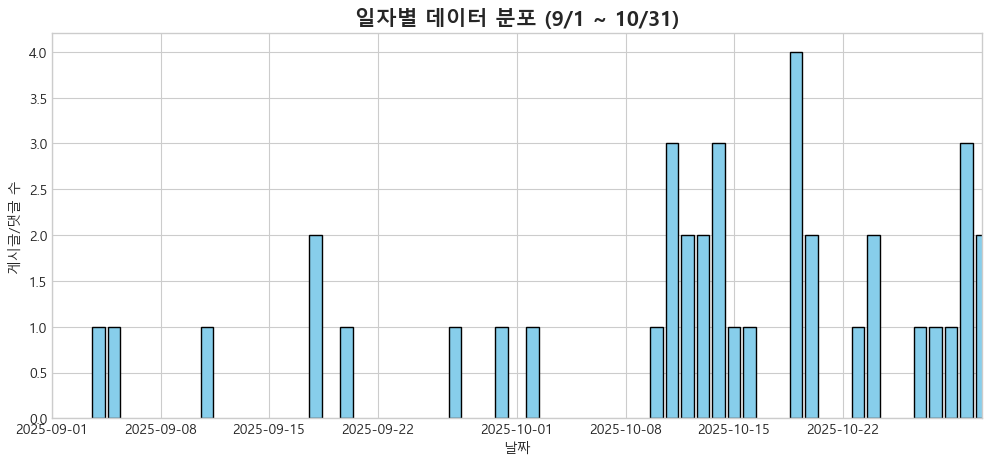

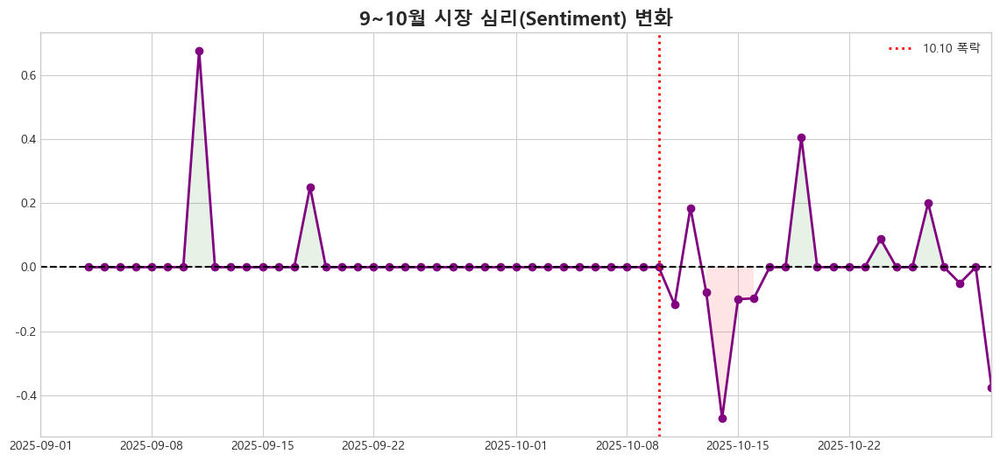

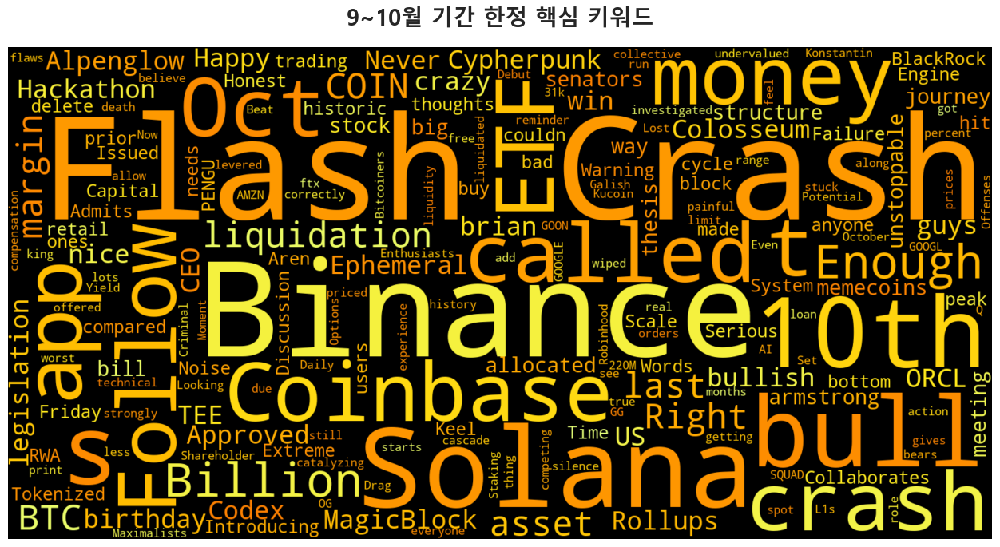

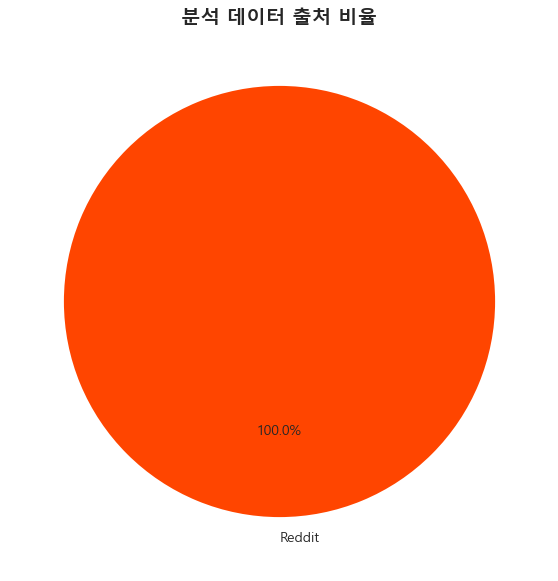

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
from collections import Counter
import networkx as nx
import koreanize_matplotlib
import os
import warnings

warnings.filterwarnings('ignore')

# ============================================================================
# 1. 환경 설정 및 데이터 로드
# ============================================================================
DATA_PATH = r'C:\junwoo\AI_Project_01_Team6\data\Community_data'
os.chdir(DATA_PATH)

print(f"🚀 [Strict Mode] 기간 한정 데이터 분석 시작 (2025.09.01 ~ 10.31)")

files = {
    'Reddit': 'MASSIVE_REDDIT_HISTORY.csv',
    'YouTube_Auto': 'YOUTUBE_AUTO_MINED_DATA.csv',
    'YouTube_History': 'YOUTUBE_HISTORY_DATA.csv'
}

dfs = []

for label, filename in files.items():
    if os.path.exists(filename):
        try:
            temp_df = pd.read_csv(filename)
            unified_df = pd.DataFrame()
            
            # 1. 텍스트 & 플랫폼 통일
            if 'Reddit' in label:
                unified_df['text'] = temp_df['title']
                unified_df['raw_date'] = temp_df['time_period'] # 원본 날짜 저장
                unified_df['platform'] = 'Reddit'
            else:
                unified_df['text'] = temp_df['text']
                if 'date' in temp_df.columns:
                    unified_df['raw_date'] = temp_df['date']
                elif 'time' in temp_df.columns: # 유튜브 일부 크롤러는 time 컬럼 사용
                    unified_df['raw_date'] = temp_df['time']
                else:
                    unified_df['raw_date'] = None
                unified_df['platform'] = 'YouTube'
            
            dfs.append(unified_df)
            print(f"  ✅ {label} 로드: {len(unified_df)}개")
            
        except Exception as e:
            print(f"  ⚠️ {label} 로드 에러: {e}")

if not dfs:
    print("❌ 데이터가 없습니다.")
    exit()

df = pd.concat(dfs, ignore_index=True)
print(f"📊 병합된 전체 데이터: {len(df)}개")

# ============================================================================
# 2. [핵심] 날짜 필터링 (2025-09-01 ~ 2025-10-31)
# ============================================================================
print("\n📅 날짜 정제 및 필터링 수행 중...")

# 1. 날짜 형식 변환 (에러 발생 시 NaT 처리)
# 'errors=coerce'는 변환 불가능한 날짜(예: "2 months ago")를 NaT(결측치)로 만듭니다.
df['date_dt'] = pd.to_datetime(df['raw_date'], errors='coerce')

# 2. 유튜브 상대 날짜 처리 ("X months ago") 이슈 대응
# 만약 날짜 변환 실패(NaT)가 많다면, 이 데이터들은 시계열 분석에서 제외됩니다.
# (정확한 분석을 위해 날짜가 불분명한 데이터는 버리는 것이 맞습니다)

# 3. 기간 필터링 적용
START_DATE = '2025-09-01'
END_DATE = '2025-10-31'

# 유효한 날짜가 있고 & 범위 내에 있는 데이터만 남김
mask = (df['date_dt'] >= START_DATE) & (df['date_dt'] <= END_DATE)
filtered_df = df.loc[mask].copy()

# 필터링 결과 리포트
dropped_count = len(df) - len(filtered_df)
print(f"  - 기간 내 데이터: {len(filtered_df)}개 (유효)")
print(f"  - 삭제된 데이터: {dropped_count}개 (범위 밖 또는 날짜 형식 불명)")

if len(filtered_df) == 0:
    print("❌ 주의: 지정된 기간 내의 데이터가 하나도 없습니다! 날짜 형식을 확인하세요.")
    print("   (팁: 유튜브 댓글의 '2 months ago' 같은 형식은 변환되지 않아 삭제되었을 수 있습니다)")
    # 비상시: 날짜가 없는 데이터도 포함하고 싶다면 아래 주석 해제
    # filtered_df = df 
else:
    df = filtered_df # 교체

# 날짜순 정렬
df = df.sort_values(by='date_dt')

# ============================================================================
# 3. 데이터 전처리 (감정 분석)
# ============================================================================
df = df.dropna(subset=['text']) # 텍스트 없는 행 삭제
df['sentiment_score'] = df['text'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)

def get_label(score):
    if score > 0.1: return 'Positive'
    elif score < -0.1: return 'Negative'
    else: return 'Neutral'
df['sentiment_label'] = df['sentiment_score'].apply(get_label)

# ============================================================================
# 4. 시각화 (Filtered Data 기반)
# ============================================================================
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'Malgun Gothic'

# [1] 일자별 데이터 수집량 (타임라인 확인)
plt.figure(figsize=(12, 5))
daily_counts = df['date_dt'].value_counts().sort_index()
plt.bar(daily_counts.index, daily_counts.values, color='skyblue', edgecolor='black')
plt.title('일자별 데이터 분포 (9/1 ~ 10/31)', fontsize=15, fontweight='bold')
plt.xlabel('날짜')
plt.ylabel('게시글/댓글 수')
plt.xlim(pd.to_datetime(START_DATE), pd.to_datetime(END_DATE)) # X축 고정
plt.savefig('FILTERED_01_Daily_Volume.png', dpi=300)
print("✅ [1] 일자별 분포 저장")

# [2] 감정 변화 추이 (시계열)
plt.figure(figsize=(14, 6))
# 일별 평균 감정 점수
daily_sentiment = df.set_index('date_dt')['sentiment_score'].resample('D').mean().fillna(0)

plt.plot(daily_sentiment.index, daily_sentiment.values, marker='o', color='purple', linewidth=2)
plt.axhline(0, color='black', linestyle='--')
plt.fill_between(daily_sentiment.index, 0, daily_sentiment.values, where=(daily_sentiment.values>=0), facecolor='green', alpha=0.1)
plt.fill_between(daily_sentiment.index, 0, daily_sentiment.values, where=(daily_sentiment.values<0), facecolor='red', alpha=0.1)

# 폭락일 강조
crash_date = pd.to_datetime('2025-10-10')
if crash_date >= daily_sentiment.index.min() and crash_date <= daily_sentiment.index.max():
    plt.axvline(x=crash_date, color='red', linestyle=':', linewidth=2, label='10.10 폭락')

plt.title('9~10월 시장 심리(Sentiment) 변화', fontsize=16, fontweight='bold')
plt.xlim(pd.to_datetime(START_DATE), pd.to_datetime(END_DATE))
plt.legend()
plt.savefig('FILTERED_02_Sentiment_Trend.png', dpi=300)
print("✅ [2] 감정 추이 저장")

# [3] 워드클라우드 (기간 한정)
all_text = " ".join(str(text) for text in df.text)
stopwords = set(STOPWORDS)
stopwords.update(['crypto', 'bitcoin', 'video', 'watch', 'market', 'price', 'people', 'know', 'think', 'will', 'http', 'https'])

wc = WordCloud(width=1600, height=800, background_color='black', colormap='Wistia', 
               stopwords=stopwords, max_words=200).generate(all_text)
plt.figure(figsize=(16, 8))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('9~10월 기간 한정 핵심 키워드', fontsize=20, fontweight='bold', pad=20)
plt.savefig('FILTERED_03_WordCloud.png', dpi=300)
print("✅ [3] 워드클라우드 저장")

# [4] 플랫폼 비중 (파이)
plt.figure(figsize=(7, 7))
df['platform'].value_counts().plot.pie(autopct='%1.1f%%', colors=['#FF4500', '#FF0000'], startangle=90)
plt.title('분석 데이터 출처 비율', fontsize=14, fontweight='bold')
plt.ylabel('')
plt.savefig('FILTERED_04_Source_Ratio.png', dpi=300)
print("✅ [4] 출처 비율 저장")

print("\n🎉 기간 한정 분석 완료!")
print(f"📂 결과 파일: FILTERED_*.png 시리즈 확인")

In [14]:
import yt_dlp
import pandas as pd
import time
import random
from youtube_comment_downloader import *
from itertools import islice

# ============================================================================
# 1. 설정: 타겟 기간 및 키워드
# ============================================================================
START_DATE = '20250901'
END_DATE = '20251031'

# 검색 키워드 (폭락장 관련)
KEYWORDS = [
    "Bitcoin crash", "Crypto market panic", "Bitcoin liquidation", 
    "Ethereum drop", "Binance news", "Altcoin crash",
    "Why crypto is down", "Bear market 2025", "Crypto portfolio loss",
    "Solana dump", "XRP crash", "Crypto news today"
]

# 목표 설정
TARGET_COMMENT_COUNT = 5000  # 목표 댓글 수
MAX_VIDEOS_TO_SCAN = 100     # 기간 내 영상 최대 확보 수
COMMENTS_PER_VIDEO = 200     # 영상당 수집 댓글 수

print(f"🚀 [Pure Miner] 기간 한정 수집 시작 ({START_DATE} ~ {END_DATE})")
print(f"🎯 목표: 순수 데이터 {TARGET_COMMENT_COUNT}개")
print("-" * 60)

# ============================================================================
# 2. [Step 1] 기간 내 영상 ID 확보 (엄격 필터링)
# ============================================================================
valid_videos = []
seen_ids = set()

ydl_opts = {
    'quiet': True,
    'extract_flat': True,       # 영상 다운로드 안함 (정보만 추출)
    'dump_single_json': True,
    'ignoreerrors': True,
}

print("🔍 1단계: 해당 기간(9~10월)에 업로드된 영상 선별 중...")

with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    for kw in KEYWORDS:
        if len(valid_videos) >= MAX_VIDEOS_TO_SCAN:
            break
            
        # 키워드당 50개씩 깊게 검색
        search_query = f"ytsearch50:{kw}"
        try:
            result = ydl.extract_info(search_query, download=False)
            
            if 'entries' not in result: continue

            for entry in result['entries']:
                if not entry: continue
                
                vid_id = entry.get('id')
                upload_date = entry.get('upload_date') # YYYYMMDD 형식
                title = entry.get('title')

                # [핵심] 날짜 필터링 (기간 밖이면 가차없이 버림)
                if upload_date and (START_DATE <= upload_date <= END_DATE):
                    if vid_id not in seen_ids:
                        seen_ids.add(vid_id)
                        valid_videos.append({
                            'id': vid_id,
                            'title': title,
                            'date': upload_date
                        })
                        print(f"  ✅ [확보] {upload_date} | {title[:30]}...")
                else:
                    # 기간 밖 영상은 스킵 (로그 생략)
                    pass
                    
        except Exception as e:
            print(f"  ⚠️ 검색 에러 ({kw}): {e}")

print(f"\n✨ 기간 내 유효 영상 확보 완료: {len(valid_videos)}개")
print("-" * 60)

# ============================================================================
# 3. [Step 2] 댓글 대량 채굴
# ============================================================================
print("⛏️ 2단계: 댓글 대량 채굴 시작...")

downloader = YoutubeCommentDownloader()
all_comments = []
total_count = 0

for idx, video in enumerate(valid_videos):
    if total_count >= TARGET_COMMENT_COUNT:
        break

    vid_id = video['id']
    vid_date = video['date'] # 영상 업로드일 (댓글 시점의 기준이 됨)
    vid_title = video['title']
    vid_url = f"https://www.youtube.com/watch?v={vid_id}"

    print(f"\n({idx+1}/{len(valid_videos)}) 댓글 수집 중: [{vid_date}] {vid_title[:30]}...")

    try:
        comments = downloader.get_comments_from_url(vid_url, sort_by=SORT_BY_POPULAR)
        
        count = 0
        for comment in islice(comments, COMMENTS_PER_VIDEO):
            # 댓글 작성 시점이 '2 months ago' 등으로 나오지만,
            # 영상 자체가 9~10월 것이므로 댓글도 그 시기(또는 직후)의 반응임이 보장됨.
            all_comments.append({
                'date': vid_date, # 분석용 날짜 (영상 업로드일 기준)
                'platform': 'YouTube',
                'video_title': vid_title,
                'author': comment['author'],
                'text': comment['text'],
                'video_id': vid_id,
                'url': vid_url
            })
            count += 1
            total_count += 1
        
        print(f"    -> {count}개 수집 (누적 {total_count}개)")
        
        # 서버 부하 방지
        time.sleep(random.uniform(1, 2))

    except Exception as e:
        print(f"    ❌ 수집 실패: {e}")

# ============================================================================
# 4. 저장
# ============================================================================
if all_comments:
    df = pd.DataFrame(all_comments)
    filename = 'YOUTUBE_PURE_TIMELINE_DATA.csv'
    
    # 중복 제거
    df = df.drop_duplicates(subset=['text', 'author'])
    
    df.to_csv(filename, index=False, encoding='utf-8-sig')

    print("\n" + "="*60)
    print(f"🎉 목표 달성 완료!")
    print(f"📅 데이터 기간: 2025.09.01 ~ 2025.10.31 (엄격 필터링)")
    print(f"📥 수집된 댓글: {len(df)}개")
    print(f"📂 파일명: {filename}")
    print("="*60)
else:
    print("\n❌ 수집된 데이터가 없습니다. 검색 키워드를 변경해보세요.")

🚀 [Pure Miner] 기간 한정 수집 시작 (20250901 ~ 20251031)
🎯 목표: 순수 데이터 5000개
------------------------------------------------------------
🔍 1단계: 해당 기간(9~10월)에 업로드된 영상 선별 중...

✨ 기간 내 유효 영상 확보 완료: 0개
------------------------------------------------------------
⛏️ 2단계: 댓글 대량 채굴 시작...

❌ 수집된 데이터가 없습니다. 검색 키워드를 변경해보세요.
